<img src="res/logo/coolpi.png" width="200">

# Notebook

# RGB to XYZ Transform Matrix Computation

# Nikon D5600

## `LR Data`

CIE XYZ ---> Computed from spectral reflectance data

X/100 Y/100 Z/100

RAW RGB ---> 16 bits; black level correction; demosaiced (undo Bayer Pattern); without normalization (illuminant-dependent)

## `WPP Data`

CIE XYZ ---> X, Y, Z Computed from spectral reflectance data. WPP --> WhitePatch Xwpp, Ywpp, Zwpp. 

X/Xwpp Y/Ywpp Z/Zwpp 

RAW RGB ---> 16 bits; black level correction; demosaiced (undo Bayer Pattern). WPP ---> WhitePatch Rwpp, Gwpp, Bwpp

R/Rwpp, G/Gwpp, B/Bwpp

In [1]:
def find_patch_max_value(data):
    max_x = data[data['X'] == data['X'].max()]
    max_y = data[data['Y'] == data['Y'].max()]
    max_z = data[data['Z'] == data['Z'].max()]
    max_r = data[data['R'] == data['R'].max()]
    max_g = data[data['G'] == data['G'].max()]
    max_b = data[data['B'] == data['B'].max()]
    patch_max = {"XYZ": {"patch_id": [max_x.patch_id.values[0], max_y.patch_id.values[0], max_z.patch_id.values[0]], "data": [max_x, max_y, max_z]}, 
                 "RGB": {"patch_id": [max_r.patch_id.values[0], max_g.patch_id.values[0], max_b.patch_id.values[0]], "data": [max_r, max_g, max_b]}}
    return patch_max

In [2]:
def apply_wpp(data, white_patch):
    white_patch_data = data[data["patch_id"]==white_patch]
    wpp_data = data.copy()

    Xmax, Ymax, Zmax = white_patch_data.X.values, white_patch_data.Y.values, white_patch_data.Z.values

    wpp_data["X"] = wpp_data.X/float(Xmax)
    wpp_data["Y"] = wpp_data.Y/float(Ymax)
    wpp_data["Z"] = wpp_data.Z/float(Zmax)

    Rmax, Gmax, Bmax = white_patch_data.R, white_patch_data.G, white_patch_data.B

    wpp_data["R"] = wpp_data.R/float(Rmax)
    wpp_data["G"] = wpp_data.G/float(Gmax)
    wpp_data["B"] = wpp_data.B/float(Bmax)

    # get only values (x,y,z) < 1 and (r,g,b)<1 (remove saturated)
    #wpp_data = wpp_data[(wpp_data["X"]<=1)&(wpp_data["Y"]<=1)&(wpp_data["Z"]<=1)&(wpp_data["R"]<=1)&(wpp_data["G"]<=1)&(wpp_data["B"]<=1)]
    return wpp_data

## Import packages 

In [3]:
import sys
sys.version

'3.9.6 (default, Aug  5 2022, 15:21:02) \n[Clang 14.0.0 (clang-1400.0.29.102)]'

In [4]:
import os
import numpy as np
import pandas as pd

%matplotlib inline

## ColourChecker

In [5]:
from coolpi.image.colourchecker import ColourCheckerSpectral

Spectral data measured using a Konica Minolta CM600-d

### CCDSG

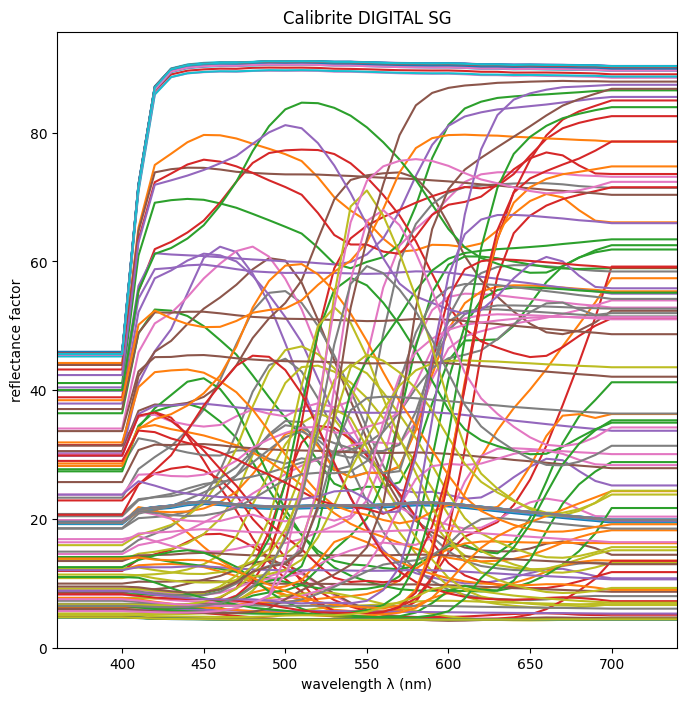

In [6]:
CCDSG = ColourCheckerSpectral("CCDSG")
CCDSG.plot_colourchecker()

### CCC

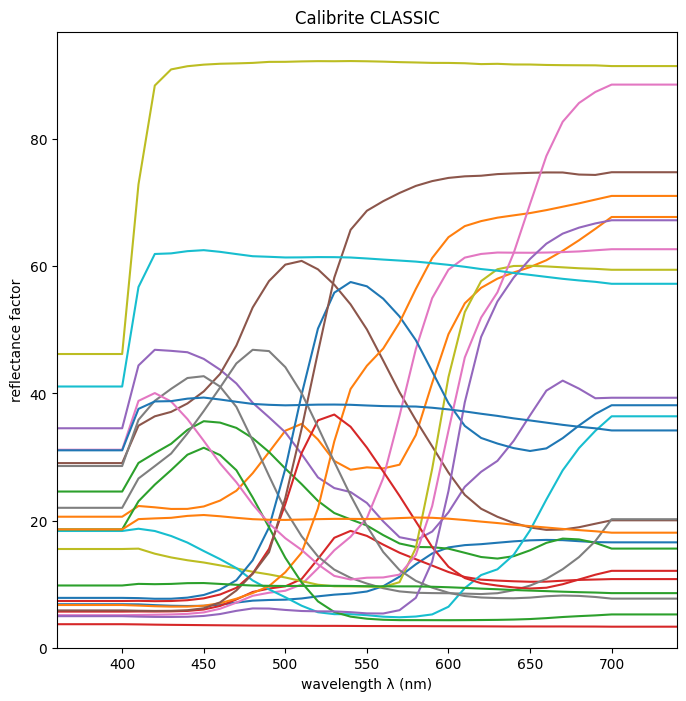

In [7]:
CCC = ColourCheckerSpectral("CCC")
CCC.plot_colourchecker()

### CCPPV

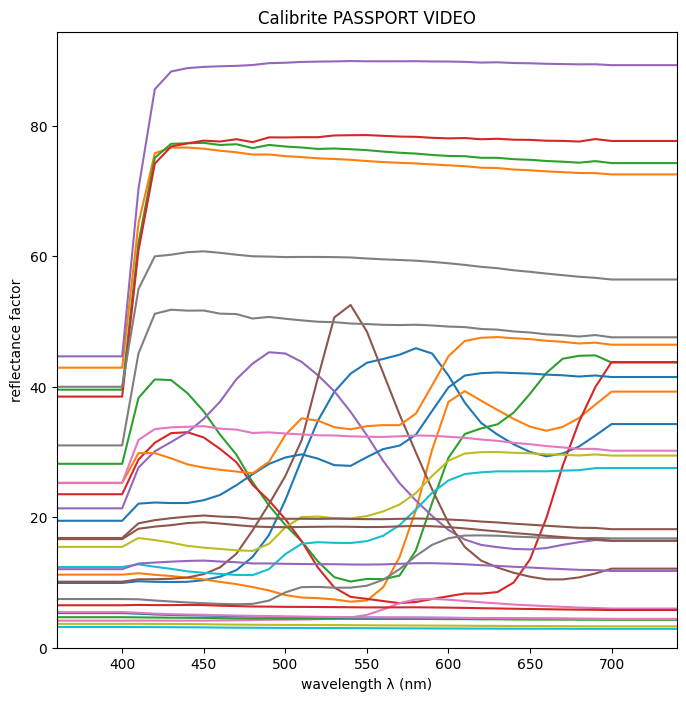

In [8]:
CCPPV = ColourCheckerSpectral("CCPPV")
CCPPV.plot_colourchecker()

### XRCCPP

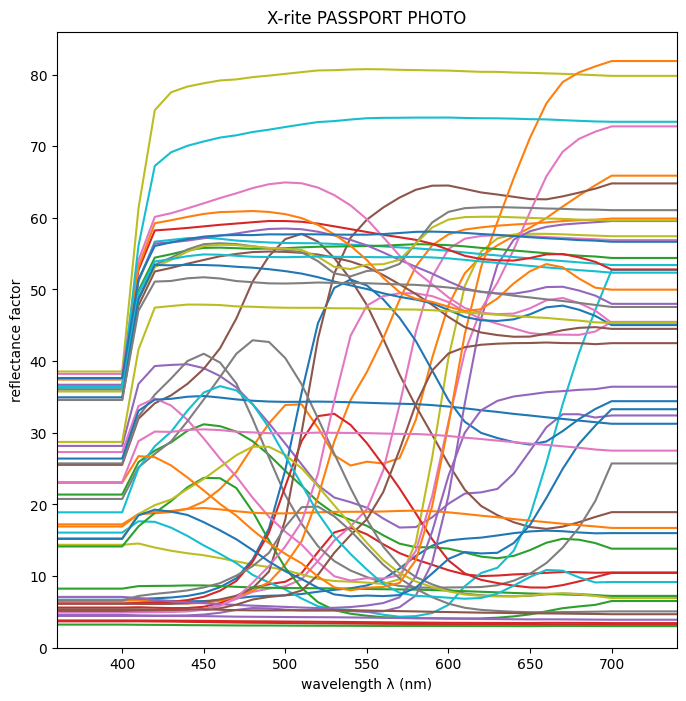

In [9]:
XRCCPP = ColourCheckerSpectral("XRCCPP")
XRCCPP.plot_colourchecker()

### SCK100

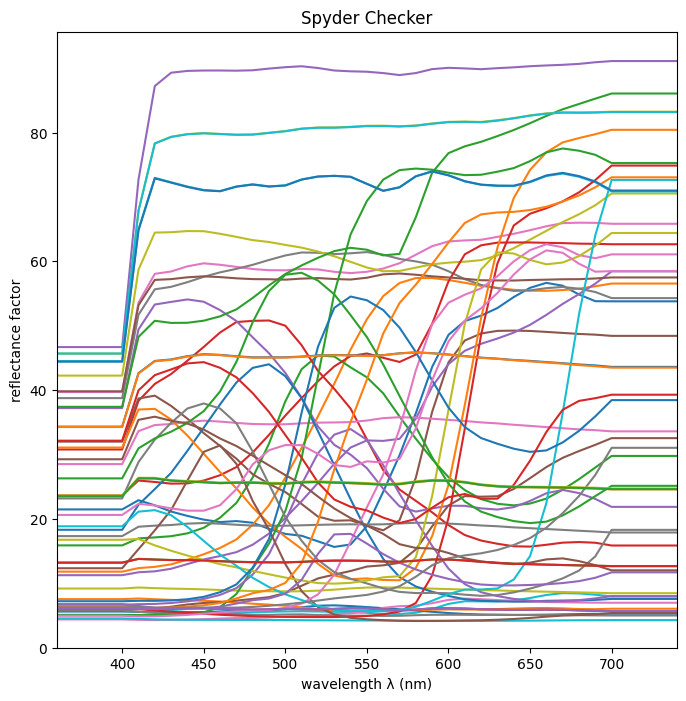

In [10]:
SCK100 = ColourCheckerSpectral("SCK100")
SCK100.plot_colourchecker()

## JND65

In [11]:
data_jnd65 = []
data_wpp_jnd65 = []

[Color Viewing Light PRO (EN)](https://www.just-normlicht.com/en/articlelist.html?id=36&name=Color%20Viewing%20Light%20PRO)

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-06-19_NikonD5600_0001.NEF | JND65-6658ºK | CCDSG  - Calibrite DIGITAL SG        | 140     |
| INDIGO_2022-06-19_NikonD5600_0002.NEF | JND65-6658ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-06-19_NikonD5600_0004.NEF | JND65-6658ºK | CCPPV - Calibrite PASSPORT VIDEO     | 24      |
| INDIGO_2022-06-19_NikonD5600_0005.NEF | JND65-6658ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-06-19_NikonD5600_0006.NEF | JND65-6658ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/JND65/INDIGO_2022-06-19_NikonD5600_0001.jpg" width="400">
<img src="res/screenshot/JND65/INDIGO_2022-06-19_NikonD5600_0002.jpg" width="400">
<img src="res/screenshot/JND65/INDIGO_2022-06-19_NikonD5600_0004.jpg" width="400">
<img src="res/screenshot/JND65/INDIGO_2022-06-19_NikonD5600_0005.jpg" width="400">
<img src="res/screenshot/JND65/INDIGO_2022-06-19_NikonD5600_0006.jpg" width="400">


## SPD Illuminant

In [12]:
from coolpi.colour.cie_colour_spectral import MeasuredIlluminant

JND65

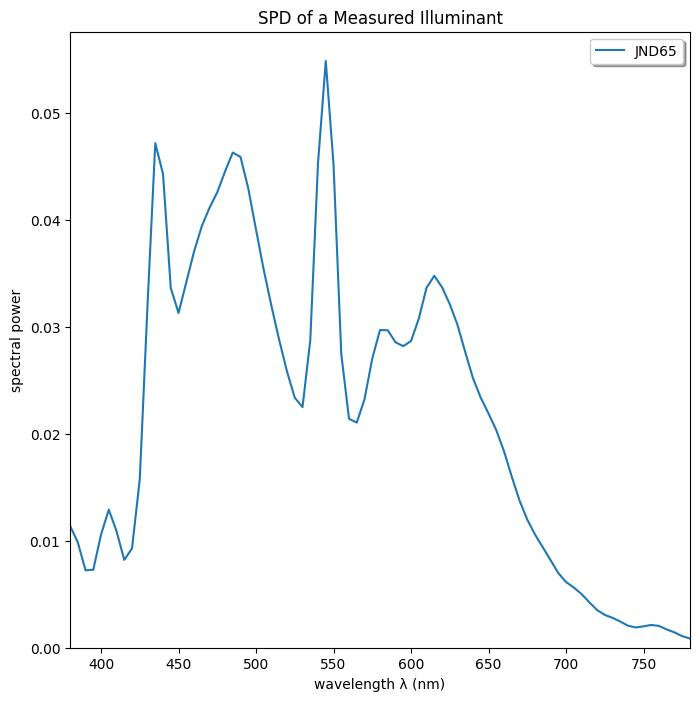

In [13]:
file_spd = ["res", "spd", "SPD_JND65_014_02°_6658K.csv"]
path_spd = os.path.join(*file_spd)

JND65 = MeasuredIlluminant(illuminant_name="JND65", path_file=path_spd)

JND65.plot()

### XYZ data (under JND65)

In [14]:
CCDSG_XYZ_JND65 = CCDSG.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

In [15]:
CCC_XYZ_JND65 = CCC.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

In [16]:
CCPPV_XYZ_JND65 = CCPPV.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

In [17]:
XRCCPP_XYZ_JND65 = XRCCPP.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

In [18]:
SCK100_XYZ_JND65 = SCK100.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

## RawImage

In [19]:
from coolpi.image.image_objects import RawImage

### CCDSG

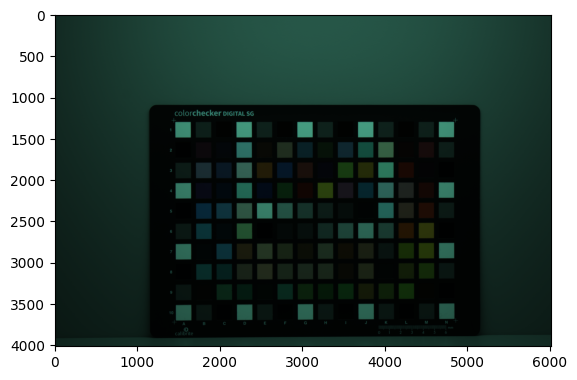

In [20]:
file_raw_0001 = ["data", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0001.NEF"]
path_raw_0001 = os.path.join(*file_raw_0001)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCDSG", "Illuminant": JND65, "Observer":2}
image_0001 = RawImage(path_raw_0001, metadata, method="postprocess")

image_0001.show(method="matplotlib")

RAW RGB data extraction

In [21]:
has_colourchecker, corners, size_rect = image_0001.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

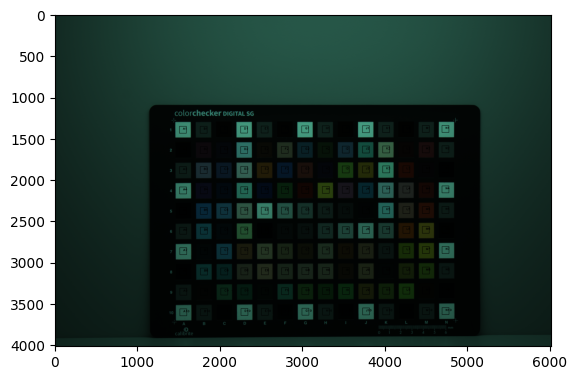

In [22]:
image_0001.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [23]:
CCDSG_RGB_JND65 = image_0001.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [24]:
data_ccdsg_jnd65 = pd.merge(CCDSG_XYZ_JND65, CCDSG_RGB_JND65, on="patch_id")
data_ccdsg_jnd65.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant JND65.,87.452653,90.869673,102.854704,MeasuredIlluminant object: Illuminant JND65.,3924.191610,8814.623583,7260.321429
1,CCDSG,A2,MeasuredIlluminant object: Illuminant JND65.,4.258184,4.393643,5.082676,MeasuredIlluminant object: Illuminant JND65.,56.113804,113.701672,92.149660
2,CCDSG,A3,MeasuredIlluminant object: Illuminant JND65.,21.315808,22.087316,25.338945,MeasuredIlluminant object: Illuminant JND65.,775.941610,1740.557256,1430.584467
3,CCDSG,A4,MeasuredIlluminant object: Illuminant JND65.,86.444293,89.813564,101.846715,MeasuredIlluminant object: Illuminant JND65.,3434.262472,7707.907029,6352.688209
4,CCDSG,A5,MeasuredIlluminant object: Illuminant JND65.,4.243028,4.379019,5.070155,MeasuredIlluminant object: Illuminant JND65.,43.717404,87.317744,70.660998
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant JND65.,4.239371,4.375919,5.066419,MeasuredIlluminant object: Illuminant JND65.,45.943311,89.025935,70.241213
136,CCDSG,N7,MeasuredIlluminant object: Illuminant JND65.,86.909252,90.297089,102.353847,MeasuredIlluminant object: Illuminant JND65.,3021.447846,6758.605159,5582.312925
137,CCDSG,N8,MeasuredIlluminant object: Illuminant JND65.,21.372877,22.146008,25.370541,MeasuredIlluminant object: Illuminant JND65.,624.605726,1392.691893,1151.072279
138,CCDSG,N9,MeasuredIlluminant object: Illuminant JND65.,4.213016,4.348211,5.021967,MeasuredIlluminant object: Illuminant JND65.,51.553571,104.466553,85.335601


Remove achromatic patches

In [25]:
data_ccdsg_jnd65 = data_ccdsg_jnd65[(data_ccdsg_jnd65["patch_id"].str.contains("1")==False) & (data_ccdsg_jnd65["patch_id"].str.contains("0")==False) & (data_ccdsg_jnd65["patch_id"].str.contains("0")==False) & (data_ccdsg_jnd65["patch_id"].str.contains("A")==False) & (data_ccdsg_jnd65["patch_id"].str.contains("N")==False)]
data_ccdsg_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JND65.,16.812716,10.802438,16.618562,MeasuredIlluminant object: Illuminant JND65.,767.647392,549.112812,747.948980
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JND65.,39.434604,32.914519,53.850763,MeasuredIlluminant object: Illuminant JND65.,1689.476474,2823.451814,3162.307256
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JND65.,15.498810,9.813851,29.505199,MeasuredIlluminant object: Illuminant JND65.,496.621032,633.023526,1272.869048
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JND65.,20.450650,22.372941,64.255072,MeasuredIlluminant object: Illuminant JND65.,469.173186,2477.882370,3537.914116
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JND65.,25.598898,32.801228,60.716527,MeasuredIlluminant object: Illuminant JND65.,680.032313,3181.295351,3443.649093
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JND65.,36.955109,22.551751,8.651562,MeasuredIlluminant object: Illuminant JND65.,1919.615646,809.962018,375.660431
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JND65.,64.824913,59.510112,11.419430,MeasuredIlluminant object: Illuminant JND65.,2796.086168,3308.958050,759.753968
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JND65.,58.147465,60.341957,8.783859,MeasuredIlluminant object: Illuminant JND65.,2310.732001,3433.235119,617.563350
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JND65.,35.900445,43.914358,9.389177,MeasuredIlluminant object: Illuminant JND65.,1185.437642,2572.534439,590.227466


In [26]:
data_jnd65.append(data_ccdsg_jnd65)

### WPP

White - E5

In [27]:
patch_max = find_patch_max_value(data_ccdsg_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [28]:
data_ccdsg_jnd65 = apply_wpp(data_ccdsg_jnd65, "E5")
data_ccdsg_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JND65.,0.192153,0.118824,0.161651,MeasuredIlluminant object: Illuminant JND65.,0.216193,0.069274,0.114293
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JND65.,0.450698,0.362052,0.523813,MeasuredIlluminant object: Illuminant JND65.,0.475808,0.356195,0.483228
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JND65.,0.177136,0.107950,0.287000,MeasuredIlluminant object: Illuminant JND65.,0.139864,0.079860,0.194506
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JND65.,0.233731,0.246097,0.625016,MeasuredIlluminant object: Illuminant JND65.,0.132133,0.312600,0.540624
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JND65.,0.292570,0.360806,0.590597,MeasuredIlluminant object: Illuminant JND65.,0.191518,0.401339,0.526220
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JND65.,0.422360,0.248064,0.084155,MeasuredIlluminant object: Illuminant JND65.,0.540622,0.102182,0.057404
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JND65.,0.740884,0.654598,0.111078,MeasuredIlluminant object: Illuminant JND65.,0.787463,0.417445,0.116097
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JND65.,0.664568,0.663748,0.085442,MeasuredIlluminant object: Illuminant JND65.,0.650772,0.433123,0.094369
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JND65.,0.410306,0.483048,0.091330,MeasuredIlluminant object: Illuminant JND65.,0.333855,0.324541,0.090192


In [29]:
data_ccdsg_jnd65.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.354949,0.342551,0.285754,0.347626,0.294564,0.266535
std,0.221834,0.220650,0.235935,0.253932,0.233389,0.249019
min,0.048370,0.048045,0.049173,0.013248,0.011769,0.011360
25%,0.168901,0.158515,0.096903,0.131883,0.101732,0.085412
50%,0.325819,0.350650,0.211067,0.310166,0.263045,0.177327
75%,0.460701,0.463334,0.413305,0.527671,0.367497,0.379310
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [30]:
data_wpp_jnd65.append(data_ccdsg_jnd65)

### CCC

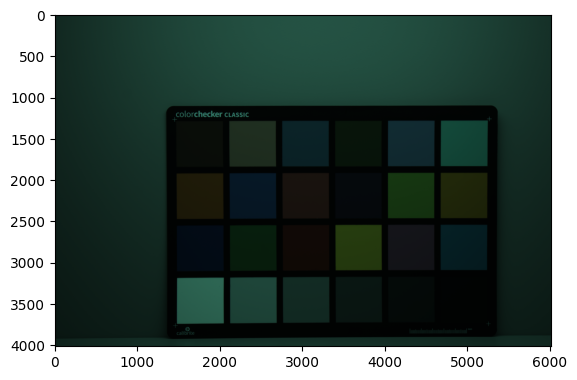

In [31]:
file_raw_0002 = ["data", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0002.NEF"]
path_raw_0002 = os.path.join(*file_raw_0002)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCC", "Illuminant": JND65, "Observer":2}
image_0002 = RawImage(path_raw_0002, metadata, method="postprocess")

image_0002.show(method="matplotlib")

RAW RGB data extraction

In [32]:
#has_colourchecker, corners, size_rect = image_0002.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT") # Fails

In [33]:
corners = {"TopLeft":[1440.11,1267.52], "TopRight":[5249.18,1260.21], "BottomRight":[5239.42,3738.93], "BottomLeft":[1448.59,3761.85]}
image_0002.extract_colourchecker_rgb_patches(checker_name="CCC", corners=corners, size_rect=100)

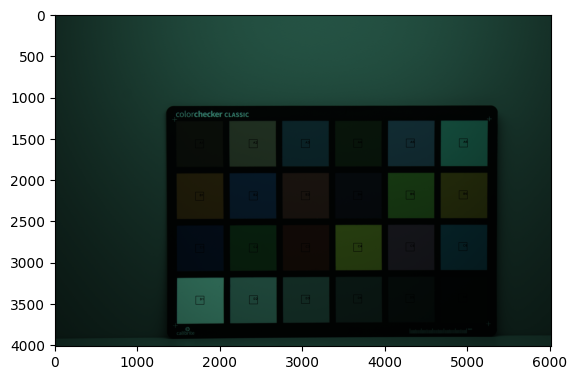

In [34]:
image_0002.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [35]:
CCC_RGB_JND65 = image_0002.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [36]:
data_ccc_jnd65 = pd.merge(CCC_XYZ_JND65, CCC_RGB_JND65, on="patch_id")
data_ccc_jnd65.insert(0, "ColourChecker", "CCC")
data_ccc_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JND65.,12.161338,10.867907,7.836733,MeasuredIlluminant object: Illuminant JND65.,592.2460,838.3808,549.6772
1,CCC,A2,MeasuredIlluminant object: Illuminant JND65.,38.866468,35.441211,27.514149,MeasuredIlluminant object: Illuminant JND65.,1974.5360,2913.0460,2021.2586
2,CCC,A3,MeasuredIlluminant object: Illuminant JND65.,18.832207,19.715033,38.196663,MeasuredIlluminant object: Illuminant JND65.,698.7996,2193.5728,2482.1554
3,CCC,A4,MeasuredIlluminant object: Illuminant JND65.,11.358989,14.067252,7.930188,MeasuredIlluminant object: Illuminant JND65.,512.3904,1307.9115,669.4297
4,CCC,A5,MeasuredIlluminant object: Illuminant JND65.,26.606501,24.792184,48.958277,MeasuredIlluminant object: Illuminant JND65.,1098.6435,2681.2013,3093.1416
5,CCC,A6,MeasuredIlluminant object: Illuminant JND65.,32.692931,44.142315,50.241153,MeasuredIlluminant object: Illuminant JND65.,1164.6678,4371.3391,3463.5920
6,CCC,B1,MeasuredIlluminant object: Illuminant JND65.,39.675712,31.089729,7.372127,MeasuredIlluminant object: Illuminant JND65.,1893.6140,1667.1332,566.9576
7,CCC,B2,MeasuredIlluminant object: Illuminant JND65.,14.502884,12.437697,43.477573,MeasuredIlluminant object: Illuminant JND65.,425.4212,1488.1216,2339.9944
8,CCC,B3,MeasuredIlluminant object: Illuminant JND65.,29.984574,19.975677,14.818104,MeasuredIlluminant object: Illuminant JND65.,1540.1636,1176.3255,901.2795
9,CCC,B4,MeasuredIlluminant object: Illuminant JND65.,9.136924,6.793883,15.973172,MeasuredIlluminant object: Illuminant JND65.,341.8180,578.8716,785.6380


In [37]:
data_jnd65.append(data_ccc_jnd65)

### WPP

White - D1

In [38]:
patch_max = find_patch_max_value(data_ccc_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [39]:
data_ccc_jnd65 = apply_wpp(data_ccc_jnd65, "D1")
data_ccc_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JND65.,0.137178,0.117951,0.075320,MeasuredIlluminant object: Illuminant JND65.,0.215617,0.135873,0.109140
1,CCC,A2,MeasuredIlluminant object: Illuminant JND65.,0.438407,0.384648,0.264442,MeasuredIlluminant object: Illuminant JND65.,0.718863,0.472106,0.401327
2,CCC,A3,MeasuredIlluminant object: Illuminant JND65.,0.212424,0.213970,0.367113,MeasuredIlluminant object: Illuminant JND65.,0.254410,0.355504,0.492840
3,CCC,A4,MeasuredIlluminant object: Illuminant JND65.,0.128127,0.152674,0.076218,MeasuredIlluminant object: Illuminant JND65.,0.186544,0.211968,0.132917
4,CCC,A5,MeasuredIlluminant object: Illuminant JND65.,0.300116,0.269073,0.470544,MeasuredIlluminant object: Illuminant JND65.,0.399979,0.434532,0.614153
5,CCC,A6,MeasuredIlluminant object: Illuminant JND65.,0.368770,0.479083,0.482874,MeasuredIlluminant object: Illuminant JND65.,0.424017,0.708446,0.687707
6,CCC,B1,MeasuredIlluminant object: Illuminant JND65.,0.447535,0.337421,0.070854,MeasuredIlluminant object: Illuminant JND65.,0.689402,0.270186,0.112571
7,CCC,B2,MeasuredIlluminant object: Illuminant JND65.,0.163590,0.134988,0.417868,MeasuredIlluminant object: Illuminant JND65.,0.154882,0.241174,0.464613
8,CCC,B3,MeasuredIlluminant object: Illuminant JND65.,0.338221,0.216799,0.142419,MeasuredIlluminant object: Illuminant JND65.,0.560722,0.190642,0.178952
9,CCC,B4,MeasuredIlluminant object: Illuminant JND65.,0.103063,0.073735,0.153520,MeasuredIlluminant object: Illuminant JND65.,0.124445,0.093815,0.155991


In [40]:
data_ccc_jnd65.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.320495,0.307067,0.271739,0.394863,0.340498,0.318604
std,0.225423,0.230327,0.233207,0.271552,0.236990,0.244629
min,0.037175,0.037063,0.038716,0.036502,0.036098,0.037318
25%,0.156987,0.141961,0.095770,0.171297,0.176950,0.130741
50%,0.271813,0.225533,0.189085,0.389410,0.286772,0.222234
75%,0.417245,0.426839,0.419261,0.592480,0.445396,0.448201
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [41]:
data_wpp_jnd65.append(data_ccc_jnd65)

### CCPPV

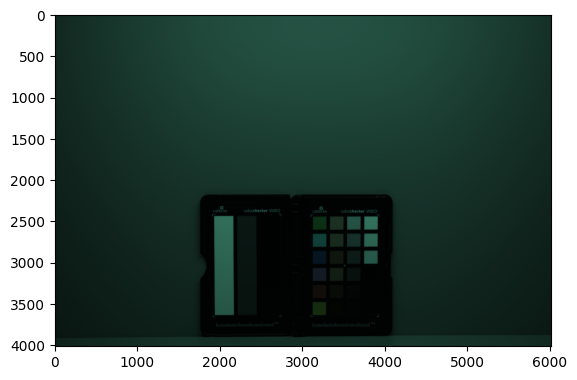

In [42]:
file_raw_0004 = ["data", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0004.NEF"]
path_raw_0004 = os.path.join(*file_raw_0004)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCPPV", "Illuminant": JND65, "Observer":2}
image_0004 = RawImage(path_raw_0004, metadata, method="postprocess")

image_0004.show(method="matplotlib")

RAW RGB data extraction

In [44]:
has_colourchecker, corners, size_rect = image_0004.automatic_colourchecker_extraction(checker_name="CCPPV_24", opencv_descriptor="SIFT")

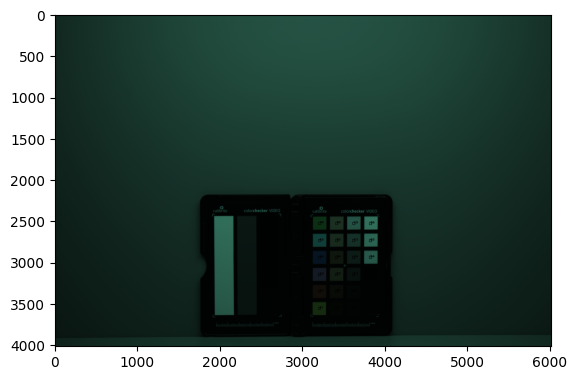

In [45]:
image_0004.show_colourchecker(checker_name="CCPPV", show_image=True, method="matplotlib")

In [46]:
CCPPV_RGB_JND65 = image_0004.get_ColourCheckerRGB("CCPPV").as_pandas_dataframe()

In [47]:
data_ccppv_jnd65 = pd.merge(CCPPV_XYZ_JND65, CCPPV_RGB_JND65, on="patch_id")
data_ccppv_jnd65.insert(0, "ColourChecker", "CCPPV")
data_ccppv_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant JND65.,33.185974,38.059578,13.907710,MeasuredIlluminant object: Illuminant JND65.,1398.871111,2797.644444,1043.433333
1,CCPPV,A2,MeasuredIlluminant object: Illuminant JND65.,23.369303,16.467034,11.490009,MeasuredIlluminant object: Illuminant JND65.,1137.351111,872.431111,601.635556
2,CCPPV,A3,MeasuredIlluminant object: Illuminant JND65.,25.331273,17.860621,37.566257,MeasuredIlluminant object: Illuminant JND65.,1250.680000,1690.113333,2292.926667
3,CCPPV,A4,MeasuredIlluminant object: Illuminant JND65.,12.235706,10.309676,33.593957,MeasuredIlluminant object: Illuminant JND65.,438.828889,1348.188889,2166.753333
4,CCPPV,A5,MeasuredIlluminant object: Illuminant JND65.,23.303309,30.223655,42.299296,MeasuredIlluminant object: Illuminant JND65.,1037.548889,4042.473333,3670.782222
5,CCPPV,A6,MeasuredIlluminant object: Illuminant JND65.,21.964544,34.132723,15.958970,MeasuredIlluminant object: Illuminant JND65.,805.328889,3090.417778,1352.080000
6,CCPPV,B1,MeasuredIlluminant object: Illuminant JND65.,6.004998,5.696336,4.767909,MeasuredIlluminant object: Illuminant JND65.,214.641111,354.645556,246.887778
7,CCPPV,B2,MeasuredIlluminant object: Illuminant JND65.,12.818795,11.644093,7.934244,MeasuredIlluminant object: Illuminant JND65.,548.773333,727.626667,423.342222
8,CCPPV,B3,MeasuredIlluminant object: Illuminant JND65.,23.338714,22.328985,17.766821,MeasuredIlluminant object: Illuminant JND65.,1184.728889,1906.413333,1238.586667
9,CCPPV,B4,MeasuredIlluminant object: Illuminant JND65.,20.224035,18.868404,13.365016,MeasuredIlluminant object: Illuminant JND65.,1002.195556,1452.411111,870.404444


In [48]:
data_jnd65.append(data_ccppv_jnd65)

### WPP

White - D6

In [49]:
patch_max = find_patch_max_value(data_ccppv_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D6', 'D6', 'D6']
['D6', 'D6', 'D6']


In [50]:
data_ccppv_jnd65 = apply_wpp(data_ccppv_jnd65, "D6")
data_ccppv_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant JND65.,0.441096,0.486206,0.158116,MeasuredIlluminant object: Illuminant JND65.,0.437133,0.391080,0.179572
1,CCPPV,A2,MeasuredIlluminant object: Illuminant JND65.,0.310616,0.210364,0.130629,MeasuredIlluminant object: Illuminant JND65.,0.355410,0.121956,0.103540
2,CCPPV,A3,MeasuredIlluminant object: Illuminant JND65.,0.336694,0.228167,0.427089,MeasuredIlluminant object: Illuminant JND65.,0.390824,0.236259,0.394606
3,CCPPV,A4,MeasuredIlluminant object: Illuminant JND65.,0.162633,0.131705,0.381928,MeasuredIlluminant object: Illuminant JND65.,0.137129,0.188462,0.372892
4,CCPPV,A5,MeasuredIlluminant object: Illuminant JND65.,0.309739,0.386103,0.480899,MeasuredIlluminant object: Illuminant JND65.,0.324223,0.565093,0.631732
5,CCPPV,A6,MeasuredIlluminant object: Illuminant JND65.,0.291945,0.436041,0.181437,MeasuredIlluminant object: Illuminant JND65.,0.251657,0.432006,0.232689
6,CCPPV,B1,MeasuredIlluminant object: Illuminant JND65.,0.079816,0.072770,0.054206,MeasuredIlluminant object: Illuminant JND65.,0.067073,0.049576,0.042489
7,CCPPV,B2,MeasuredIlluminant object: Illuminant JND65.,0.170383,0.148752,0.090204,MeasuredIlluminant object: Illuminant JND65.,0.171486,0.101714,0.072856
8,CCPPV,B3,MeasuredIlluminant object: Illuminant JND65.,0.310210,0.285250,0.201990,MeasuredIlluminant object: Illuminant JND65.,0.370215,0.266496,0.213157
9,CCPPV,B4,MeasuredIlluminant object: Illuminant JND65.,0.268811,0.241041,0.151946,MeasuredIlluminant object: Illuminant JND65.,0.313176,0.203031,0.149794


In [51]:
data_ccppv_jnd65.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.345513,0.340228,0.321919,0.344092,0.324565,0.316217
std,0.289835,0.294383,0.305549,0.282250,0.290036,0.298336
min,0.038260,0.038146,0.040089,0.012754,0.012241,0.013087
25%,0.141929,0.118546,0.088514,0.119615,0.089789,0.068650
50%,0.300842,0.246269,0.191714,0.318699,0.242160,0.222923
75%,0.439665,0.443576,0.428703,0.450577,0.433805,0.407202
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [52]:
data_wpp_jnd65.append(data_ccppv_jnd65)

### XRCCPP

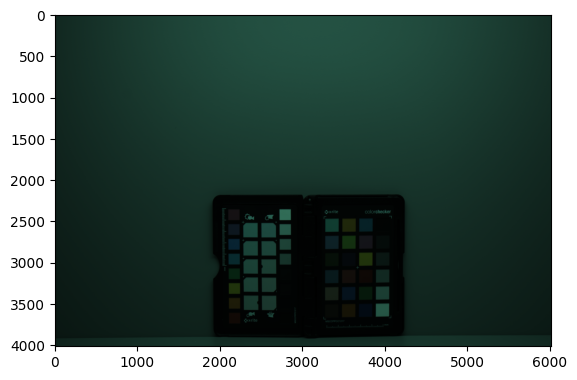

In [53]:
file_raw_0005 = ["data", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0005.NEF"]
path_raw_0005 = os.path.join(*file_raw_0005)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "XRCCPP", "Illuminant": JND65, "Observer":2}
image_0005 = RawImage(path_raw_0005, metadata, method="postprocess")

image_0005.show(method="matplotlib")

RAW RGB data extraction

In [54]:
has_colourchecker, corners, size_rect = image_0005.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

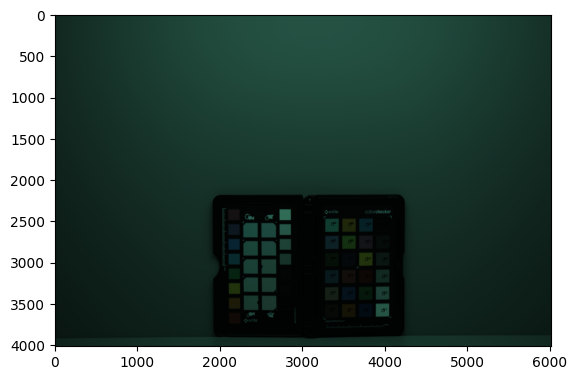

In [55]:
image_0005.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [56]:
XRCCPP_RGB_JND65 = image_0005.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [57]:
data_xrccpp_jnd65 = pd.merge(XRCCPP_XYZ_JND65, XRCCPP_RGB_JND65, on="patch_id")
data_xrccpp_jnd65.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JND65.,11.682147,10.505585,7.674905,MeasuredIlluminant object: Illuminant JND65.,414.551111,598.166667,396.282222
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JND65.,37.116775,33.598211,25.988819,MeasuredIlluminant object: Illuminant JND65.,1375.128889,2016.304444,1424.071111
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JND65.,16.659447,17.410562,33.552894,MeasuredIlluminant object: Illuminant JND65.,532.744444,1615.173333,1784.753333
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JND65.,10.422630,12.863322,7.560603,MeasuredIlluminant object: Illuminant JND65.,391.446667,986.240000,517.337778
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JND65.,22.887567,21.483147,42.083465,MeasuredIlluminant object: Illuminant JND65.,875.137778,2144.835556,2452.524444
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JND65.,30.755596,41.804348,48.179511,MeasuredIlluminant object: Illuminant JND65.,1043.680000,3909.704444,3106.533333
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JND65.,37.059534,29.218095,7.138344,MeasuredIlluminant object: Illuminant JND65.,1413.084444,1273.804444,439.753333
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JND65.,14.098856,12.210472,41.591808,MeasuredIlluminant object: Illuminant JND65.,349.066667,1188.977778,1830.933333
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JND65.,28.614627,19.048351,14.262669,MeasuredIlluminant object: Illuminant JND65.,1204.400000,902.880000,693.706667
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JND65.,8.626413,6.552984,15.146518,MeasuredIlluminant object: Illuminant JND65.,315.425556,564.655556,734.522222


In [58]:
data_jnd65.append(data_xrccpp_jnd65)

### WPP

White - D1

In [59]:
patch_max = find_patch_max_value(data_xrccpp_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [60]:
data_xrccpp_jnd65 = apply_wpp(data_xrccpp_jnd65, "D1")
data_xrccpp_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JND65.,0.151118,0.130503,0.085781,MeasuredIlluminant object: Illuminant JND65.,0.167177,0.108077,0.088279
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JND65.,0.480136,0.417365,0.290474,MeasuredIlluminant object: Illuminant JND65.,0.554550,0.364307,0.317236
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JND65.,0.215504,0.216278,0.375017,MeasuredIlluminant object: Illuminant JND65.,0.214841,0.291831,0.397584
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JND65.,0.134825,0.159791,0.084504,MeasuredIlluminant object: Illuminant JND65.,0.157859,0.178194,0.115246
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JND65.,0.296069,0.266869,0.470362,MeasuredIlluminant object: Illuminant JND65.,0.352918,0.387530,0.546341
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JND65.,0.397849,0.519303,0.538497,MeasuredIlluminant object: Illuminant JND65.,0.420886,0.706408,0.692032
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JND65.,0.479396,0.362954,0.079784,MeasuredIlluminant object: Illuminant JND65.,0.569856,0.230152,0.097962
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JND65.,0.182380,0.151681,0.464867,MeasuredIlluminant object: Illuminant JND65.,0.140769,0.214825,0.407871
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JND65.,0.370154,0.236623,0.159412,MeasuredIlluminant object: Illuminant JND65.,0.485700,0.163133,0.154535
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JND65.,0.111590,0.081403,0.169291,MeasuredIlluminant object: Illuminant JND65.,0.127202,0.102022,0.163627


In [61]:
data_xrccpp_jnd65.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.333597,0.319170,0.285568,0.384931,0.337974,0.317364
std,0.228244,0.232671,0.238927,0.266730,0.239078,0.242543
min,0.041754,0.041626,0.045276,0.051640,0.052600,0.055372
25%,0.173476,0.151689,0.100220,0.160785,0.155290,0.149971
50%,0.277177,0.238427,0.206532,0.357109,0.272407,0.247207
75%,0.436617,0.438645,0.445660,0.522291,0.458408,0.426211
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [62]:
data_wpp_jnd65.append(data_xrccpp_jnd65)

### SCK100

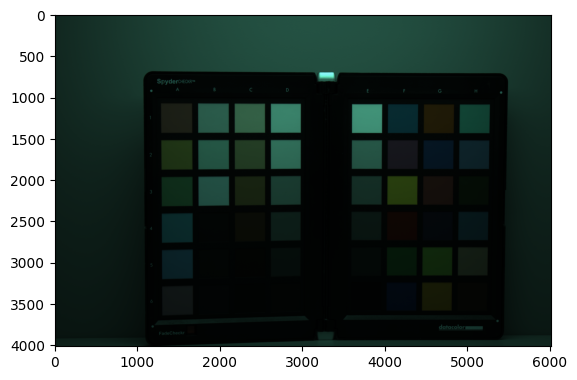

In [63]:
file_raw_0006 = ["data", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0006.NEF"]
path_raw_0006 = os.path.join(*file_raw_0006)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "SCK100", "Illuminant": JND65, "Observer":2}
image_0006 = RawImage(path_raw_0006, metadata, method="postprocess")

image_0006.show(method="matplotlib")

RAW RGB data extraction

In [64]:
has_colourchecker, corners, size_rect = image_0006.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

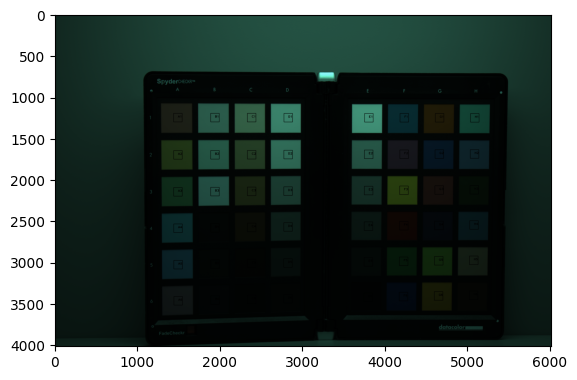

In [65]:
image_0006.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [66]:
SCK100_RGB_JND65 = image_0006.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [67]:
data_sck100_jnd65 = pd.merge(SCK100_XYZ_JND65, SCK100_RGB_JND65, on="patch_id")
data_sck100_jnd65.insert(0, "ColourChecker", "SCK100")
data_sck100_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JND65.,35.874225,28.368947,22.605637,MeasuredIlluminant object: Illuminant JND65.,1767.587463,1970.393121,1421.561206
1,SCK100,A2,MeasuredIlluminant object: Illuminant JND65.,45.853731,47.327781,18.582463,MeasuredIlluminant object: Illuminant JND65.,1939.197855,3233.103550,1353.677515
2,SCK100,A3,MeasuredIlluminant object: Illuminant JND65.,26.942344,35.791162,24.707532,MeasuredIlluminant object: Illuminant JND65.,918.217271,2764.186945,1617.272374
3,SCK100,A4,MeasuredIlluminant object: Illuminant JND65.,25.687339,31.474444,53.628007,MeasuredIlluminant object: Illuminant JND65.,655.805473,2573.927515,2613.586816
4,SCK100,A5,MeasuredIlluminant object: Illuminant JND65.,27.692130,28.648195,58.413829,MeasuredIlluminant object: Illuminant JND65.,656.995562,2072.131287,2389.382766
5,SCK100,A6,MeasuredIlluminant object: Illuminant JND65.,34.759433,27.434498,36.299202,MeasuredIlluminant object: Illuminant JND65.,971.375647,1306.974020,1284.970599
6,SCK100,B1,MeasuredIlluminant object: Illuminant JND65.,59.205677,60.016335,67.157318,MeasuredIlluminant object: Illuminant JND65.,2682.466531,5755.151997,4721.770895
7,SCK100,B2,MeasuredIlluminant object: Illuminant JND65.,56.316642,60.017468,65.913078,MeasuredIlluminant object: Illuminant JND65.,2267.640717,5329.955806,4266.462278
8,SCK100,B3,MeasuredIlluminant object: Illuminant JND65.,58.641979,60.245612,72.835623,MeasuredIlluminant object: Illuminant JND65.,2143.026997,4880.701923,4179.254438
9,SCK100,B4,MeasuredIlluminant object: Illuminant JND65.,6.017710,5.838285,6.322340,MeasuredIlluminant object: Illuminant JND65.,177.337648,325.414941,266.700814


In [68]:
data_jnd65.append(data_sck100_jnd65)

### WPP

White - E1

In [69]:
patch_max = find_patch_max_value(data_sck100_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [70]:
data_sck100_jnd65 = apply_wpp(data_sck100_jnd65, "E1")
data_sck100_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JND65.,0.414756,0.316406,0.222303,MeasuredIlluminant object: Illuminant JND65.,0.427935,0.212665,0.186981
1,SCK100,A2,MeasuredIlluminant object: Illuminant JND65.,0.530133,0.527859,0.182739,MeasuredIlluminant object: Illuminant JND65.,0.469482,0.348949,0.178052
2,SCK100,A3,MeasuredIlluminant object: Illuminant JND65.,0.311491,0.399188,0.242973,MeasuredIlluminant object: Illuminant JND65.,0.222302,0.298339,0.212724
3,SCK100,A4,MeasuredIlluminant object: Illuminant JND65.,0.296982,0.351042,0.527375,MeasuredIlluminant object: Illuminant JND65.,0.158771,0.277804,0.343771
4,SCK100,A5,MeasuredIlluminant object: Illuminant JND65.,0.320160,0.319521,0.574439,MeasuredIlluminant object: Illuminant JND65.,0.159059,0.223645,0.314281
5,SCK100,A6,MeasuredIlluminant object: Illuminant JND65.,0.401868,0.305984,0.356965,MeasuredIlluminant object: Illuminant JND65.,0.235171,0.141062,0.169015
6,SCK100,B1,MeasuredIlluminant object: Illuminant JND65.,0.684500,0.669377,0.660422,MeasuredIlluminant object: Illuminant JND65.,0.649429,0.621154,0.621065
7,SCK100,B2,MeasuredIlluminant object: Illuminant JND65.,0.651099,0.669390,0.648186,MeasuredIlluminant object: Illuminant JND65.,0.548999,0.575262,0.561178
8,SCK100,B3,MeasuredIlluminant object: Illuminant JND65.,0.677983,0.671935,0.716262,MeasuredIlluminant object: Illuminant JND65.,0.518830,0.526774,0.549707
9,SCK100,B4,MeasuredIlluminant object: Illuminant JND65.,0.069573,0.065116,0.062174,MeasuredIlluminant object: Illuminant JND65.,0.042934,0.035122,0.035080


In [71]:
data_sck100_jnd65.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.350192,0.339869,0.304172,0.285550,0.256958,0.242238
std,0.246506,0.247714,0.250236,0.249468,0.237315,0.238101
min,0.047086,0.047152,0.048495,0.019197,0.018976,0.019278
25%,0.144442,0.137064,0.082608,0.083234,0.073966,0.055447
50%,0.315825,0.295484,0.232638,0.218603,0.183355,0.163209
75%,0.511791,0.486081,0.460440,0.438322,0.359683,0.331954
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [72]:
data_wpp_jnd65.append(data_sck100_jnd65)

## Merge data

In [73]:
data_pd_jnd65 = pd.concat(data_jnd65, ignore_index=True)

data_pd_jnd65 = data_pd_jnd65.drop(columns="illuminant_y")
data_pd_jnd65 = data_pd_jnd65.rename(columns={"illuminant_x":"illuminant"})
data_pd_jnd65["illuminant"] = "JND65" # as str to avoid error
data_pd_jnd65

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JND65,16.812716,10.802438,16.618562,767.647392,549.112812,747.948980
1,CCDSG,B3,JND65,39.434604,32.914519,53.850763,1689.476474,2823.451814,3162.307256
2,CCDSG,B4,JND65,15.498810,9.813851,29.505199,496.621032,633.023526,1272.869048
3,CCDSG,B5,JND65,20.450650,22.372941,64.255072,469.173186,2477.882370,3537.914116
4,CCDSG,B6,JND65,25.598898,32.801228,60.716527,680.032313,3181.295351,3443.649093
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,JND65,25.633882,24.165697,47.735452,844.710244,2120.215422,2493.798632
212,SCK100,H3,JND65,10.410667,13.042793,7.622017,300.713757,794.090976,368.719675
213,SCK100,H4,JND65,18.154503,19.182975,36.995415,430.515533,1382.834689,1548.866494
214,SCK100,H5,JND65,37.817679,34.640957,26.945944,1169.523854,1740.699889,1196.691383


In [74]:
data_pd_wpp_jnd65 = pd.concat(data_wpp_jnd65, ignore_index=True)

data_pd_wpp_jnd65 = data_pd_wpp_jnd65.drop(columns="illuminant_y")
data_pd_wpp_jnd65 = data_pd_wpp_jnd65.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_jnd65["illuminant"] = "JND65" # as str to avoid error
data_pd_wpp_jnd65

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JND65,0.192153,0.118824,0.161651,0.216193,0.069274,0.114293
1,CCDSG,B3,JND65,0.450698,0.362052,0.523813,0.475808,0.356195,0.483228
2,CCDSG,B4,JND65,0.177136,0.107950,0.287000,0.139864,0.079860,0.194506
3,CCDSG,B5,JND65,0.233731,0.246097,0.625016,0.132133,0.312600,0.540624
4,CCDSG,B6,JND65,0.292570,0.360806,0.590597,0.191518,0.401339,0.526220
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,JND65,0.296364,0.269526,0.469428,0.204505,0.228835,0.328015
212,SCK100,H3,JND65,0.120362,0.145470,0.074955,0.072803,0.085706,0.048499
213,SCK100,H4,JND65,0.209891,0.213953,0.363811,0.104228,0.149249,0.203726
214,SCK100,H5,JND65,0.437225,0.386359,0.264985,0.283143,0.187874,0.157404


## JNA

In [75]:
data_jna = []
data_wpp_jna = []

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-06-19_NikonD5600_0013.NEF | JNA-2681ºK   | CCDSG  - Calibrite DIGITAL SG        | 140     |
| INDIGO_2022-06-19_NikonD5600_0014.NEF | JNA-2681ºK   | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-06-19_NikonD5600_0016.NEF | JNA-2681ºK   | CCPPV - Calibrite PASSPORT VIDEO     | 24      |
| INDIGO_2022-06-19_NikonD5600_0017.NEF | JNA-2681ºK   | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-06-19_NikonD5600_0018.NEF | JNA-2681ºK   | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/JNA/INDIGO_2022-06-19_NikonD5600_0013.jpg" width="400">
<img src="res/screenshot/JNA/INDIGO_2022-06-19_NikonD5600_0014.jpg" width="400">
<img src="res/screenshot/JNA/INDIGO_2022-06-19_NikonD5600_0016.jpg" width="400">
<img src="res/screenshot/JNA/INDIGO_2022-06-19_NikonD5600_0017.jpg" width="400">
<img src="res/screenshot/JNA/INDIGO_2022-06-19_NikonD5600_0018.jpg" width="400">


## SPD Illuminant

JNA

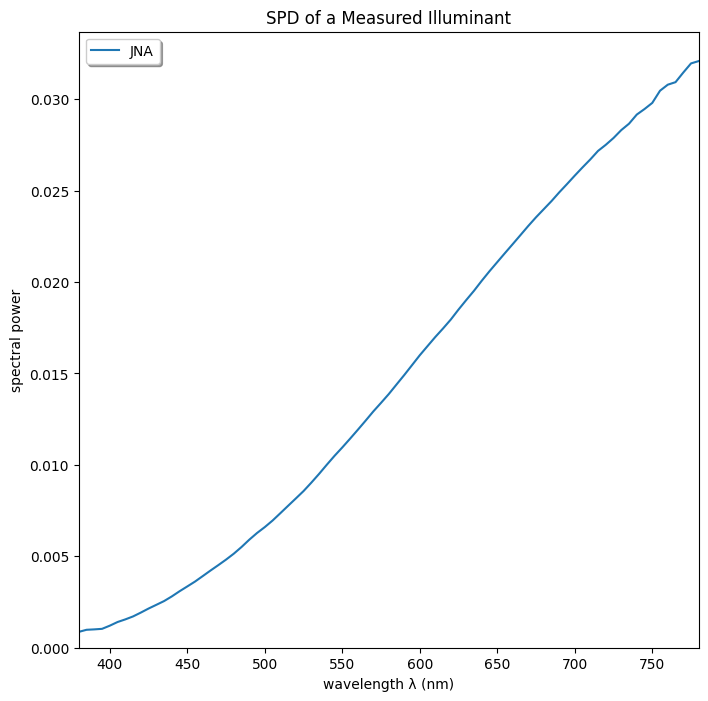

In [76]:
file_spd = ["res", "spd", "SPD_JNA_015_02°_2681K.csv"]
path_spd = os.path.join(*file_spd)

JNA = MeasuredIlluminant(illuminant_name="JNA", path_file=path_spd)

JNA.plot()

XYZ data (under JNA)

In [77]:
CCDSG_XYZ_JNA = CCDSG.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

In [78]:
CCC_XYZ_JNA = CCC.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

In [79]:
CCPPV_XYZ_JNA = CCPPV.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

In [80]:
XRCCPP_XYZ_JNA = XRCCPP.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

In [81]:
SCK100_XYZ_JNA = SCK100.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

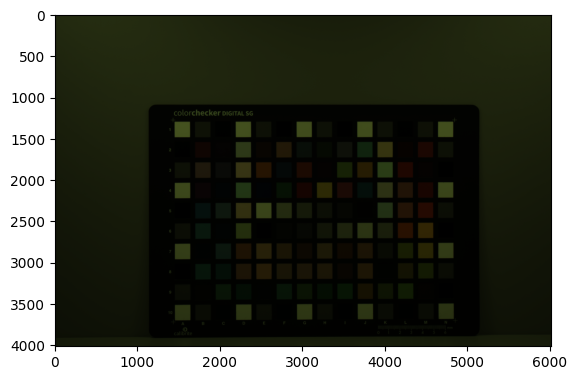

In [82]:
file_raw_0013 = ["data", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0013.NEF"]
path_raw_0013 = os.path.join(*file_raw_0013)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCDSG", "Illuminant": JNA, "Observer":2}
image_0013 = RawImage(path_raw_0013, metadata, method="postprocess")

image_0013.show(method="matplotlib")

RAW RGB data extraction

In [83]:
has_colourchecker, corners, size_rect = image_0013.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

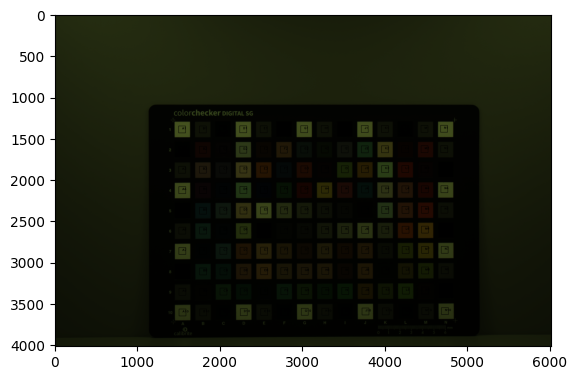

In [84]:
image_0013.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [85]:
CCDSG_RGB_JNA = image_0013.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [86]:
data_ccdsg_jna = pd.merge(CCDSG_XYZ_JNA, CCDSG_RGB_JNA, on="patch_id")
data_ccdsg_jna.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant JNA.,101.634450,90.808205,27.586741,MeasuredIlluminant object: Illuminant JNA.,4397.091270,5236.132653,2009.913265
1,CCDSG,A2,MeasuredIlluminant object: Illuminant JNA.,4.937454,4.394577,1.361311,MeasuredIlluminant object: Illuminant JNA.,58.833333,63.931689,24.934240
2,CCDSG,A3,MeasuredIlluminant object: Illuminant JNA.,24.599087,22.062397,6.786872,MeasuredIlluminant object: Illuminant JNA.,863.439909,1035.687075,395.241213
3,CCDSG,A4,MeasuredIlluminant object: Illuminant JNA.,100.420298,89.736407,27.313159,MeasuredIlluminant object: Illuminant JNA.,3850.053855,4580.650227,1756.119615
4,CCDSG,A5,MeasuredIlluminant object: Illuminant JNA.,4.918034,4.378945,1.357804,MeasuredIlluminant object: Illuminant JNA.,47.045918,51.440476,20.768707
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant JNA.,4.913907,4.375571,1.356933,MeasuredIlluminant object: Illuminant JNA.,48.439201,51.050737,20.110402
136,CCDSG,N7,MeasuredIlluminant object: Illuminant JNA.,100.974118,90.224520,27.448508,MeasuredIlluminant object: Illuminant JNA.,3200.336735,3794.991497,1444.061224
137,CCDSG,N8,MeasuredIlluminant object: Illuminant JNA.,24.674884,22.124883,6.796033,MeasuredIlluminant object: Illuminant JNA.,659.954649,784.141156,299.164399
138,CCDSG,N9,MeasuredIlluminant object: Illuminant JNA.,4.886935,4.349395,1.345346,MeasuredIlluminant object: Illuminant JNA.,54.446712,59.994048,24.015306


In [88]:
data_ccdsg_jna = data_ccdsg_jna[(data_ccdsg_jna["patch_id"].str.contains("1")==False) & (data_ccdsg_jna["patch_id"].str.contains("0")==False) & (data_ccdsg_jna["patch_id"].str.contains("0")==False) & (data_ccdsg_jna["patch_id"].str.contains("A")==False) & (data_ccdsg_jna["patch_id"].str.contains("N")==False)]
data_ccdsg_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JNA.,23.260021,13.376909,4.184976,MeasuredIlluminant object: Illuminant JNA.,1006.273810,339.594104,180.196145
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JNA.,46.745364,34.688946,13.982877,MeasuredIlluminant object: Illuminant JNA.,1926.483844,1555.609127,779.757086
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JNA.,17.697077,10.910268,7.296986,MeasuredIlluminant object: Illuminant JNA.,598.218112,292.304422,273.289257
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JNA.,15.405257,17.531298,16.958977,MeasuredIlluminant object: Illuminant JNA.,373.148951,1050.082341,849.508078
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JNA.,22.593956,27.131710,16.412535,MeasuredIlluminant object: Illuminant JNA.,603.346655,1530.789683,890.918367
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JNA.,56.523863,30.993538,2.319888,MeasuredIlluminant object: Illuminant JNA.,2371.821429,694.168084,135.160147
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JNA.,90.092730,69.357131,3.376821,MeasuredIlluminant object: Illuminant JNA.,3176.888889,2396.082766,302.975057
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JNA.,79.056163,66.820673,2.832905,MeasuredIlluminant object: Illuminant JNA.,2596.775935,2403.174178,291.289116
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JNA.,45.635162,45.239273,2.981263,MeasuredIlluminant object: Illuminant JNA.,1260.015873,1693.740363,244.529478


In [89]:
data_jna.append(data_ccdsg_jna)

### WPP

White - E5

In [90]:
patch_max = find_patch_max_value(data_ccdsg_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [91]:
data_ccdsg_jna = apply_wpp(data_ccdsg_jna, "E5")
data_ccdsg_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JNA.,0.228685,0.147222,0.151768,MeasuredIlluminant object: Illuminant JNA.,0.275118,0.078504,0.108904
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JNA.,0.459586,0.381776,0.507088,MeasuredIlluminant object: Illuminant JNA.,0.526706,0.359610,0.471256
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JNA.,0.173992,0.120075,0.264624,MeasuredIlluminant object: Illuminant JNA.,0.163555,0.067572,0.165166
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JNA.,0.151460,0.192944,0.615016,MeasuredIlluminant object: Illuminant JNA.,0.102020,0.242747,0.513411
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JNA.,0.222137,0.298604,0.595199,MeasuredIlluminant object: Illuminant JNA.,0.164957,0.353872,0.538438
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JNA.,0.555725,0.341106,0.084131,MeasuredIlluminant object: Illuminant JNA.,0.648463,0.160471,0.081686
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JNA.,0.885764,0.763324,0.122460,MeasuredIlluminant object: Illuminant JNA.,0.868570,0.553902,0.183107
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JNA.,0.777256,0.735409,0.102735,MeasuredIlluminant object: Illuminant JNA.,0.709966,0.555541,0.176044
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JNA.,0.448671,0.497890,0.108115,MeasuredIlluminant object: Illuminant JNA.,0.344492,0.391542,0.147784


In [92]:
data_ccdsg_jna.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.375617,0.354626,0.288844,0.358680,0.303533,0.273946
std,0.243271,0.227140,0.234254,0.265730,0.231705,0.237410
min,0.048239,0.048074,0.049099,0.012771,0.011586,0.012013
25%,0.155501,0.172408,0.106853,0.121623,0.117889,0.106814
50%,0.360115,0.327063,0.211628,0.318293,0.285347,0.195029
75%,0.530731,0.475560,0.399212,0.549988,0.395957,0.367353
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [93]:
data_wpp_jna.append(data_ccdsg_jna)

### CCC

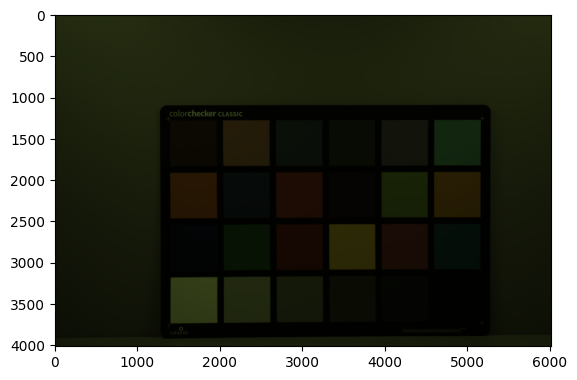

In [94]:
file_raw_0014 = ["data", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0014.NEF"]
path_raw_0014 = os.path.join(*file_raw_0014)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCC", "Illuminant": JNA, "Observer":2}
image_0014 = RawImage(path_raw_0014, metadata, method="postprocess")

image_0014.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0014.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT") # Fails

In [95]:
corners = {"TopLeft":[1363.14,1258.43], "TopRight":[5163.88,1253.29], "BottomRight":[5162.45,3729.84], "BottomLeft":[1371.64,3757]}
image_0014.extract_colourchecker_rgb_patches(checker_name="CCC", corners=corners, size_rect=100)

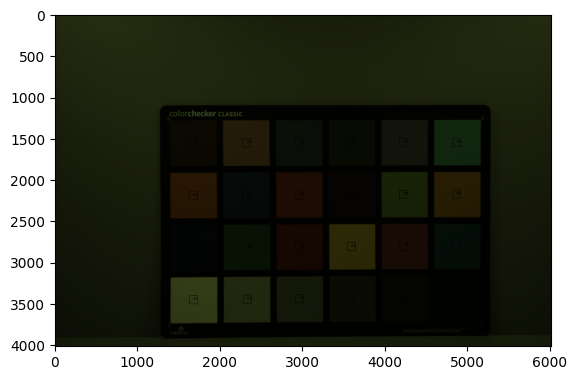

In [96]:
image_0014.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [97]:
CCC_RGB_JNA = image_0014.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [98]:
data_ccc_jna = pd.merge(CCC_XYZ_JNA, CCC_RGB_JNA, on="patch_id")
data_ccc_jna.insert(0, "ColourChecker", "CCC")
data_ccc_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JNA.,16.051525,12.142073,2.138677,MeasuredIlluminant object: Illuminant JNA.,739.0506,583.8084,173.4736
1,CCC,A2,MeasuredIlluminant object: Illuminant JNA.,51.700159,38.684052,7.649494,MeasuredIlluminant object: Illuminant JNA.,2272.2632,1752.9414,576.3794
2,CCC,A3,MeasuredIlluminant object: Illuminant JNA.,18.461653,17.907433,10.063285,MeasuredIlluminant object: Illuminant JNA.,639.1638,1004.7106,562.2000
3,CCC,A4,MeasuredIlluminant object: Illuminant JNA.,13.692592,13.833900,2.277151,MeasuredIlluminant object: Illuminant JNA.,523.2026,747.9158,197.0630
4,CCC,A5,MeasuredIlluminant object: Illuminant JNA.,28.660417,23.741168,12.742567,MeasuredIlluminant object: Illuminant JNA.,1181.6184,1306.2644,729.9134
5,CCC,A6,MeasuredIlluminant object: Illuminant JNA.,33.432979,39.228057,13.989963,MeasuredIlluminant object: Illuminant JNA.,1168.0536,2420.9104,990.3906
6,CCC,B1,MeasuredIlluminant object: Illuminant JNA.,57.141817,38.754380,2.140547,MeasuredIlluminant object: Illuminant JNA.,2429.5422,1392.6186,226.4394
7,CCC,B2,MeasuredIlluminant object: Illuminant JNA.,11.598409,10.580487,11.096199,MeasuredIlluminant object: Illuminant JNA.,398.4522,655.0318,537.9898
8,CCC,B3,MeasuredIlluminant object: Illuminant JNA.,43.140916,25.276423,3.906189,MeasuredIlluminant object: Illuminant JNA.,1870.7090,799.3910,252.8376
9,CCC,B4,MeasuredIlluminant object: Illuminant JNA.,10.938666,7.306632,4.043757,MeasuredIlluminant object: Illuminant JNA.,403.6939,288.7706,176.9474


In [99]:
data_jna.append(data_ccc_jna)

### WPP

White - D1

In [100]:
patch_max = find_patch_max_value(data_ccc_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [101]:
data_ccc_jna = apply_wpp(data_ccc_jna, "D1")
data_ccc_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JNA.,0.155738,0.131843,0.076627,MeasuredIlluminant object: Illuminant JNA.,0.234042,0.155325,0.121080
1,CCC,A2,MeasuredIlluminant object: Illuminant JNA.,0.501614,0.420046,0.274074,MeasuredIlluminant object: Illuminant JNA.,0.719578,0.466380,0.402296
2,CCC,A3,MeasuredIlluminant object: Illuminant JNA.,0.179122,0.194445,0.360558,MeasuredIlluminant object: Illuminant JNA.,0.202410,0.267309,0.392399
3,CCC,A4,MeasuredIlluminant object: Illuminant JNA.,0.132851,0.150214,0.081588,MeasuredIlluminant object: Illuminant JNA.,0.165687,0.198987,0.137544
4,CCC,A5,MeasuredIlluminant object: Illuminant JNA.,0.278074,0.257790,0.456554,MeasuredIlluminant object: Illuminant JNA.,0.374194,0.347539,0.509458
5,CCC,A6,MeasuredIlluminant object: Illuminant JNA.,0.324379,0.425953,0.501247,MeasuredIlluminant object: Illuminant JNA.,0.369898,0.644097,0.691264
6,CCC,B1,MeasuredIlluminant object: Illuminant JNA.,0.554411,0.420809,0.076694,MeasuredIlluminant object: Illuminant JNA.,0.769385,0.370514,0.158048
7,CCC,B2,MeasuredIlluminant object: Illuminant JNA.,0.112532,0.114887,0.397566,MeasuredIlluminant object: Illuminant JNA.,0.126181,0.174275,0.375501
8,CCC,B3,MeasuredIlluminant object: Illuminant JNA.,0.418569,0.274461,0.139955,MeasuredIlluminant object: Illuminant JNA.,0.592414,0.212682,0.176473
9,CCC,B4,MeasuredIlluminant object: Illuminant JNA.,0.106131,0.079338,0.144884,MeasuredIlluminant object: Illuminant JNA.,0.127841,0.076829,0.123504


In [102]:
data_ccc_jna.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.337456,0.316823,0.273172,0.393925,0.334997,0.311998
std,0.249766,0.237550,0.230283,0.285649,0.241038,0.227582
min,0.036799,0.036920,0.038614,0.037435,0.037145,0.039529
25%,0.130354,0.145621,0.105422,0.150942,0.169538,0.152922
50%,0.301227,0.247651,0.185705,0.372046,0.252312,0.244274
75%,0.444090,0.422095,0.404181,0.610465,0.470895,0.402328
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [103]:
data_wpp_jna.append(data_ccc_jna)

### CCPPV

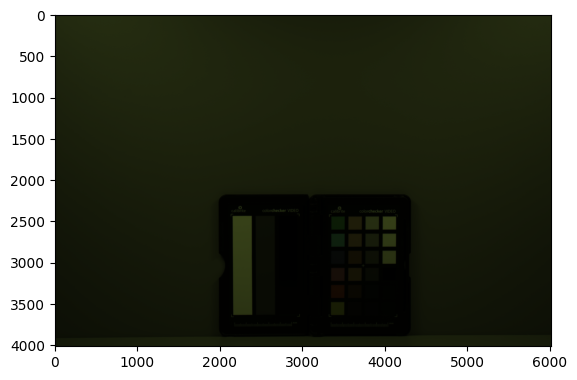

In [104]:
file_raw_0016 = ["data", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0016.NEF"]
path_raw_0016 = os.path.join(*file_raw_0016)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCPPV", "Illuminant": JNA, "Observer":2}
image_0016 = RawImage(path_raw_0016, metadata, method="postprocess")

image_0016.show(method="matplotlib")

RAW RGB data extraction

In [105]:
has_colourchecker, corners, size_rect = image_0016.automatic_colourchecker_extraction(checker_name="CCPPV_24", opencv_descriptor="SIFT")

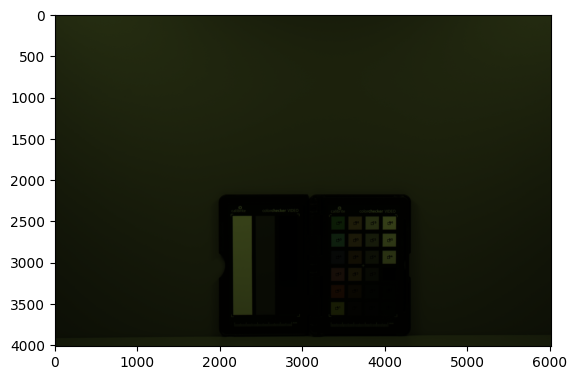

In [106]:
image_0016.show_colourchecker(checker_name="CCPPV", show_image=True, method="matplotlib")

In [107]:
CCPPV_RGB_JNA = image_0016.get_ColourCheckerRGB("CCPPV").as_pandas_dataframe()

In [108]:
data_ccppv_jna = pd.merge(CCPPV_XYZ_JNA, CCPPV_RGB_JNA, on="patch_id")
data_ccppv_jna.insert(0, "ColourChecker", "CCPPV")
data_ccppv_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant JNA.,42.347815,39.626394,4.152275,MeasuredIlluminant object: Illuminant JNA.,1544.122222,1841.995556,367.026667
1,CCPPV,A2,MeasuredIlluminant object: Illuminant JNA.,32.407137,20.531784,3.023558,MeasuredIlluminant object: Illuminant JNA.,1347.208889,644.622222,170.973333
2,CCPPV,A3,MeasuredIlluminant object: Illuminant JNA.,30.179363,19.743276,9.500557,MeasuredIlluminant object: Illuminant JNA.,1448.837778,906.641111,532.826667
3,CCPPV,A4,MeasuredIlluminant object: Illuminant JNA.,11.380606,9.319031,8.593446,MeasuredIlluminant object: Illuminant JNA.,458.888889,579.075556,490.373333
4,CCPPV,A5,MeasuredIlluminant object: Illuminant JNA.,22.982946,26.417862,11.610039,MeasuredIlluminant object: Illuminant JNA.,965.156667,2023.622222,952.526667
5,CCPPV,A6,MeasuredIlluminant object: Illuminant JNA.,24.383581,31.197295,4.805476,MeasuredIlluminant object: Illuminant JNA.,776.611111,1784.395556,437.457778
6,CCPPV,B1,MeasuredIlluminant object: Illuminant JNA.,7.524356,6.161376,1.286322,MeasuredIlluminant object: Illuminant JNA.,243.682222,229.517778,72.871111
7,CCPPV,B2,MeasuredIlluminant object: Illuminant JNA.,16.876931,12.952232,2.169441,MeasuredIlluminant object: Illuminant JNA.,634.935556,483.300000,129.548889
8,CCPPV,B3,MeasuredIlluminant object: Illuminant JNA.,29.798475,23.927505,4.836489,MeasuredIlluminant object: Illuminant JNA.,1341.453333,1184.597778,357.093333
9,CCPPV,B4,MeasuredIlluminant object: Illuminant JNA.,26.407651,20.648740,3.655918,MeasuredIlluminant object: Illuminant JNA.,1134.311111,925.213333,256.120000


In [109]:
data_jna.append(data_ccppv_jna)

### WPP

White - D6

In [110]:
patch_max = find_patch_max_value(data_ccppv_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D6', 'D6', 'D6']
['D6', 'D6', 'D6']


In [111]:
data_ccppv_jna = apply_wpp(data_ccppv_jna, "D6")
data_ccppv_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant JNA.,0.483917,0.506446,0.175940,MeasuredIlluminant object: Illuminant JNA.,0.458753,0.462930,0.243756
1,CCPPV,A2,MeasuredIlluminant object: Illuminant JNA.,0.370323,0.262407,0.128114,MeasuredIlluminant object: Illuminant JNA.,0.400251,0.162006,0.113550
2,CCPPV,A3,MeasuredIlluminant object: Illuminant JNA.,0.344866,0.252330,0.402557,MeasuredIlluminant object: Illuminant JNA.,0.430444,0.227857,0.353870
3,CCPPV,A4,MeasuredIlluminant object: Illuminant JNA.,0.130049,0.119102,0.364121,MeasuredIlluminant object: Illuminant JNA.,0.136334,0.145533,0.325675
4,CCPPV,A5,MeasuredIlluminant object: Illuminant JNA.,0.262631,0.337634,0.491940,MeasuredIlluminant object: Illuminant JNA.,0.286744,0.508577,0.632609
5,CCPPV,A6,MeasuredIlluminant object: Illuminant JNA.,0.278636,0.398718,0.203618,MeasuredIlluminant object: Illuminant JNA.,0.230728,0.448454,0.290532
6,CCPPV,B1,MeasuredIlluminant object: Illuminant JNA.,0.085982,0.078746,0.054504,MeasuredIlluminant object: Illuminant JNA.,0.072397,0.057682,0.048396
7,CCPPV,B2,MeasuredIlluminant object: Illuminant JNA.,0.192856,0.165536,0.091924,MeasuredIlluminant object: Illuminant JNA.,0.188637,0.121463,0.086038
8,CCPPV,B3,MeasuredIlluminant object: Illuminant JNA.,0.340513,0.305806,0.204932,MeasuredIlluminant object: Illuminant JNA.,0.398541,0.297713,0.237159
9,CCPPV,B4,MeasuredIlluminant object: Illuminant JNA.,0.301766,0.263902,0.154909,MeasuredIlluminant object: Illuminant JNA.,0.337000,0.232525,0.170099


In [112]:
data_ccppv_jna.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.352077,0.344451,0.322602,0.351713,0.331896,0.323091
std,0.291237,0.292600,0.304003,0.284358,0.288367,0.293825
min,0.037825,0.037968,0.039969,0.013006,0.012715,0.014719
25%,0.119032,0.109013,0.089723,0.120350,0.105518,0.078867
50%,0.290201,0.263155,0.204275,0.311872,0.242680,0.249422
75%,0.479915,0.447675,0.409963,0.473044,0.460190,0.405974
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [113]:
data_wpp_jna.append(data_ccppv_jna)

### XRCCPP

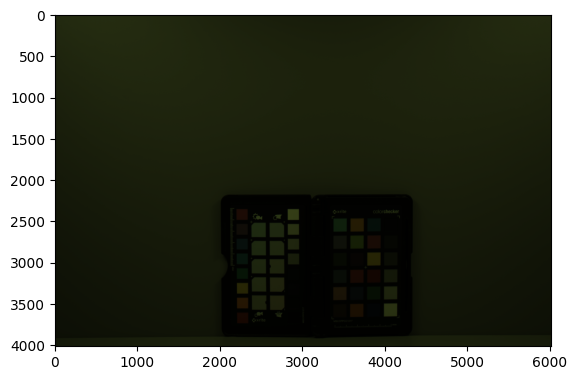

In [114]:
file_raw_0017 = ["data", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0017.NEF"]
path_raw_0017 = os.path.join(*file_raw_0017)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "XRCCPP", "Illuminant": JNA, "Observer":2}
image_0017 = RawImage(path_raw_0017, metadata, method="postprocess")

image_0017.show(method="matplotlib")

RAW RGB data extraction

In [115]:
has_colourchecker, corners, size_rect = image_0017.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

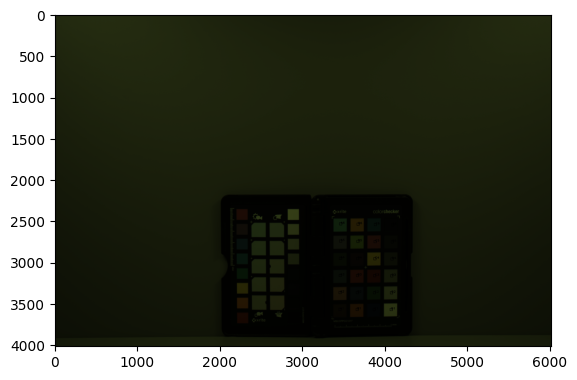

In [116]:
image_0017.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [117]:
XRCCPP_RGB_JNA = image_0017.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [118]:
data_xrccpp_jna = pd.merge(XRCCPP_XYZ_JNA, XRCCPP_RGB_JNA, on="patch_id")
data_xrccpp_jna.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JNA.,15.372919,11.711211,2.090311,MeasuredIlluminant object: Illuminant JNA.,483.826667,391.364444,117.862222
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JNA.,49.723613,36.782895,7.288411,MeasuredIlluminant object: Illuminant JNA.,1617.662222,1227.795556,416.582222
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JNA.,16.373390,15.847484,8.831574,MeasuredIlluminant object: Illuminant JNA.,535.700000,810.142222,439.697778
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JNA.,12.602236,12.631750,2.168357,MeasuredIlluminant object: Illuminant JNA.,425.128889,594.746667,160.977778
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JNA.,24.343027,20.619540,10.960965,MeasuredIlluminant object: Illuminant JNA.,936.568889,1077.891111,586.984444
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JNA.,31.156441,37.005330,13.403265,MeasuredIlluminant object: Illuminant JNA.,977.513333,2015.590000,829.433333
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JNA.,53.213909,36.259270,2.067765,MeasuredIlluminant object: Illuminant JNA.,1710.000000,998.066667,164.177778
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JNA.,11.569335,10.456881,10.649476,MeasuredIlluminant object: Illuminant JNA.,333.358889,526.347778,418.621111
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JNA.,41.201943,24.089264,3.763710,MeasuredIlluminant object: Illuminant JNA.,1488.468889,622.931111,198.993333
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JNA.,10.659306,7.084761,3.846497,MeasuredIlluminant object: Illuminant JNA.,396.808889,297.845556,177.987778


In [119]:
data_jna.append(data_xrccpp_jna)

### WPP

White - D1

In [120]:
patch_max = find_patch_max_value(data_xrccpp_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [121]:
data_xrccpp_jna = apply_wpp(data_xrccpp_jna, "D1")
data_xrccpp_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JNA.,0.170564,0.145407,0.086972,MeasuredIlluminant object: Illuminant JNA.,0.179594,0.122820,0.097948
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JNA.,0.551690,0.456699,0.303250,MeasuredIlluminant object: Illuminant JNA.,0.600467,0.385314,0.346197
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JNA.,0.181665,0.196763,0.367456,MeasuredIlluminant object: Illuminant JNA.,0.198849,0.254243,0.365407
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JNA.,0.139823,0.156837,0.090219,MeasuredIlluminant object: Illuminant JNA.,0.157805,0.186647,0.133779
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JNA.,0.270089,0.256014,0.456054,MeasuredIlluminant object: Illuminant JNA.,0.347649,0.338270,0.487809
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JNA.,0.345685,0.459461,0.557671,MeasuredIlluminant object: Illuminant JNA.,0.362848,0.632543,0.689294
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JNA.,0.590415,0.450198,0.086034,MeasuredIlluminant object: Illuminant JNA.,0.634743,0.313219,0.136439
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JNA.,0.128363,0.129833,0.443094,MeasuredIlluminant object: Illuminant JNA.,0.123741,0.165181,0.347892
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JNA.,0.457141,0.299094,0.156597,MeasuredIlluminant object: Illuminant JNA.,0.552511,0.195492,0.165372
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JNA.,0.118266,0.087965,0.160042,MeasuredIlluminant object: Illuminant JNA.,0.147293,0.093472,0.147915


In [122]:
data_xrccpp_jna.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.350737,0.329255,0.287077,0.397357,0.343724,0.323380
std,0.252852,0.239724,0.236015,0.283453,0.246925,0.229282
min,0.040911,0.041252,0.045024,0.052760,0.053013,0.057700
25%,0.137541,0.153979,0.107312,0.154945,0.156529,0.145046
50%,0.307887,0.253226,0.201477,0.355248,0.276385,0.275285
75%,0.480778,0.457389,0.441408,0.582937,0.492380,0.393798
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [123]:
data_wpp_jna.append(data_xrccpp_jna)

### SCK100

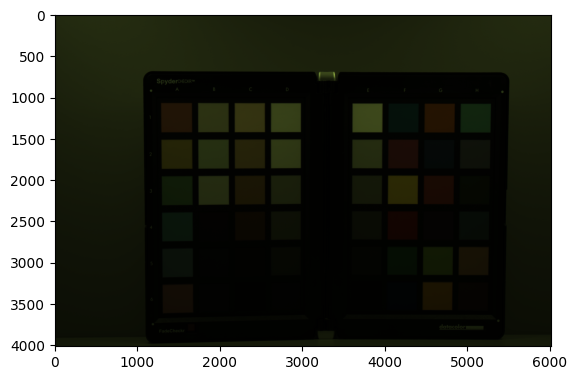

In [124]:
file_raw_0018 = ["data", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0018.NEF"]
path_raw_0018 = os.path.join(*file_raw_0018)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "SCK100", "Illuminant": JNA, "Observer":2}
image_0018 = RawImage(path_raw_0018, metadata, method="postprocess")

image_0018.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0018.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT") # Fails

In [125]:
corners = {"TopLeft":[1149.47,925.65], "TopRight":[5410.12,935.48], "BottomRight":[5351.15,3706.27], "BottomLeft":[1177.22,3747.97]}
image_0018.extract_colourchecker_rgb_patches(checker_name="SCK100_48", corners=corners, size_rect=100)

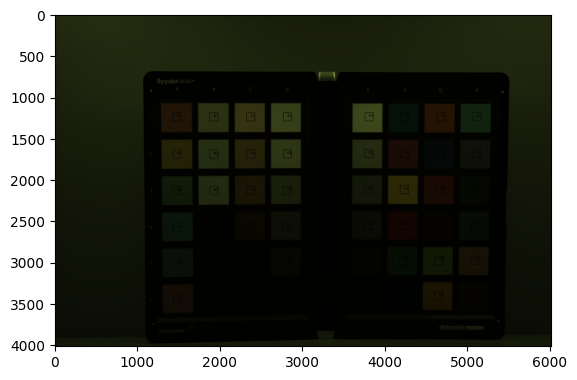

In [126]:
image_0018.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [127]:
SCK100_RGB_JNA = image_0018.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [128]:
data_sck100_jna = pd.merge(SCK100_XYZ_JNA, SCK100_RGB_JNA, on="patch_id")
data_sck100_jna.insert(0, "ColourChecker", "SCK100")
data_sck100_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JNA.,48.510841,33.556840,6.006544,MeasuredIlluminant object: Illuminant JNA.,2071.6412,1320.7948,399.8004
1,SCK100,A2,MeasuredIlluminant object: Illuminant JNA.,60.715062,51.359243,5.414997,MeasuredIlluminant object: Illuminant JNA.,2259.3326,2202.9887,463.3043
2,SCK100,A3,MeasuredIlluminant object: Illuminant JNA.,31.354564,33.893126,7.160301,MeasuredIlluminant object: Illuminant JNA.,984.4214,1659.6022,511.7802
3,SCK100,A4,MeasuredIlluminant object: Illuminant JNA.,24.029909,27.105936,14.450336,MeasuredIlluminant object: Illuminant JNA.,626.3658,1311.1287,695.7460
4,SCK100,A5,MeasuredIlluminant object: Illuminant JNA.,26.665927,25.751085,15.298386,MeasuredIlluminant object: Illuminant JNA.,670.1227,1054.8936,610.1140
5,SCK100,A6,MeasuredIlluminant object: Illuminant JNA.,43.604075,30.409248,9.409799,MeasuredIlluminant object: Illuminant JNA.,1157.1038,798.2888,341.6980
6,SCK100,B1,MeasuredIlluminant object: Illuminant JNA.,69.854591,60.779492,18.004242,MeasuredIlluminant object: Illuminant JNA.,2770.1584,3127.9040,1199.6960
7,SCK100,B2,MeasuredIlluminant object: Illuminant JNA.,65.096434,59.511451,17.789752,MeasuredIlluminant object: Illuminant JNA.,2338.5804,2925.1512,1109.0888
8,SCK100,B3,MeasuredIlluminant object: Illuminant JNA.,67.833549,60.075379,19.468756,MeasuredIlluminant object: Illuminant JNA.,2254.8497,2669.8619,1077.4875
9,SCK100,B4,MeasuredIlluminant object: Illuminant JNA.,7.350463,6.030174,1.698663,MeasuredIlluminant object: Illuminant JNA.,194.5138,184.0646,71.7252


In [129]:
data_jna.append(data_sck100_jna)

### WPP

White - E1

In [130]:
patch_max = find_patch_max_value(data_sck100_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [131]:
data_sck100_jna = apply_wpp(data_sck100_jna, "E1")
data_sck100_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JNA.,0.481996,0.374250,0.220258,MeasuredIlluminant object: Illuminant JNA.,0.535646,0.289403,0.227933
1,SCK100,A2,MeasuredIlluminant object: Illuminant JNA.,0.603255,0.572795,0.198566,MeasuredIlluminant object: Illuminant JNA.,0.584176,0.482703,0.264137
2,SCK100,A3,MeasuredIlluminant object: Illuminant JNA.,0.311534,0.378001,0.262566,MeasuredIlluminant object: Illuminant JNA.,0.254533,0.363640,0.291774
3,SCK100,A4,MeasuredIlluminant object: Illuminant JNA.,0.238757,0.302305,0.529889,MeasuredIlluminant object: Illuminant JNA.,0.161954,0.287285,0.396656
4,SCK100,A5,MeasuredIlluminant object: Illuminant JNA.,0.264948,0.287195,0.560986,MeasuredIlluminant object: Illuminant JNA.,0.173268,0.231141,0.347836
5,SCK100,A6,MeasuredIlluminant object: Illuminant JNA.,0.433243,0.339146,0.345054,MeasuredIlluminant object: Illuminant JNA.,0.299182,0.174915,0.194808
6,SCK100,B1,MeasuredIlluminant object: Illuminant JNA.,0.694064,0.677857,0.660209,MeasuredIlluminant object: Illuminant JNA.,0.716255,0.685363,0.683967
7,SCK100,B2,MeasuredIlluminant object: Illuminant JNA.,0.646788,0.663715,0.652344,MeasuredIlluminant object: Illuminant JNA.,0.604666,0.640938,0.632310
8,SCK100,B3,MeasuredIlluminant object: Illuminant JNA.,0.673983,0.670004,0.713912,MeasuredIlluminant object: Illuminant JNA.,0.583017,0.585000,0.614294
9,SCK100,B4,MeasuredIlluminant object: Illuminant JNA.,0.073033,0.067253,0.062289,MeasuredIlluminant object: Illuminant JNA.,0.050294,0.040331,0.040892


In [132]:
data_sck100_jna.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.365071,0.348679,0.305821,0.321720,0.288891,0.271824
std,0.262602,0.252974,0.248746,0.267418,0.249043,0.244274
min,0.046751,0.046978,0.048461,0.022120,0.022074,0.023088
25%,0.121800,0.137233,0.089993,0.087786,0.093552,0.084242
50%,0.315510,0.285928,0.241412,0.266377,0.235305,0.209835
75%,0.545506,0.517502,0.462242,0.547489,0.433116,0.368901
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [133]:
data_wpp_jna.append(data_sck100_jna)

## Merge data

In [134]:
data_pd_jna = pd.concat(data_jna, ignore_index=True)

data_pd_jna = data_pd_jna.drop(columns="illuminant_y")
data_pd_jna = data_pd_jna.rename(columns={"illuminant_x":"illuminant"})
data_pd_jna["illuminant"] = "JNA" # as str to avoid error
data_pd_jna

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JNA,23.260021,13.376909,4.184976,1006.273810,339.594104,180.196145
1,CCDSG,B3,JNA,46.745364,34.688946,13.982877,1926.483844,1555.609127,779.757086
2,CCDSG,B4,JNA,17.697077,10.910268,7.296986,598.218112,292.304422,273.289257
3,CCDSG,B5,JNA,15.405257,17.531298,16.958977,373.148951,1050.082341,849.508078
4,CCDSG,B6,JNA,22.593956,27.131710,16.412535,603.346655,1530.789683,890.918367
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,JNA,27.150398,23.166439,12.468467,936.972600,1107.230600,630.834000
212,SCK100,H3,JNA,12.453948,12.747416,2.166304,335.022800,502.925200,124.333600
213,SCK100,H4,JNA,17.472695,17.367002,9.683340,430.373700,711.592500,391.925500
214,SCK100,H5,JNA,50.199697,37.805369,7.469414,1420.508800,1110.814000,362.946000


In [135]:
data_pd_wpp_jna = pd.concat(data_wpp_jna, ignore_index=True)

data_pd_wpp_jna = data_pd_wpp_jna.drop(columns="illuminant_y")
data_pd_wpp_jna = data_pd_wpp_jna.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_jna["illuminant"] = "JNA" # as str to avoid error
data_pd_wpp_jna

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JNA,0.228685,0.147222,0.151768,0.275118,0.078504,0.108904
1,CCDSG,B3,JNA,0.459586,0.381776,0.507088,0.526706,0.359610,0.471256
2,CCDSG,B4,JNA,0.173992,0.120075,0.264624,0.163555,0.067572,0.165166
3,CCDSG,B5,JNA,0.151460,0.192944,0.615016,0.102020,0.242747,0.513411
4,CCDSG,B6,JNA,0.222137,0.298604,0.595199,0.164957,0.353872,0.538438
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,JNA,0.269762,0.258369,0.457214,0.242265,0.242608,0.359649
212,SCK100,H3,JNA,0.123740,0.142168,0.079438,0.086624,0.110197,0.070885
213,SCK100,H4,JNA,0.173606,0.193689,0.355085,0.111278,0.155919,0.223443
214,SCK100,H5,JNA,0.498776,0.421633,0.273901,0.367288,0.243393,0.206922


## JNF

In [136]:
data_jnf = []
data_wpp_jnf = []

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-06-19_NikonD5600_0025.NEF | JNF-3872ºK   | CCDSG  - Calibrite DIGITAL SG        | 140     |
| INDIGO_2022-06-19_NikonD5600_0026.NEF | JNF-3872ºK   | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-06-19_NikonD5600_0028.NEF | JNF-3872ºK   | CCPPV - Calibrite PASSPORT VIDEO     | 24      |
| INDIGO_2022-06-19_NikonD5600_0029.NEF | JNF-3872ºK   | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-06-19_NikonD5600_0030.NEF | JNF-3872ºK   | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/JNF/INDIGO_2022-06-19_NikonD5600_0025.jpg" width="400">
<img src="res/screenshot/JNF/INDIGO_2022-06-19_NikonD5600_0026.jpg" width="400">
<img src="res/screenshot/JNF/INDIGO_2022-06-19_NikonD5600_0028.jpg" width="400">
<img src="res/screenshot/JNF/INDIGO_2022-06-19_NikonD5600_0029.jpg" width="400">
<img src="res/screenshot/JNF/INDIGO_2022-06-19_NikonD5600_0030.jpg" width="400">


## SPD Illuminant

JNF

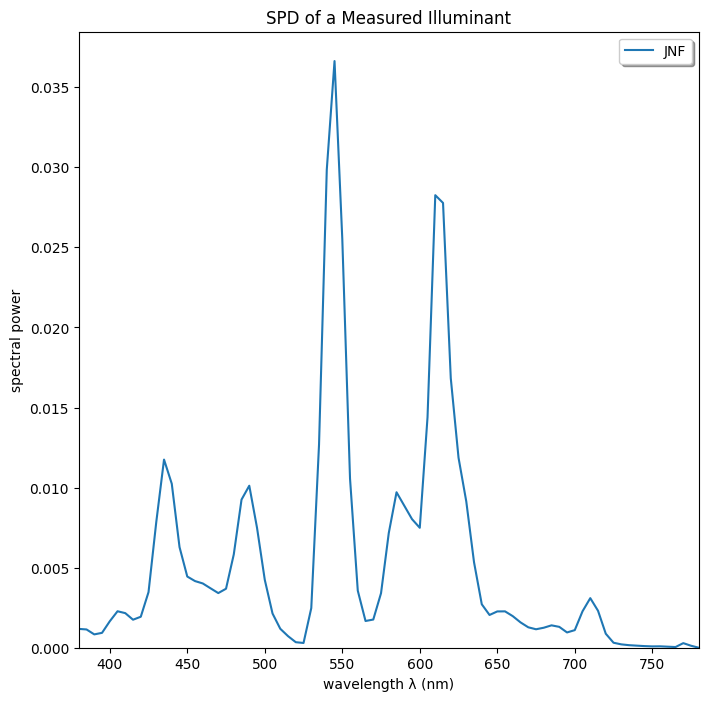

In [137]:
file_spd = ["res", "spd", "SPD_JNF_016_02°_3872K.csv"]
path_spd = os.path.join(*file_spd)

JNF = MeasuredIlluminant(illuminant_name="JNF", path_file=path_spd)

JNF.plot()

XYZ data (under JNF)

In [138]:
CCDSG_XYZ_JNF = CCDSG.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

In [139]:
CCC_XYZ_JNF = CCC.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

In [140]:
CCPPV_XYZ_JNF = CCPPV.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

In [141]:
XRCCPP_XYZ_JNF = XRCCPP.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

In [142]:
SCK100_XYZ_JNF = SCK100.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

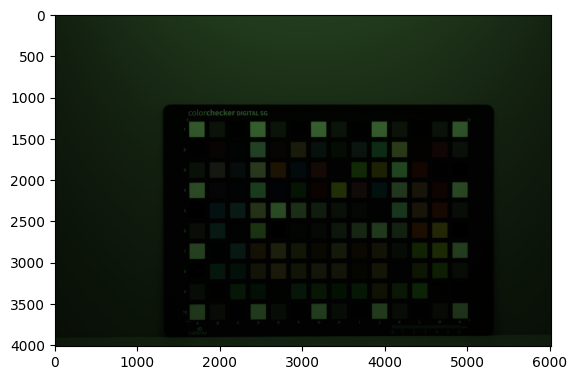

In [143]:
file_raw_0025 = ["data", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0025.NEF"]
path_raw_0025 = os.path.join(*file_raw_0025)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCDSG", "Illuminant": JNF, "Observer":2}
image_0025 = RawImage(path_raw_0025, metadata, method="postprocess")

image_0025.show(method="matplotlib")

RAW RGB data extraction

In [144]:
has_colourchecker, corners, size_rect = image_0025.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT") 

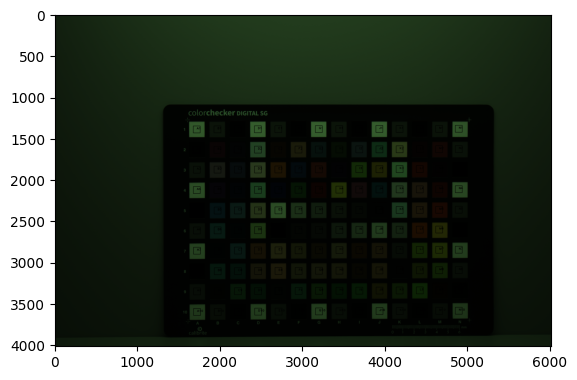

In [145]:
image_0025.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [146]:
CCDSG_RGB_JNF = image_0025.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [147]:
data_ccdsg_jnf = pd.merge(CCDSG_XYZ_JNF, CCDSG_RGB_JNF, on="patch_id")
data_ccdsg_jnf.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant JNF.,90.405962,90.851130,50.932877,MeasuredIlluminant object: Illuminant JNF.,3210.920635,5597.828231,2731.210034
1,CCDSG,A2,MeasuredIlluminant object: Illuminant JNF.,4.392605,4.390425,2.526085,MeasuredIlluminant object: Illuminant JNF.,43.546769,67.717404,32.916667
2,CCDSG,A3,MeasuredIlluminant object: Illuminant JNF.,22.011162,22.081217,12.558128,MeasuredIlluminant object: Illuminant JNF.,628.050170,1085.071995,530.387472
3,CCDSG,A4,MeasuredIlluminant object: Illuminant JNF.,89.346638,89.781511,50.438551,MeasuredIlluminant object: Illuminant JNF.,2755.872166,4797.036848,2339.081916
4,CCDSG,A5,MeasuredIlluminant object: Illuminant JNF.,4.376361,4.375718,2.520216,MeasuredIlluminant object: Illuminant JNF.,35.338152,55.231293,27.500000
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant JNF.,4.373095,4.372314,2.518194,MeasuredIlluminant object: Illuminant JNF.,35.988946,54.819161,26.607993
136,CCDSG,N7,MeasuredIlluminant object: Illuminant JNF.,89.827862,90.268980,50.688335,MeasuredIlluminant object: Illuminant JNF.,2275.604592,3932.114654,1917.366922
137,CCDSG,N8,MeasuredIlluminant object: Illuminant JNF.,22.074814,22.143073,12.572834,MeasuredIlluminant object: Illuminant JNF.,476.367063,814.899376,397.113095
138,CCDSG,N9,MeasuredIlluminant object: Illuminant JNF.,4.346654,4.345109,2.495620,MeasuredIlluminant object: Illuminant JNF.,41.741497,66.238946,33.138605


In [148]:
data_ccdsg_jnf = data_ccdsg_jnf[(data_ccdsg_jnf["patch_id"].str.contains("1")==False) & (data_ccdsg_jnf["patch_id"].str.contains("0")==False) & (data_ccdsg_jnf["patch_id"].str.contains("0")==False) & (data_ccdsg_jnf["patch_id"].str.contains("A")==False) & (data_ccdsg_jnf["patch_id"].str.contains("N")==False)]
data_ccdsg_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JNF.,18.238851,11.534710,8.761602,MeasuredIlluminant object: Illuminant JNF.,624.411565,315.319728,284.451247
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JNF.,40.824910,32.673690,27.155959,MeasuredIlluminant object: Illuminant JNF.,1364.442177,1585.028061,1138.161565
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JNF.,15.002010,9.609032,15.593407,MeasuredIlluminant object: Illuminant JNF.,377.933673,295.058957,468.735544
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JNF.,16.739652,18.639093,31.067010,MeasuredIlluminant object: Illuminant JNF.,287.414966,1139.248016,1192.458617
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JNF.,23.320175,29.281772,29.479853,MeasuredIlluminant object: Illuminant JNF.,460.858560,1663.408730,1186.124717
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JNF.,44.489951,26.075728,4.328641,MeasuredIlluminant object: Illuminant JNF.,1574.498299,546.315193,138.091270
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JNF.,73.580478,66.657777,5.771355,MeasuredIlluminant object: Illuminant JNF.,2263.242347,2559.526644,367.481293
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JNF.,66.432905,67.782065,4.493068,MeasuredIlluminant object: Illuminant JNF.,1861.879252,2673.035714,323.090703
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JNF.,40.174828,48.710705,4.662325,MeasuredIlluminant object: Illuminant JNF.,946.560658,1979.617063,283.462302


In [149]:
data_jnf.append(data_ccdsg_jnf)

### WPP

White - E5

In [150]:
patch_max = find_patch_max_value(data_ccdsg_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [151]:
data_ccdsg_jnf = apply_wpp(data_ccdsg_jnf, "E5")
data_ccdsg_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JNF.,0.201619,0.126893,0.172111,MeasuredIlluminant object: Illuminant JNF.,0.225999,0.065677,0.121443
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JNF.,0.451294,0.359442,0.533446,MeasuredIlluminant object: Illuminant JNF.,0.493845,0.330140,0.485924
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JNF.,0.165838,0.105709,0.306314,MeasuredIlluminant object: Illuminant JNF.,0.136789,0.061457,0.200121
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JNF.,0.185047,0.205048,0.610274,MeasuredIlluminant object: Illuminant JNF.,0.104027,0.237290,0.509106
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JNF.,0.257790,0.322128,0.579096,MeasuredIlluminant object: Illuminant JNF.,0.166803,0.346465,0.506402
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JNF.,0.491809,0.286858,0.085031,MeasuredIlluminant object: Illuminant JNF.,0.569873,0.113790,0.058956
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JNF.,0.813387,0.733300,0.113371,MeasuredIlluminant object: Illuminant JNF.,0.819156,0.533115,0.156892
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JNF.,0.734375,0.745668,0.088261,MeasuredIlluminant object: Illuminant JNF.,0.673887,0.556757,0.137940
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JNF.,0.444108,0.535865,0.091586,MeasuredIlluminant object: Illuminant JNF.,0.342598,0.412327,0.121021


In [152]:
data_ccdsg_jnf.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.365279,0.349731,0.284511,0.351076,0.300312,0.267150
std,0.231978,0.226871,0.234701,0.261432,0.236477,0.241188
min,0.048256,0.048011,0.049363,0.013860,0.012251,0.012184
25%,0.164223,0.157954,0.095416,0.127821,0.107409,0.093527
50%,0.337382,0.330846,0.211330,0.314695,0.271357,0.190624
75%,0.496674,0.457521,0.408346,0.528155,0.391069,0.362335
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [153]:
data_wpp_jnf.append(data_ccdsg_jnf)

### CCC

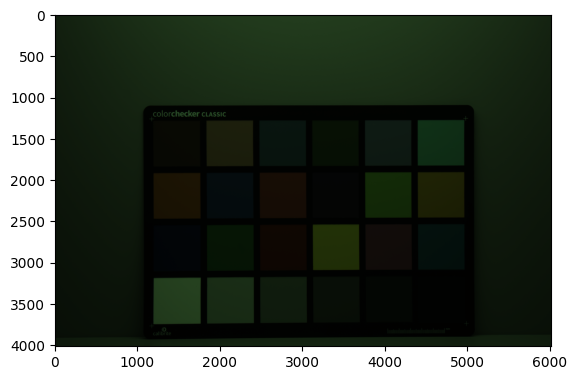

In [154]:
file_raw_0026 = ["data", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0026.NEF"]
path_raw_0026 = os.path.join(*file_raw_0026)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCC", "Illuminant": JNF, "Observer":2}
image_0026 = RawImage(path_raw_0026, metadata, method="postprocess")

image_0026.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0026.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT") # Fails

In [155]:
corners = {"TopLeft":[1159.51,1261.99], "TopRight":[4968.58,1254.68], "BottomRight":[4974.42,3736.81], "BottomLeft":[1165.69,3768.21]}
image_0026.extract_colourchecker_rgb_patches(checker_name="CCC", corners=corners, size_rect=100)

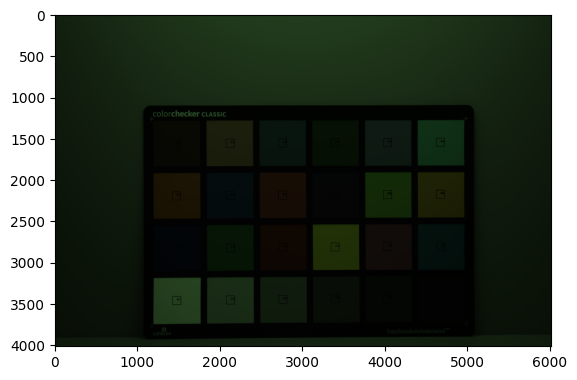

In [156]:
image_0026.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [157]:
CCC_RGB_JNF = image_0026.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [158]:
data_ccc_jnf = pd.merge(CCC_XYZ_JNF, CCC_RGB_JNF, on="patch_id")
data_ccc_jnf.insert(0, "ColourChecker", "CCC")
data_ccc_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JNF.,13.366150,11.277974,3.858691,MeasuredIlluminant object: Illuminant JNF.,524.8747,578.7366,222.7360
1,CCC,A2,MeasuredIlluminant object: Illuminant JNF.,43.419882,36.390277,13.400728,MeasuredIlluminant object: Illuminant JNF.,1753.8636,1913.2876,784.8508
2,CCC,A3,MeasuredIlluminant object: Illuminant JNF.,17.688268,18.492317,18.798833,MeasuredIlluminant object: Illuminant JNF.,561.6572,1301.6864,939.8044
3,CCC,A4,MeasuredIlluminant object: Illuminant JNF.,12.307527,15.020879,3.838052,MeasuredIlluminant object: Illuminant JNF.,451.0732,1021.5756,291.1668
4,CCC,A5,MeasuredIlluminant object: Illuminant JNF.,25.940944,24.050283,24.624515,MeasuredIlluminant object: Illuminant JNF.,918.4196,1652.4160,1212.3300
5,CCC,A6,MeasuredIlluminant object: Illuminant JNF.,32.373662,42.348016,24.184870,MeasuredIlluminant object: Illuminant JNF.,982.2968,2929.5476,1385.3968
6,CCC,B1,MeasuredIlluminant object: Illuminant JNF.,45.671563,33.741487,3.578359,MeasuredIlluminant object: Illuminant JNF.,1695.9326,1232.7752,248.0512
7,CCC,B2,MeasuredIlluminant object: Illuminant JNF.,11.982290,10.739880,21.783312,MeasuredIlluminant object: Illuminant JNF.,318.3940,771.3350,879.8648
8,CCC,B3,MeasuredIlluminant object: Illuminant JNF.,35.654258,22.661263,7.465272,MeasuredIlluminant object: Illuminant JNF.,1426.3520,831.0732,362.5404
9,CCC,B4,MeasuredIlluminant object: Illuminant JNF.,8.812877,6.650981,8.259123,MeasuredIlluminant object: Illuminant JNF.,280.9360,349.1748,311.5320


In [159]:
data_jnf.append(data_ccc_jnf)

### WPP

White - D1

In [160]:
patch_max = find_patch_max_value(data_ccc_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [161]:
data_ccc_jnf = apply_wpp(data_ccc_jnf, "D1")
data_ccc_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JNF.,0.145809,0.122390,0.074891,MeasuredIlluminant object: Illuminant JNF.,0.230104,0.146508,0.115968
1,CCC,A2,MeasuredIlluminant object: Illuminant JNF.,0.473661,0.394912,0.260087,MeasuredIlluminant object: Illuminant JNF.,0.768891,0.484350,0.408635
2,CCC,A3,MeasuredIlluminant object: Illuminant JNF.,0.192959,0.200681,0.364855,MeasuredIlluminant object: Illuminant JNF.,0.246230,0.329523,0.489312
3,CCC,A4,MeasuredIlluminant object: Illuminant JNF.,0.134261,0.163009,0.074490,MeasuredIlluminant object: Illuminant JNF.,0.197750,0.258613,0.151597
4,CCC,A5,MeasuredIlluminant object: Illuminant JNF.,0.282986,0.260997,0.477922,MeasuredIlluminant object: Illuminant JNF.,0.402634,0.418311,0.631203
5,CCC,A6,MeasuredIlluminant object: Illuminant JNF.,0.353160,0.459566,0.469390,MeasuredIlluminant object: Illuminant JNF.,0.430637,0.741618,0.721311
6,CCC,B1,MeasuredIlluminant object: Illuminant JNF.,0.498225,0.366167,0.069450,MeasuredIlluminant object: Illuminant JNF.,0.743494,0.312078,0.129149
7,CCC,B2,MeasuredIlluminant object: Illuminant JNF.,0.130713,0.116551,0.422779,MeasuredIlluminant object: Illuminant JNF.,0.139583,0.195264,0.458104
8,CCC,B3,MeasuredIlluminant object: Illuminant JNF.,0.388947,0.245923,0.144889,MeasuredIlluminant object: Illuminant JNF.,0.625311,0.210387,0.188758
9,CCC,B4,MeasuredIlluminant object: Illuminant JNF.,0.096138,0.072177,0.160296,MeasuredIlluminant object: Illuminant JNF.,0.123162,0.088394,0.162200


In [162]:
data_ccc_jnf.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.329483,0.313731,0.271290,0.413535,0.361308,0.331108
std,0.238523,0.238307,0.233182,0.291212,0.256944,0.242000
min,0.036985,0.036965,0.038881,0.040306,0.039579,0.041886
25%,0.142922,0.152854,0.093760,0.165200,0.183075,0.159549
50%,0.282465,0.241260,0.192663,0.406352,0.286500,0.247296
75%,0.432075,0.422870,0.409853,0.643442,0.494999,0.455391
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [163]:
data_wpp_jnf.append(data_ccc_jnf)

### CCPPV

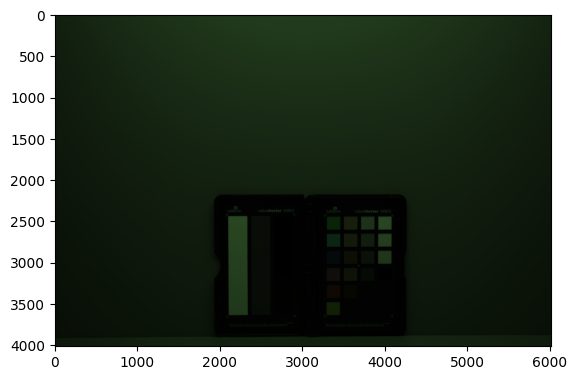

In [164]:
file_raw_0028 = ["data", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0028.NEF"]
path_raw_0028 = os.path.join(*file_raw_0028)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCPPV", "Illuminant": JNF, "Observer":2}
image_0028 = RawImage(path_raw_0028, metadata, method="postprocess")

image_0028.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0028.automatic_colourchecker_extraction(checker_name="CCPPV_24", opencv_descriptor="SIFT") # Fails

In [165]:
corners = {"TopLeft":[3254.7,3652.67], "TopRight":[3259.63,2422.34], "BottomRight":[4083.39,2422.34], "BottomLeft":[4083.39,3652.67]}
image_0028.extract_colourchecker_rgb_patches(checker_name="CCPPV_24", corners=corners, size_rect=40)

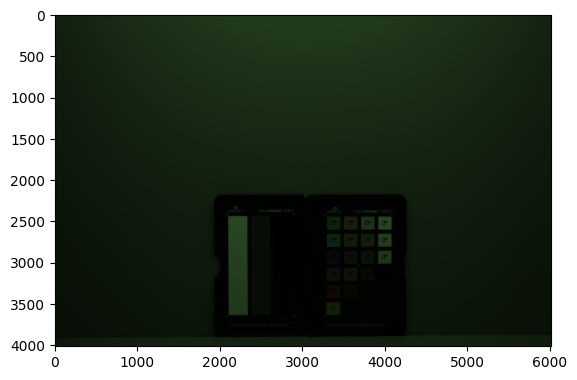

In [166]:
image_0028.show_colourchecker(checker_name="CCPPV", show_image=True, method="matplotlib")

In [167]:
CCPPV_RGB_JNF = image_0028.get_ColourCheckerRGB("CCPPV").as_pandas_dataframe()

In [168]:
data_ccppv_jnf = pd.merge(CCPPV_XYZ_JNF, CCPPV_RGB_JNF, on="patch_id")
data_ccppv_jnf.insert(0, "ColourChecker", "CCPPV")
data_ccppv_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant JNF.,36.697289,40.213844,6.775537,MeasuredIlluminant object: Illuminant JNF.,1192.395000,2056.60125,438.330000
1,CCPPV,A2,MeasuredIlluminant object: Illuminant JNF.,27.158518,17.854417,5.785493,MeasuredIlluminant object: Illuminant JNF.,1026.433750,569.53250,233.401250
2,CCPPV,A3,MeasuredIlluminant object: Illuminant JNF.,26.251486,17.942410,19.388383,MeasuredIlluminant object: Illuminant JNF.,1045.716250,928.42625,851.340000
3,CCPPV,A4,MeasuredIlluminant object: Illuminant JNF.,10.300789,8.670701,16.962732,MeasuredIlluminant object: Illuminant JNF.,302.063750,620.88500,781.126250
4,CCPPV,A5,MeasuredIlluminant object: Illuminant JNF.,22.451597,28.428281,20.327242,MeasuredIlluminant object: Illuminant JNF.,769.957500,2360.82375,1313.955000
5,CCPPV,A6,MeasuredIlluminant object: Illuminant JNF.,23.601052,36.377568,7.695607,MeasuredIlluminant object: Illuminant JNF.,642.117500,2299.12125,559.682500
6,CCPPV,B1,MeasuredIlluminant object: Illuminant JNF.,6.393557,5.760063,2.363770,MeasuredIlluminant object: Illuminant JNF.,184.226250,232.77625,97.535000
7,CCPPV,B2,MeasuredIlluminant object: Illuminant JNF.,14.173461,12.033917,3.949718,MeasuredIlluminant object: Illuminant JNF.,473.303750,482.58250,165.553125
8,CCPPV,B3,MeasuredIlluminant object: Illuminant JNF.,25.549371,23.010708,8.856411,MeasuredIlluminant object: Illuminant JNF.,1004.172500,1244.83375,475.417500
9,CCPPV,B4,MeasuredIlluminant object: Illuminant JNF.,22.327909,19.548922,6.662556,MeasuredIlluminant object: Illuminant JNF.,846.735000,959.22500,333.917500


In [169]:
data_jnf.append(data_ccppv_jnf)

### WPP

White - D6

In [170]:
patch_max = find_patch_max_value(data_ccppv_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D6', 'D6', 'D6']
['D6', 'D6', 'D6']


In [171]:
data_ccppv_jnf = apply_wpp(data_ccppv_jnf, "D6")
data_ccppv_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant JNF.,0.471464,0.513342,0.155588,MeasuredIlluminant object: Illuminant JNF.,0.461702,0.462342,0.204114
1,CCPPV,A2,MeasuredIlluminant object: Illuminant JNF.,0.348916,0.227917,0.132854,MeasuredIlluminant object: Illuminant JNF.,0.397441,0.128036,0.108686
2,CCPPV,A3,MeasuredIlluminant object: Illuminant JNF.,0.337263,0.229040,0.445220,MeasuredIlluminant object: Illuminant JNF.,0.404908,0.208719,0.396437
3,CCPPV,A4,MeasuredIlluminant object: Illuminant JNF.,0.132338,0.110684,0.389520,MeasuredIlluminant object: Illuminant JNF.,0.116961,0.139581,0.363742
4,CCPPV,A5,MeasuredIlluminant object: Illuminant JNF.,0.288444,0.362896,0.466780,MeasuredIlluminant object: Illuminant JNF.,0.298132,0.530734,0.611860
5,CCPPV,A6,MeasuredIlluminant object: Illuminant JNF.,0.303212,0.464371,0.176716,MeasuredIlluminant object: Illuminant JNF.,0.248632,0.516863,0.260623
6,CCPPV,B1,MeasuredIlluminant object: Illuminant JNF.,0.082140,0.073529,0.054280,MeasuredIlluminant object: Illuminant JNF.,0.071333,0.052330,0.045418
7,CCPPV,B2,MeasuredIlluminant object: Illuminant JNF.,0.182092,0.153617,0.090698,MeasuredIlluminant object: Illuminant JNF.,0.183266,0.108489,0.077092
8,CCPPV,B3,MeasuredIlluminant object: Illuminant JNF.,0.328243,0.293739,0.203372,MeasuredIlluminant object: Illuminant JNF.,0.388822,0.279850,0.221384
9,CCPPV,B4,MeasuredIlluminant object: Illuminant JNF.,0.286855,0.249548,0.152994,MeasuredIlluminant object: Illuminant JNF.,0.327861,0.215642,0.155493


In [172]:
data_ccppv_jnf.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.350273,0.342876,0.322662,0.349346,0.329215,0.319694
std,0.290927,0.295274,0.306116,0.283832,0.292317,0.296035
min,0.038036,0.038019,0.040265,0.013202,0.012419,0.014101
25%,0.119789,0.102708,0.088979,0.105554,0.095149,0.072184
50%,0.295828,0.250282,0.190044,0.312996,0.232986,0.237698
75%,0.464458,0.467901,0.437445,0.473260,0.475973,0.408812
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [173]:
data_wpp_jnf.append(data_ccppv_jnf)

### XRCCPP

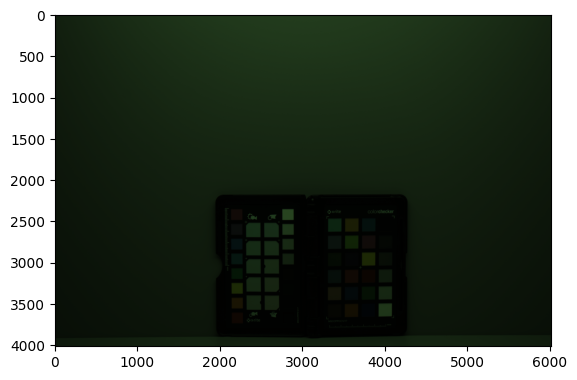

In [174]:
file_raw_0029 = ["data", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0029.NEF"]
path_raw_0029 = os.path.join(*file_raw_0029)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "XRCCPP", "Illuminant": JNF, "Observer":2}
image_0029 = RawImage(path_raw_0029, metadata, method="postprocess")

image_0029.show(method="matplotlib")

RAW RGB data extraction

In [175]:
has_colourchecker, corners, size_rect = image_0029.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

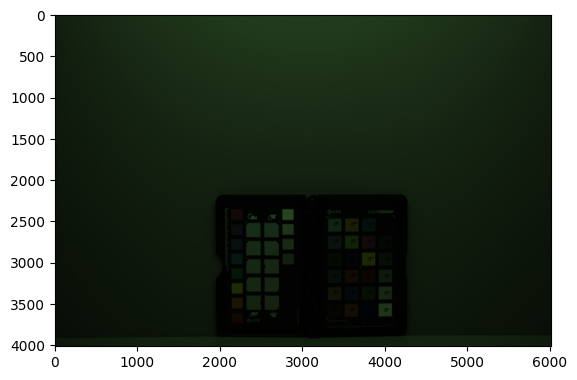

In [176]:
image_0029.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [177]:
XRCCPP_RGB_JNF = image_0029.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [178]:
data_xrccpp_jnf = pd.merge(XRCCPP_XYZ_JNF, XRCCPP_RGB_JNF, on="patch_id")
data_xrccpp_jnf.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JNF.,12.764946,10.867451,3.786364,MeasuredIlluminant object: Illuminant JNF.,351.568889,398.271111,154.364444
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JNF.,41.486920,34.316215,12.468572,MeasuredIlluminant object: Illuminant JNF.,1165.044444,1240.657778,520.420000
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JNF.,15.682679,16.363606,16.556943,MeasuredIlluminant object: Illuminant JNF.,408.142222,914.137778,644.995556
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JNF.,11.267880,13.657336,3.660514,MeasuredIlluminant object: Illuminant JNF.,320.370000,707.663333,208.243333
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JNF.,22.143760,20.627590,21.086036,MeasuredIlluminant object: Illuminant JNF.,683.433333,1215.836667,888.598889
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JNF.,30.317126,40.069187,23.146456,MeasuredIlluminant object: Illuminant JNF.,787.831111,2352.326667,1125.182222
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JNF.,42.652555,31.733974,3.472690,MeasuredIlluminant object: Illuminant JNF.,1239.795556,921.643333,187.565556
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JNF.,11.690263,10.540233,20.709061,MeasuredIlluminant object: Illuminant JNF.,249.980000,590.195556,656.975556
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JNF.,34.041759,21.601191,7.171931,MeasuredIlluminant object: Illuminant JNF.,1070.977778,602.160000,264.102222
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JNF.,8.229535,6.351745,7.835616,MeasuredIlluminant object: Illuminant JNF.,241.931111,321.842222,275.646667


In [179]:
data_jnf.append(data_xrccpp_jnf)

### WPP

White - D1

In [180]:
patch_max = find_patch_max_value(data_xrccpp_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [181]:
data_xrccpp_jnf = apply_wpp(data_xrccpp_jnf, "D1")
data_xrccpp_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JNF.,0.159430,0.134864,0.085583,MeasuredIlluminant object: Illuminant JNF.,0.175164,0.115009,0.092638
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JNF.,0.518158,0.425861,0.281827,MeasuredIlluminant object: Illuminant JNF.,0.580467,0.358266,0.312318
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JNF.,0.195871,0.203071,0.374237,MeasuredIlluminant object: Illuminant JNF.,0.203351,0.263976,0.387079
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JNF.,0.140732,0.169486,0.082739,MeasuredIlluminant object: Illuminant JNF.,0.159620,0.204352,0.124972
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JNF.,0.276568,0.255986,0.476608,MeasuredIlluminant object: Illuminant JNF.,0.340511,0.351098,0.533272
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JNF.,0.378651,0.497255,0.523180,MeasuredIlluminant object: Illuminant JNF.,0.392526,0.679283,0.675252
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JNF.,0.532716,0.393816,0.078493,MeasuredIlluminant object: Illuminant JNF.,0.617711,0.266144,0.112563
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JNF.,0.146007,0.130803,0.468087,MeasuredIlluminant object: Illuminant JNF.,0.124549,0.170431,0.394268
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JNF.,0.425170,0.268069,0.162107,MeasuredIlluminant object: Illuminant JNF.,0.533600,0.173886,0.158495
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JNF.,0.102784,0.078825,0.177109,MeasuredIlluminant object: Illuminant JNF.,0.120539,0.092939,0.165423


In [182]:
data_xrccpp_jnf.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.342073,0.324872,0.284863,0.391153,0.344773,0.319460
std,0.241527,0.239874,0.238656,0.279987,0.253562,0.235046
min,0.041333,0.041391,0.045586,0.052791,0.052780,0.057265
25%,0.155623,0.160831,0.099672,0.152252,0.160758,0.153358
50%,0.285780,0.250181,0.210851,0.358668,0.265060,0.259917
75%,0.451821,0.443709,0.440044,0.545317,0.491225,0.416112
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [183]:
data_wpp_jnf.append(data_xrccpp_jnf)

### SCK100

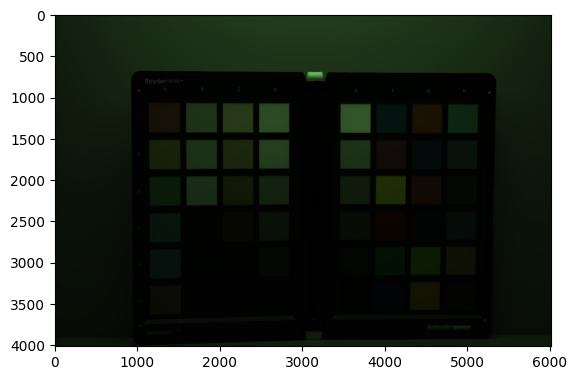

In [184]:
file_raw_0030 = ["data", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0030.NEF"]
path_raw_0030 = os.path.join(*file_raw_0030)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "SCK100", "Illuminant": JNF, "Observer":2}
image_0030 = RawImage(path_raw_0030, metadata, method="postprocess")

image_0030.show(method="matplotlib")

RAW RGB data extraction

In [185]:
has_colourchecker, corners, size_rect = image_0030.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

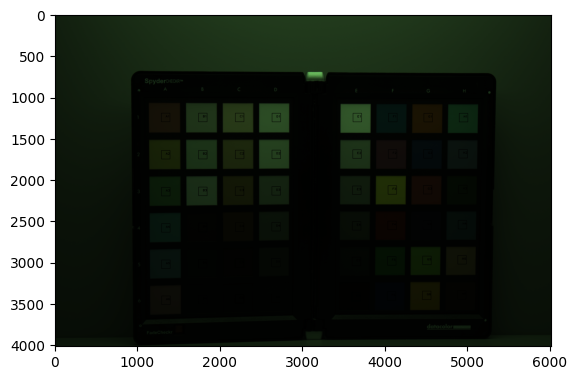

In [186]:
image_0030.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [187]:
SCK100_RGB_JNF = image_0030.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [188]:
data_sck100_jnf = pd.merge(SCK100_XYZ_JNF, SCK100_RGB_JNF, on="patch_id")
data_sck100_jnf.insert(0, "ColourChecker", "SCK100")
data_sck100_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JNF.,39.462233,29.330815,11.321207,MeasuredIlluminant object: Illuminant JNF.,1344.310651,1108.966346,483.423632
1,SCK100,A2,MeasuredIlluminant object: Illuminant JNF.,50.979149,50.401801,8.999718,MeasuredIlluminant object: Illuminant JNF.,1517.756657,2155.804734,510.213018
2,SCK100,A3,MeasuredIlluminant object: Illuminant JNF.,28.402862,35.722117,11.842981,MeasuredIlluminant object: Illuminant JNF.,678.975592,1674.843565,564.623521
3,SCK100,A4,MeasuredIlluminant object: Illuminant JNF.,24.084593,29.247884,26.042522,MeasuredIlluminant object: Illuminant JNF.,451.227071,1357.472911,869.839959
4,SCK100,A5,MeasuredIlluminant object: Illuminant JNF.,26.066576,26.953864,29.163853,MeasuredIlluminant object: Illuminant JNF.,471.019046,1091.583765,814.251664
5,SCK100,A6,MeasuredIlluminant object: Illuminant JNF.,37.893419,28.629906,18.538871,MeasuredIlluminant object: Illuminant JNF.,784.901627,762.374075,456.964867
6,SCK100,B1,MeasuredIlluminant object: Illuminant JNF.,61.465789,60.091343,33.260494,MeasuredIlluminant object: Illuminant JNF.,1996.797522,3278.226701,1608.000462
7,SCK100,B2,MeasuredIlluminant object: Illuminant JNF.,58.145123,59.917817,32.495919,MeasuredIlluminant object: Illuminant JNF.,1710.230862,3106.889423,1473.469859
8,SCK100,B3,MeasuredIlluminant object: Illuminant JNF.,60.111571,59.835161,36.158582,MeasuredIlluminant object: Illuminant JNF.,1614.316291,2799.002034,1447.082101
9,SCK100,B4,MeasuredIlluminant object: Illuminant JNF.,6.417495,5.948570,3.146335,MeasuredIlluminant object: Illuminant JNF.,140.297152,194.838757,95.853920


In [189]:
data_jnf.append(data_sck100_jnf)

### WPP

White - E1

In [190]:
patch_max = find_patch_max_value(data_sck100_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [191]:
data_sck100_jnf = apply_wpp(data_sck100_jnf, "E1")
data_sck100_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JNF.,0.441135,0.327241,0.224668,MeasuredIlluminant object: Illuminant JNF.,0.426636,0.203417,0.181401
1,SCK100,A2,MeasuredIlluminant object: Illuminant JNF.,0.569879,0.562329,0.178598,MeasuredIlluminant object: Illuminant JNF.,0.481681,0.395438,0.191453
2,SCK100,A3,MeasuredIlluminant object: Illuminant JNF.,0.317506,0.398549,0.235022,MeasuredIlluminant object: Illuminant JNF.,0.215482,0.307215,0.211870
3,SCK100,A4,MeasuredIlluminant object: Illuminant JNF.,0.269234,0.326316,0.516810,MeasuredIlluminant object: Illuminant JNF.,0.143203,0.249000,0.326400
4,SCK100,A5,MeasuredIlluminant object: Illuminant JNF.,0.291389,0.300722,0.578753,MeasuredIlluminant object: Illuminant JNF.,0.149484,0.200228,0.305541
5,SCK100,A6,MeasuredIlluminant object: Illuminant JNF.,0.423598,0.319421,0.367901,MeasuredIlluminant object: Illuminant JNF.,0.249099,0.139842,0.171472
6,SCK100,B1,MeasuredIlluminant object: Illuminant JNF.,0.687105,0.670434,0.660050,MeasuredIlluminant object: Illuminant JNF.,0.633712,0.601323,0.603388
7,SCK100,B2,MeasuredIlluminant object: Illuminant JNF.,0.649985,0.668498,0.644877,MeasuredIlluminant object: Illuminant JNF.,0.542766,0.569894,0.552907
8,SCK100,B3,MeasuredIlluminant object: Illuminant JNF.,0.671967,0.667576,0.717562,MeasuredIlluminant object: Illuminant JNF.,0.512326,0.513419,0.543005
9,SCK100,B4,MeasuredIlluminant object: Illuminant JNF.,0.071739,0.066368,0.062439,MeasuredIlluminant object: Illuminant JNF.,0.044525,0.035739,0.035968


In [192]:
data_sck100_jnf.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.357326,0.345409,0.303549,0.289996,0.262528,0.244106
std,0.254602,0.252554,0.250023,0.252167,0.238921,0.233970
min,0.046860,0.047060,0.048593,0.021251,0.020742,0.021590
25%,0.132112,0.142082,0.082986,0.079207,0.082249,0.069793
50%,0.304448,0.292873,0.229845,0.218668,0.200200,0.168548
75%,0.521325,0.511179,0.450065,0.440397,0.391867,0.326792
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [193]:
data_wpp_jnf.append(data_sck100_jnf)

## Merge data

In [194]:
data_pd_jnf = pd.concat(data_jnf, ignore_index=True)

data_pd_jnf = data_pd_jnf.drop(columns="illuminant_y")
data_pd_jnf = data_pd_jnf.rename(columns={"illuminant_x":"illuminant"})
data_pd_jnf["illuminant"] = "JNF" # as str to avoid error
data_pd_jnf

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JNF,18.238851,11.534710,8.761602,624.411565,315.319728,284.451247
1,CCDSG,B3,JNF,40.824910,32.673690,27.155959,1364.442177,1585.028061,1138.161565
2,CCDSG,B4,JNF,15.002010,9.609032,15.593407,377.933673,295.058957,468.735544
3,CCDSG,B5,JNF,16.739652,18.639093,31.067010,287.414966,1139.248016,1192.458617
4,CCDSG,B6,JNF,23.320175,29.281772,29.479853,460.858560,1663.408730,1186.124717
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,JNF,24.607080,22.858686,23.767454,638.753328,1140.498151,874.021450
212,SCK100,H3,JNF,11.296355,13.911766,3.742177,242.574334,573.051405,149.207101
213,SCK100,H4,JNF,17.063432,18.013810,18.599898,320.686021,761.740385,551.715607
214,SCK100,H5,JNF,41.770488,35.684860,13.161311,967.072115,1091.273576,441.381195


In [195]:
data_pd_wpp_jnf = pd.concat(data_wpp_jnf, ignore_index=True)

data_pd_wpp_jnf = data_pd_wpp_jnf.drop(columns="illuminant_y")
data_pd_wpp_jnf = data_pd_wpp_jnf.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_jnf["illuminant"] = "JNF" # as str to avoid error
data_pd_wpp_jnf

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JNF,0.201619,0.126893,0.172111,0.225999,0.065677,0.121443
1,CCDSG,B3,JNF,0.451294,0.359442,0.533446,0.493845,0.330140,0.485924
2,CCDSG,B4,JNF,0.165838,0.105709,0.306314,0.136789,0.061457,0.200121
3,CCDSG,B5,JNF,0.185047,0.205048,0.610274,0.104027,0.237290,0.509106
4,CCDSG,B6,JNF,0.257790,0.322128,0.579096,0.166803,0.346465,0.506402
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,JNF,0.275074,0.255032,0.471662,0.202717,0.209201,0.327969
212,SCK100,H3,JNF,0.126278,0.155212,0.074263,0.076984,0.105114,0.055989
213,SCK100,H4,JNF,0.190746,0.200979,0.369112,0.101774,0.139725,0.207027
214,SCK100,H5,JNF,0.466938,0.398133,0.261184,0.306914,0.200171,0.165624


## JND50

In [196]:
data_jnd50 = []
data_wpp_jnd50 = []

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-06-19_NikonD5600_0038.NEF | JND50-4963ºK | CCDSG  - Calibrite DIGITAL SG        | 140     |
| INDIGO_2022-06-19_NikonD5600_0039.NEF | JND50-4963ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-06-19_NikonD5600_0041.NEF | JND50-4963ºK | CCPPV - Calibrite PASSPORT VIDEO     | 24      |
| INDIGO_2022-06-19_NikonD5600_0042.NEF | JND50-4963ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-06-19_NikonD5600_0043.NEF | JND50-4963ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/JND50/INDIGO_2022-06-19_NikonD5600_0038.jpg" width="400">
<img src="res/screenshot/JND50/INDIGO_2022-06-19_NikonD5600_0039.jpg" width="400">
<img src="res/screenshot/JND50/INDIGO_2022-06-19_NikonD5600_0041.jpg" width="400">
<img src="res/screenshot/JND50/INDIGO_2022-06-19_NikonD5600_0042.jpg" width="400">
<img src="res/screenshot/JND50/INDIGO_2022-06-19_NikonD5600_0043.jpg" width="400">

## SPD Illuminant

JND50

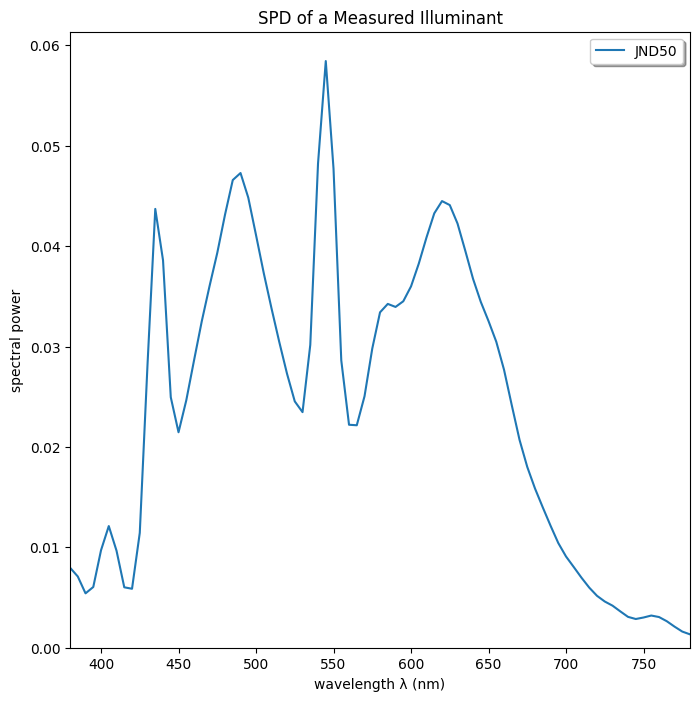

In [197]:
file_spd = ["res", "spd", "SPD_JND50_017_02°_4963K.csv"]
path_spd = os.path.join(*file_spd)

JND50 = MeasuredIlluminant(illuminant_name="JND50", path_file=path_spd)

JND50.plot()

XYZ data (under JND50)

In [198]:
CCDSG_XYZ_JND50 = CCDSG.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

In [199]:
CCC_XYZ_JND50 = CCC.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

In [200]:
CCPPV_XYZ_JND50 = CCPPV.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

In [201]:
XRCCPP_XYZ_JND50 = XRCCPP.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

In [202]:
SCK100_XYZ_JND50 = SCK100.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

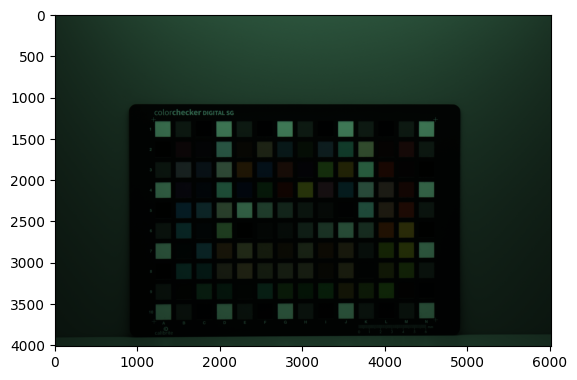

In [203]:
file_raw_0038 = ["data", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0038.NEF"]
path_raw_0038 = os.path.join(*file_raw_0038)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCDSG", "Illuminant": JND50, "Observer":2}
image_0038 = RawImage(path_raw_0038, metadata, method="postprocess")

image_0038.show(method="matplotlib")

RAW RGB data extraction

In [204]:
has_colourchecker, corners, size_rect = image_0038.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

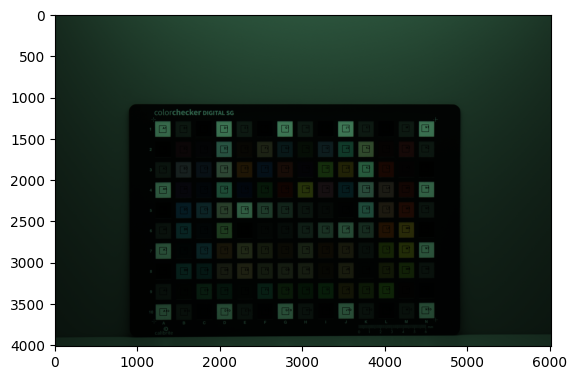

In [205]:
image_0038.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [206]:
CCDSG_RGB_JND50 = image_0038.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [207]:
data_ccdsg_jnd50 = pd.merge(CCDSG_XYZ_JND50, CCDSG_RGB_JND50, on="patch_id")
data_ccdsg_jnd50.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant JND50.,89.859240,90.857587,79.138710,MeasuredIlluminant object: Illuminant JND50.,3479.985969,6653.649518,4749.110828
1,CCDSG,A2,MeasuredIlluminant object: Illuminant JND50.,4.371440,4.393830,3.907887,MeasuredIlluminant object: Illuminant JND50.,46.288549,78.579932,55.534580
2,CCDSG,A3,MeasuredIlluminant object: Illuminant JND50.,21.853942,22.075630,19.470628,MeasuredIlluminant object: Illuminant JND50.,678.069444,1294.193169,920.332200
3,CCDSG,A4,MeasuredIlluminant object: Illuminant JND50.,88.810457,89.798004,78.360603,MeasuredIlluminant object: Illuminant JND50.,2995.721088,5720.579932,4083.046485
4,CCDSG,A5,MeasuredIlluminant object: Illuminant JND50.,4.355368,4.378975,3.898225,MeasuredIlluminant object: Illuminant JND50.,39.259637,67.741780,48.477608
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant JND50.,4.351602,4.375823,3.895485,MeasuredIlluminant object: Illuminant JND50.,45.434807,75.051871,52.144841
136,CCDSG,N7,MeasuredIlluminant object: Illuminant JND50.,89.291912,90.282543,78.750750,MeasuredIlluminant object: Illuminant JND50.,2834.659864,5393.302721,3855.601474
137,CCDSG,N8,MeasuredIlluminant object: Illuminant JND50.,21.915406,22.135257,19.495474,MeasuredIlluminant object: Illuminant JND50.,595.178855,1129.305839,804.045351
138,CCDSG,N9,MeasuredIlluminant object: Illuminant JND50.,4.325654,4.348508,3.861480,MeasuredIlluminant object: Illuminant JND50.,55.673753,97.743764,70.092971


In [208]:
data_ccdsg_jnd50 = data_ccdsg_jnd50[(data_ccdsg_jnd50["patch_id"].str.contains("1")==False) & (data_ccdsg_jnd50["patch_id"].str.contains("0")==False) & (data_ccdsg_jnd50["patch_id"].str.contains("0")==False) & (data_ccdsg_jnd50["patch_id"].str.contains("A")==False) & (data_ccdsg_jnd50["patch_id"].str.contains("N")==False)]
data_ccdsg_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JND50.,18.410151,11.546970,12.587745,MeasuredIlluminant object: Illuminant JND50.,723.809240,414.256519,469.656179
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JND50.,40.836037,33.499315,41.062774,MeasuredIlluminant object: Illuminant JND50.,1515.942744,2108.683673,2019.792517
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JND50.,15.707469,10.120208,22.228786,MeasuredIlluminant object: Illuminant JND50.,443.030329,443.162132,770.748724
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JND50.,18.458344,21.427231,49.089425,MeasuredIlluminant object: Illuminant JND50.,377.568027,1765.312925,2240.942177
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JND50.,24.157322,31.693107,46.871468,MeasuredIlluminant object: Illuminant JND50.,564.136338,2328.946995,2231.630952
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JND50.,42.456573,24.935584,6.650583,MeasuredIlluminant object: Illuminant JND50.,1878.624150,700.647676,263.449121
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JND50.,71.015664,61.445421,8.976789,MeasuredIlluminant object: Illuminant JND50.,2658.202381,2733.459184,558.739229
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JND50.,63.189050,61.503354,6.986728,MeasuredIlluminant object: Illuminant JND50.,2203.183248,2847.228458,478.858560
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JND50.,37.988685,43.900640,7.512463,MeasuredIlluminant object: Illuminant JND50.,1120.936508,2125.743764,456.426587


In [209]:
data_jnd50.append(data_ccdsg_jnd50)

### WPP

White - E5

In [210]:
patch_max = find_patch_max_value(data_ccdsg_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [211]:
data_ccdsg_jnd50 = apply_wpp(data_ccdsg_jnd50, "E5")
data_ccdsg_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JND50.,0.204757,0.127027,0.159134,MeasuredIlluminant object: Illuminant JND50.,0.229752,0.068889,0.109369
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JND50.,0.454177,0.368523,0.519114,MeasuredIlluminant object: Illuminant JND50.,0.481192,0.350663,0.470351
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JND50.,0.174698,0.111331,0.281015,MeasuredIlluminant object: Illuminant JND50.,0.140627,0.073696,0.179485
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JND50.,0.205293,0.235719,0.620586,MeasuredIlluminant object: Illuminant JND50.,0.119848,0.293563,0.521851
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JND50.,0.268677,0.348653,0.592547,MeasuredIlluminant object: Illuminant JND50.,0.179069,0.387292,0.519682
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JND50.,0.472200,0.274314,0.084076,MeasuredIlluminant object: Illuminant JND50.,0.596314,0.116514,0.061350
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JND50.,0.789833,0.675955,0.113484,MeasuredIlluminant object: Illuminant JND50.,0.843769,0.454560,0.130114
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JND50.,0.702786,0.676593,0.088326,MeasuredIlluminant object: Illuminant JND50.,0.699336,0.473480,0.111512
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JND50.,0.422509,0.482947,0.094972,MeasuredIlluminant object: Illuminant JND50.,0.355809,0.353500,0.106289


In [212]:
data_ccdsg_jnd50.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.362252,0.345649,0.286519,0.359988,0.301402,0.271380
std,0.228306,0.221045,0.235516,0.263493,0.235899,0.249344
min,0.048319,0.048050,0.049138,0.014131,0.012501,0.012310
25%,0.162460,0.165205,0.099209,0.131193,0.107365,0.090142
50%,0.332814,0.347051,0.211089,0.333010,0.274978,0.182552
75%,0.483151,0.462081,0.408270,0.542860,0.378854,0.371171
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [213]:
data_wpp_jnd50.append(data_ccdsg_jnd50)

### CCC

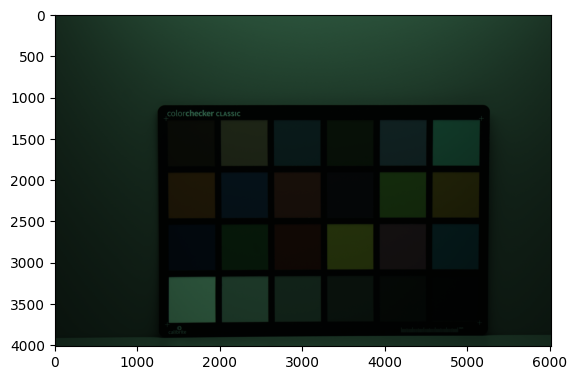

In [214]:
file_raw_0039 = ["data", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0039.NEF"]
path_raw_0039 = os.path.join(*file_raw_0039)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCC", "Illuminant": JND50, "Observer":2}
image_0039 = RawImage(path_raw_0039, metadata, method="postprocess")

image_0039.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0039.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT") # Fails

In [215]:
corners = {"TopLeft":[1339.88,1257.57], "TopRight":[5152.29,1256.65], "BottomRight":[5132.97,3726.93], "BottomLeft":[1348.36,3751.91]}
image_0039.extract_colourchecker_rgb_patches(checker_name="CCC", corners=corners, size_rect=100)

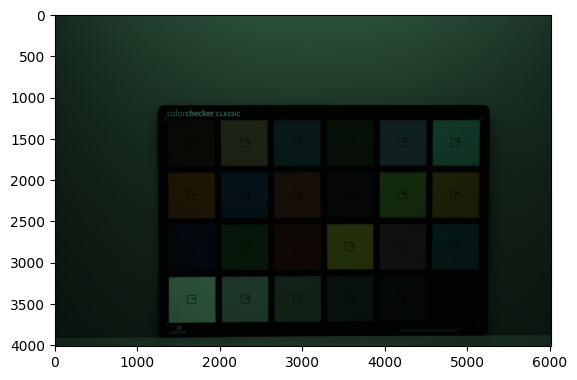

In [216]:
image_0039.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [217]:
CCC_RGB_JND50 = image_0039.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [218]:
data_ccc_jnd50 = pd.merge(CCC_XYZ_JND50, CCC_RGB_JND50, on="patch_id")
data_ccc_jnd50.insert(0, "ColourChecker", "CCC")
data_ccc_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JND50.,13.098988,11.175758,6.059693,MeasuredIlluminant object: Illuminant JND50.,567.4088,684.4784,387.4466
1,CCC,A2,MeasuredIlluminant object: Illuminant JND50.,42.073897,36.429469,21.431142,MeasuredIlluminant object: Illuminant JND50.,1829.1368,2270.2228,1372.7456
2,CCC,A3,MeasuredIlluminant object: Illuminant JND50.,18.279263,19.342328,29.197766,MeasuredIlluminant object: Illuminant JND50.,600.7537,1624.9841,1609.5621
3,CCC,A4,MeasuredIlluminant object: Illuminant JND50.,11.816067,13.975242,6.220325,MeasuredIlluminant object: Illuminant JND50.,468.0329,1033.3222,469.6302
4,CCC,A5,MeasuredIlluminant object: Illuminant JND50.,26.634786,24.703190,37.346611,MeasuredIlluminant object: Illuminant JND50.,1003.4954,2029.2124,2038.6958
5,CCC,A6,MeasuredIlluminant object: Illuminant JND50.,32.197354,43.052727,39.162508,MeasuredIlluminant object: Illuminant JND50.,1039.1764,3414.2612,2404.8716
6,CCC,B1,MeasuredIlluminant object: Illuminant JND50.,44.204826,32.857726,5.789062,MeasuredIlluminant object: Illuminant JND50.,1805.7581,1387.6774,412.4269
7,CCC,B2,MeasuredIlluminant object: Illuminant JND50.,13.236724,12.038578,32.918067,MeasuredIlluminant object: Illuminant JND50.,366.5492,1099.0867,1523.5037
8,CCC,B3,MeasuredIlluminant object: Illuminant JND50.,33.653557,21.557843,11.338584,MeasuredIlluminant object: Illuminant JND50.,1471.7488,956.0860,611.5048
9,CCC,B4,MeasuredIlluminant object: Illuminant JND50.,9.370710,6.935565,12.096359,MeasuredIlluminant object: Illuminant JND50.,310.0824,425.4577,491.7444


In [219]:
data_jnd50.append(data_ccc_jnd50)

### WPP

White - D1

In [220]:
patch_max = find_patch_max_value(data_ccc_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [221]:
data_ccc_jnd50 = apply_wpp(data_ccc_jnd50, "D1")
data_ccc_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JND50.,0.143780,0.121305,0.075693,MeasuredIlluminant object: Illuminant JND50.,0.217204,0.137449,0.109570
1,CCC,A2,MeasuredIlluminant object: Illuminant JND50.,0.461821,0.395417,0.267700,MeasuredIlluminant object: Illuminant JND50.,0.700192,0.455881,0.388214
2,CCC,A3,MeasuredIlluminant object: Illuminant JND50.,0.200641,0.209948,0.364715,MeasuredIlluminant object: Illuminant JND50.,0.229968,0.326311,0.455186
3,CCC,A4,MeasuredIlluminant object: Illuminant JND50.,0.129698,0.151692,0.077699,MeasuredIlluminant object: Illuminant JND50.,0.179163,0.207500,0.132812
4,CCC,A5,MeasuredIlluminant object: Illuminant JND50.,0.292355,0.268136,0.466503,MeasuredIlluminant object: Illuminant JND50.,0.384137,0.407484,0.576545
5,CCC,A6,MeasuredIlluminant object: Illuminant JND50.,0.353412,0.467308,0.489186,MeasuredIlluminant object: Illuminant JND50.,0.397796,0.685613,0.680100
6,CCC,B1,MeasuredIlluminant object: Illuminant JND50.,0.485211,0.356648,0.072312,MeasuredIlluminant object: Illuminant JND50.,0.691243,0.278658,0.116635
7,CCC,B2,MeasuredIlluminant object: Illuminant JND50.,0.145292,0.130671,0.411186,MeasuredIlluminant object: Illuminant JND50.,0.140315,0.220706,0.430849
8,CCC,B3,MeasuredIlluminant object: Illuminant JND50.,0.369396,0.233996,0.141632,MeasuredIlluminant object: Illuminant JND50.,0.563384,0.191990,0.172934
9,CCC,B4,MeasuredIlluminant object: Illuminant JND50.,0.102857,0.075281,0.151098,MeasuredIlluminant object: Illuminant JND50.,0.118699,0.085436,0.139066


In [222]:
data_ccc_jnd50.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.326530,0.309783,0.271951,0.388695,0.334016,0.311450
std,0.232950,0.231004,0.232428,0.272021,0.235179,0.239528
min,0.037045,0.037030,0.038680,0.038334,0.037983,0.039397
25%,0.144914,0.146436,0.100490,0.161168,0.178355,0.131823
50%,0.283516,0.236020,0.187716,0.390265,0.284121,0.224489
75%,0.421807,0.424858,0.414471,0.593678,0.439782,0.433258
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [223]:
data_wpp_jnd50.append(data_ccc_jnd50)

### CCPPV

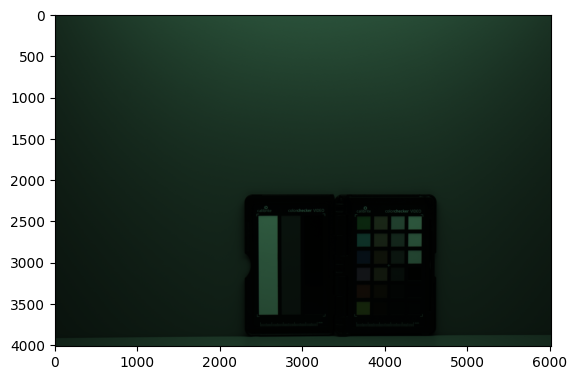

In [224]:
file_raw_0041 = ["data", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0041.NEF"]
path_raw_0041 = os.path.join(*file_raw_0041)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCPPV", "Illuminant": JND50, "Observer":2}
image_0041 = RawImage(path_raw_0041, metadata, method="postprocess")

image_0041.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0041.automatic_colourchecker_extraction(checker_name="CCPPV_24", opencv_descriptor="SIFT") # Fails

In [225]:
corners = {"TopLeft":[3620.06,3652.49], "TopRight":[3624.99,2422.16], "BottomRight":[4448.75,2422.16], "BottomLeft":[4438.94,3650.42]}
image_0041.extract_colourchecker_rgb_patches(checker_name="CCPPV_24", corners=corners, size_rect=40)

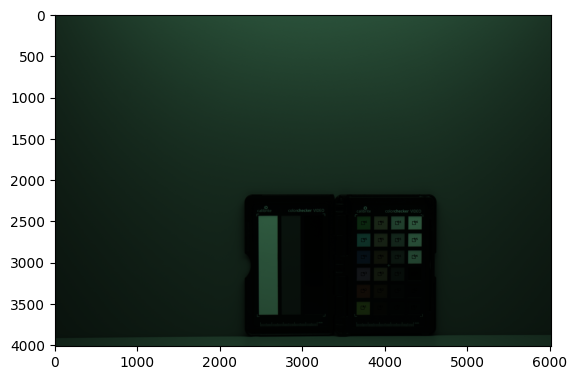

In [226]:
image_0041.show_colourchecker(checker_name="CCPPV", show_image=True, method="matplotlib")

In [227]:
CCPPV_RGB_JND50 = image_0041.get_ColourCheckerRGB("CCPPV").as_pandas_dataframe()

In [228]:
data_ccppv_jnd50 = pd.merge(CCPPV_XYZ_JND50, CCPPV_RGB_JND50, on="patch_id")
data_ccppv_jnd50.insert(0, "ColourChecker", "CCPPV")
data_ccppv_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant JND50.,35.200347,38.239567,10.998083,MeasuredIlluminant object: Illuminant JND50.,1313.300000,2278.600000,761.505000
1,CCPPV,A2,MeasuredIlluminant object: Illuminant JND50.,25.773216,17.540048,8.785754,MeasuredIlluminant object: Illuminant JND50.,1097.450000,732.370000,418.335000
2,CCPPV,A3,MeasuredIlluminant object: Illuminant JND50.,26.311028,18.462795,28.453424,MeasuredIlluminant object: Illuminant JND50.,1184.162500,1314.127500,1506.985000
3,CCPPV,A4,MeasuredIlluminant object: Illuminant JND50.,11.519042,10.098171,25.512969,MeasuredIlluminant object: Illuminant JND50.,391.836250,1008.886250,1422.267500
4,CCPPV,A5,MeasuredIlluminant object: Illuminant JND50.,22.699056,29.427435,32.807369,MeasuredIlluminant object: Illuminant JND50.,913.288750,3109.073750,2503.722500
5,CCPPV,A6,MeasuredIlluminant object: Illuminant JND50.,22.189851,33.326679,12.683645,MeasuredIlluminant object: Illuminant JND50.,721.562500,2452.985000,975.510000
6,CCPPV,B1,MeasuredIlluminant object: Illuminant JND50.,6.331468,5.785355,3.672825,MeasuredIlluminant object: Illuminant JND50.,206.178750,294.283750,177.651250
7,CCPPV,B2,MeasuredIlluminant object: Illuminant JND50.,13.799673,11.959745,6.130962,MeasuredIlluminant object: Illuminant JND50.,526.016250,598.368750,300.492500
8,CCPPV,B3,MeasuredIlluminant object: Illuminant JND50.,24.846124,22.736231,13.712809,MeasuredIlluminant object: Illuminant JND50.,1116.975625,1529.296250,859.020625
9,CCPPV,B4,MeasuredIlluminant object: Illuminant JND50.,21.705982,19.310962,10.326041,MeasuredIlluminant object: Illuminant JND50.,939.053750,1165.016250,600.712500


In [229]:
data_jnd50.append(data_ccppv_jnd50)

### WPP

White - D6

In [230]:
patch_max = find_patch_max_value(data_ccppv_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D6', 'D6', 'D6']
['D6', 'D6', 'D6']


In [231]:
data_ccppv_jnd50 = apply_wpp(data_ccppv_jnd50, "D6")
data_ccppv_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant JND50.,0.455209,0.488563,0.162500,MeasuredIlluminant object: Illuminant JND50.,0.456503,0.416147,0.197104
1,CCPPV,A2,MeasuredIlluminant object: Illuminant JND50.,0.333298,0.224098,0.129812,MeasuredIlluminant object: Illuminant JND50.,0.381474,0.133755,0.108280
2,CCPPV,A3,MeasuredIlluminant object: Illuminant JND50.,0.340253,0.235887,0.420408,MeasuredIlluminant object: Illuminant JND50.,0.411615,0.240003,0.390061
3,CCPPV,A4,MeasuredIlluminant object: Illuminant JND50.,0.148964,0.129018,0.376962,MeasuredIlluminant object: Illuminant JND50.,0.136202,0.184256,0.368133
4,CCPPV,A5,MeasuredIlluminant object: Illuminant JND50.,0.293543,0.375976,0.484739,MeasuredIlluminant object: Illuminant JND50.,0.317459,0.567818,0.648052
5,CCPPV,A6,MeasuredIlluminant object: Illuminant JND50.,0.286958,0.425794,0.187405,MeasuredIlluminant object: Illuminant JND50.,0.250815,0.447995,0.252496
6,CCPPV,B1,MeasuredIlluminant object: Illuminant JND50.,0.081878,0.073916,0.054267,MeasuredIlluminant object: Illuminant JND50.,0.071668,0.053746,0.045982
7,CCPPV,B2,MeasuredIlluminant object: Illuminant JND50.,0.178457,0.152802,0.090587,MeasuredIlluminant object: Illuminant JND50.,0.182843,0.109282,0.077778
8,CCPPV,B3,MeasuredIlluminant object: Illuminant JND50.,0.321309,0.290486,0.202611,MeasuredIlluminant object: Illuminant JND50.,0.388261,0.279299,0.222345
9,CCPPV,B4,MeasuredIlluminant object: Illuminant JND50.,0.280701,0.246724,0.152571,MeasuredIlluminant object: Illuminant JND50.,0.326415,0.212770,0.155486


In [232]:
data_ccppv_jnd50.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.347916,0.341379,0.322071,0.351364,0.330770,0.320733
std,0.290186,0.293746,0.305145,0.283333,0.290119,0.296967
min,0.038111,0.038106,0.040048,0.014222,0.013634,0.014730
25%,0.132192,0.116508,0.088771,0.120069,0.096143,0.072813
50%,0.290250,0.249013,0.195008,0.321937,0.246901,0.237421
75%,0.454095,0.437624,0.423554,0.469353,0.447653,0.404593
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [233]:
data_wpp_jnd50.append(data_ccppv_jnd50)

### XRCCPP

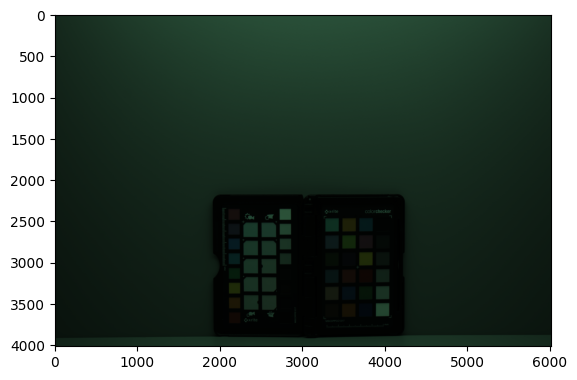

In [234]:
file_raw_0042 = ["data", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0042.NEF"]
path_raw_0042 = os.path.join(*file_raw_0042)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "XRCCPP", "Illuminant": JND50, "Observer":2}
image_0042 = RawImage(path_raw_0042, metadata, method="postprocess")

image_0042.show(method="matplotlib")

RAW RGB data extraction

In [235]:
has_colourchecker, corners, size_rect = image_0042.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

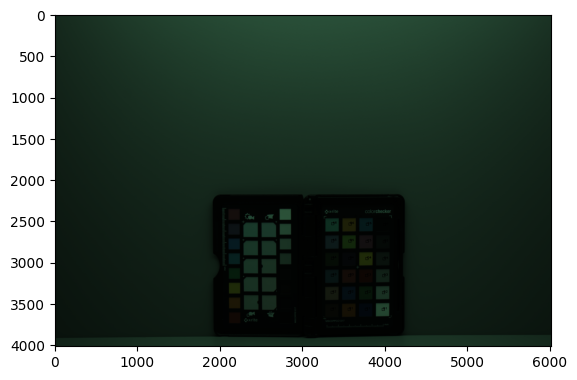

In [236]:
image_0042.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [237]:
XRCCPP_RGB_JND50 = image_0042.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [238]:
data_xrccpp_jnd50 = pd.merge(XRCCPP_XYZ_JND50, XRCCPP_RGB_JND50, on="patch_id")
data_xrccpp_jnd50.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JND50.,12.560599,10.790022,5.930023,MeasuredIlluminant object: Illuminant JND50.,399.577778,495.598889,284.431111
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JND50.,40.288720,34.587995,20.311289,MeasuredIlluminant object: Illuminant JND50.,1314.195556,1623.524444,1002.035556
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JND50.,16.185188,17.088293,25.649972,MeasuredIlluminant object: Illuminant JND50.,482.637778,1241.862222,1191.893333
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JND50.,10.855761,12.785108,5.930286,MeasuredIlluminant object: Illuminant JND50.,364.711111,788.351111,369.167778
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JND50.,22.783469,21.363974,32.105195,MeasuredIlluminant object: Illuminant JND50.,798.804444,1632.088889,1619.212222
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JND50.,30.188540,40.728553,37.528945,MeasuredIlluminant object: Illuminant JND50.,913.627778,2990.853333,2109.666667
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JND50.,41.250490,30.848614,5.600800,MeasuredIlluminant object: Illuminant JND50.,1376.146667,1082.526667,326.420000
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JND50.,12.936640,11.834329,31.501638,MeasuredIlluminant object: Illuminant JND50.,314.565556,903.664444,1216.702222
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JND50.,32.127888,20.561525,10.917440,MeasuredIlluminant object: Illuminant JND50.,1174.693333,750.043333,481.437778
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JND50.,8.864504,6.682658,11.486082,MeasuredIlluminant object: Illuminant JND50.,303.716667,443.360000,491.273333


In [239]:
data_jnd50.append(data_xrccpp_jnd50)

### WPP

White - D1

In [240]:
patch_max = find_patch_max_value(data_xrccpp_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [241]:
data_xrccpp_jnd50 = apply_wpp(data_xrccpp_jnd50, "D1")
data_xrccpp_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JND50.,0.157954,0.134024,0.086111,MeasuredIlluminant object: Illuminant JND50.,0.171552,0.112381,0.091994
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JND50.,0.506646,0.429622,0.294943,MeasuredIlluminant object: Illuminant JND50.,0.564226,0.368149,0.324090
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JND50.,0.203535,0.212256,0.372466,MeasuredIlluminant object: Illuminant JND50.,0.207212,0.281603,0.385496
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JND50.,0.136515,0.158805,0.086114,MeasuredIlluminant object: Illuminant JND50.,0.156582,0.178766,0.119401
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JND50.,0.286511,0.265365,0.466203,MeasuredIlluminant object: Illuminant JND50.,0.342952,0.370091,0.523705
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JND50.,0.379633,0.505894,0.544962,MeasuredIlluminant object: Illuminant JND50.,0.392250,0.678203,0.682334
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JND50.,0.518741,0.383174,0.081330,MeasuredIlluminant object: Illuminant JND50.,0.590824,0.245473,0.105575
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JND50.,0.162683,0.146996,0.457439,MeasuredIlluminant object: Illuminant JND50.,0.135053,0.204914,0.393520
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JND50.,0.404021,0.255397,0.158533,MeasuredIlluminant object: Illuminant JND50.,0.504333,0.170079,0.155712
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JND50.,0.111475,0.083006,0.166791,MeasuredIlluminant object: Illuminant JND50.,0.130395,0.100536,0.158894


In [242]:
data_xrccpp_jnd50.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.339656,0.321959,0.285787,0.385756,0.336853,0.316344
std,0.235896,0.233233,0.238186,0.269275,0.237566,0.237944
min,0.041463,0.041543,0.045200,0.052586,0.053711,0.057016
25%,0.161501,0.155853,0.104056,0.153890,0.160515,0.151008
50%,0.289153,0.251092,0.205062,0.365604,0.269546,0.253888
75%,0.441957,0.447134,0.445558,0.532016,0.464285,0.414878
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [243]:
data_wpp_jnd50.append(data_xrccpp_jnd50)

### SCK100

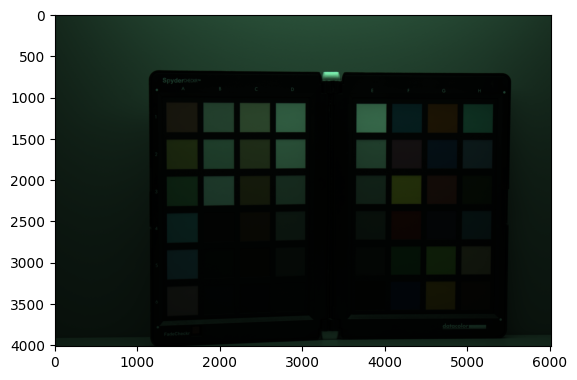

In [244]:
file_raw_0043 = ["data", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0043.NEF"]
path_raw_0043 = os.path.join(*file_raw_0043)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "SCK100", "Illuminant": JND50, "Observer":2}
image_0043 = RawImage(path_raw_0043, metadata, method="postprocess")

image_0043.show(method="matplotlib")

RAW RGB data extraction

In [245]:
has_colourchecker, corners, size_rect = image_0043.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

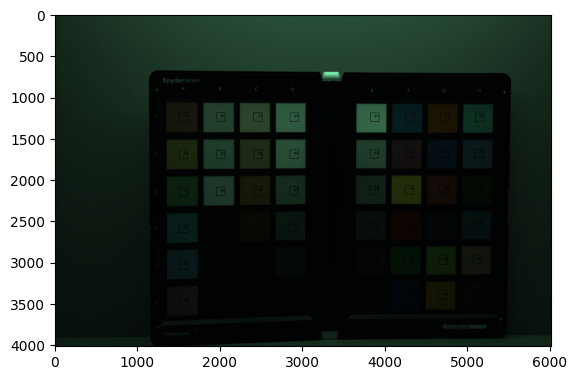

In [246]:
image_0043.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [247]:
SCK100_RGB_JND50 = image_0043.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [248]:
data_sck100_jnd50 = pd.merge(SCK100_XYZ_JND50, SCK100_RGB_JND50, on="patch_id")
data_sck100_jnd50.insert(0, "ColourChecker", "SCK100")
data_sck100_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JND50.,38.980078,29.610111,17.348822,MeasuredIlluminant object: Illuminant JND50.,1497.447855,1427.789201,870.207101
1,SCK100,A2,MeasuredIlluminant object: Illuminant JND50.,49.326695,48.082434,14.598239,MeasuredIlluminant object: Illuminant JND50.,1676.172707,2409.897929,886.477441
2,SCK100,A3,MeasuredIlluminant object: Illuminant JND50.,27.639944,35.306390,19.458814,MeasuredIlluminant object: Illuminant JND50.,776.687870,2027.075814,1057.522189
3,SCK100,A4,MeasuredIlluminant object: Illuminant JND50.,24.637627,30.587982,41.320196,MeasuredIlluminant object: Illuminant JND50.,540.586169,1839.591346,1643.971431
4,SCK100,A5,MeasuredIlluminant object: Illuminant JND50.,26.785986,28.094309,44.642396,MeasuredIlluminant object: Illuminant JND50.,557.465237,1496.550851,1500.178809
5,SCK100,A6,MeasuredIlluminant object: Illuminant JND50.,36.897037,28.357019,27.675519,MeasuredIlluminant object: Illuminant JND50.,880.943602,996.571376,821.895895
6,SCK100,B1,MeasuredIlluminant object: Illuminant JND50.,61.145199,60.204390,51.631169,MeasuredIlluminant object: Illuminant JND50.,2207.958580,4032.908839,2848.550296
7,SCK100,B2,MeasuredIlluminant object: Illuminant JND50.,57.740154,59.880533,50.783526,MeasuredIlluminant object: Illuminant JND50.,1901.270155,3820.461354,2638.469305
8,SCK100,B3,MeasuredIlluminant object: Illuminant JND50.,60.116807,60.232214,55.971033,MeasuredIlluminant object: Illuminant JND50.,1811.097633,3505.775518,2591.219305
9,SCK100,B4,MeasuredIlluminant object: Illuminant JND50.,6.298845,5.899604,4.867330,MeasuredIlluminant object: Illuminant JND50.,158.616402,246.680473,174.689442


In [249]:
data_jnd50.append(data_sck100_jnd50)

### WPP

White - E1

In [250]:
patch_max = find_patch_max_value(data_sck100_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [251]:
data_sck100_jnd50 = apply_wpp(data_sck100_jnd50, "E1")
data_sck100_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JND50.,0.438399,0.330192,0.221741,MeasuredIlluminant object: Illuminant JND50.,0.441977,0.219931,0.188809
1,SCK100,A2,MeasuredIlluminant object: Illuminant JND50.,0.554765,0.536183,0.186585,MeasuredIlluminant object: Illuminant JND50.,0.494728,0.371211,0.192339
2,SCK100,A3,MeasuredIlluminant object: Illuminant JND50.,0.310859,0.393713,0.248710,MeasuredIlluminant object: Illuminant JND50.,0.229242,0.312243,0.229450
3,SCK100,A4,MeasuredIlluminant object: Illuminant JND50.,0.277093,0.341097,0.528127,MeasuredIlluminant object: Illuminant JND50.,0.159556,0.283363,0.356692
4,SCK100,A5,MeasuredIlluminant object: Illuminant JND50.,0.301255,0.313289,0.570589,MeasuredIlluminant object: Illuminant JND50.,0.164538,0.230523,0.325493
5,SCK100,A6,MeasuredIlluminant object: Illuminant JND50.,0.414972,0.316219,0.353730,MeasuredIlluminant object: Illuminant JND50.,0.260013,0.153508,0.178327
6,SCK100,B1,MeasuredIlluminant object: Illuminant JND50.,0.687685,0.671359,0.659915,MeasuredIlluminant object: Illuminant JND50.,0.651686,0.621213,0.618049
7,SCK100,B2,MeasuredIlluminant object: Illuminant JND50.,0.649389,0.667748,0.649081,MeasuredIlluminant object: Illuminant JND50.,0.561166,0.588489,0.572468
8,SCK100,B3,MeasuredIlluminant object: Illuminant JND50.,0.676119,0.671669,0.715384,MeasuredIlluminant object: Illuminant JND50.,0.534551,0.540016,0.562216
9,SCK100,B4,MeasuredIlluminant object: Illuminant JND50.,0.070842,0.065788,0.062211,MeasuredIlluminant object: Illuminant JND50.,0.046816,0.037998,0.037902


In [252]:
data_sck100_jnd50.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.355369,0.342142,0.304477,0.297687,0.265785,0.249749
std,0.251418,0.248300,0.249830,0.253366,0.238498,0.238270
min,0.046960,0.047106,0.048477,0.023162,0.022732,0.023244
25%,0.137817,0.140490,0.084020,0.086241,0.080565,0.063085
50%,0.306057,0.299084,0.235225,0.237518,0.200301,0.175420
75%,0.517549,0.490532,0.464682,0.455165,0.379059,0.339927
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [253]:
data_wpp_jnd50.append(data_sck100_jnd50)

## Merge data

In [254]:
data_pd_jnd50 = pd.concat(data_jnd50, ignore_index=True)

data_pd_jnd50 = data_pd_jnd50.drop(columns="illuminant_y")
data_pd_jnd50 = data_pd_jnd50.rename(columns={"illuminant_x":"illuminant"})
data_pd_jnd50["illuminant"] = "JND50" # as str to avoid error
data_pd_jnd50

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JND50,18.410151,11.546970,12.587745,723.809240,414.256519,469.656179
1,CCDSG,B3,JND50,40.836037,33.499315,41.062774,1515.942744,2108.683673,2019.792517
2,CCDSG,B4,JND50,15.707469,10.120208,22.228786,443.030329,443.162132,770.748724
3,CCDSG,B5,JND50,18.458344,21.427231,49.089425,377.568027,1765.312925,2240.942177
4,CCDSG,B6,JND50,24.157322,31.693107,46.871468,564.136338,2328.946995,2231.630952
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,JND50,25.443454,24.004752,36.437690,720.289386,1514.436575,1540.944619
212,SCK100,H3,JND50,10.802643,12.943049,5.940856,263.123336,599.286797,248.667345
213,SCK100,H4,JND50,17.545460,18.798930,28.274609,363.757396,1005.123521,972.729290
214,SCK100,H5,JND50,40.873902,35.567215,21.010066,1060.731879,1328.146820,795.105769


In [255]:
data_pd_wpp_jnd50 = pd.concat(data_wpp_jnd50, ignore_index=True)

data_pd_wpp_jnd50 = data_pd_wpp_jnd50.drop(columns="illuminant_y")
data_pd_wpp_jnd50 = data_pd_wpp_jnd50.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_jnd50["illuminant"] = "JND50" # as str to avoid error
data_pd_wpp_jnd50

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JND50,0.204757,0.127027,0.159134,0.229752,0.068889,0.109369
1,CCDSG,B3,JND50,0.454177,0.368523,0.519114,0.481192,0.350663,0.470351
2,CCDSG,B4,JND50,0.174698,0.111331,0.281015,0.140627,0.073696,0.179485
3,CCDSG,B5,JND50,0.205293,0.235719,0.620586,0.119848,0.293563,0.521851
4,CCDSG,B6,JND50,0.268677,0.348653,0.592547,0.179069,0.387292,0.519682
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,JND50,0.286156,0.267685,0.465722,0.212596,0.233278,0.334338
212,SCK100,H3,JND50,0.121495,0.144332,0.075932,0.077662,0.092312,0.053953
213,SCK100,H4,JND50,0.197329,0.209633,0.361387,0.107364,0.154825,0.211053
214,SCK100,H5,JND50,0.459698,0.396622,0.268537,0.313079,0.204583,0.172514


## Indoor

## SPD32

In [256]:
data_spd32 = []
data_wpp_spd32 = []

| Image                                 |  Illuminant  | ColourChecker                         | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-05-25_NikonD5600_0002.NEF | SPD32-5011ºK | CCDSG  - Calibrite DIGITAL SG        | 140     |
| INDIGO_2022-05-25_NikonD5600_0001.NEF | SPD32-5011ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-05-25_NikonD5600_0004.NEF | SPD32-5011ºK | CCPPV - Calibrite PASSPORT VIDEO     | 24      |
| INDIGO_2022-05-25_NikonD5600_0005.NEF | SPD32-5011ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-05-25_NikonD5600_0003.NEF | SPD32-5011ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/SPD32/INDIGO_2022-05-25_NikonD5600_0002.jpg" width="400">
<img src="res/screenshot/SPD32/INDIGO_2022-05-25_NikonD5600_0001.jpg" width="400">
<img src="res/screenshot/SPD32/INDIGO_2022-05-25_NikonD5600_0004.jpg" width="400">
<img src="res/screenshot/SPD32/INDIGO_2022-05-25_NikonD5600_0005.jpg" width="400">
<img src="res/screenshot/SPD32/INDIGO_2022-05-25_NikonD5600_0003.jpg" width="400">


## SPD Illuminant

SPD32

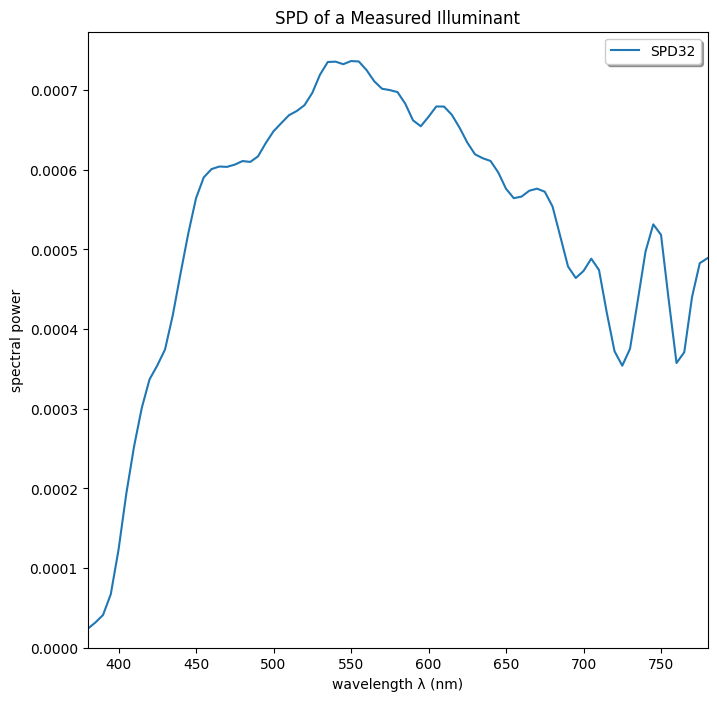

In [257]:
file_spd = ["res", "spd", "INDIGO-C7000-A_032_02°_5011K.csv"]
path_spd = os.path.join(*file_spd)

SPD32 = MeasuredIlluminant(illuminant_name="SPD32", path_file=path_spd)

SPD32.plot()

XYZ data (under JNA)

In [258]:
CCDSG_XYZ_SPD32 = CCDSG.to_ColourCheckerXYZ(illuminant=SPD32, observer=2).as_pandas_dataframe()

In [259]:
CCC_XYZ_SPD32 = CCC.to_ColourCheckerXYZ(illuminant=SPD32, observer=2).as_pandas_dataframe()

In [260]:
CCPPV_XYZ_SPD32 = CCPPV.to_ColourCheckerXYZ(illuminant=SPD32, observer=2).as_pandas_dataframe()

In [261]:
XRCCPP_XYZ_SPD32 = XRCCPP.to_ColourCheckerXYZ(illuminant=SPD32, observer=2).as_pandas_dataframe()

In [262]:
SCK100_XYZ_SPD32 = SCK100.to_ColourCheckerXYZ(illuminant=SPD32, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

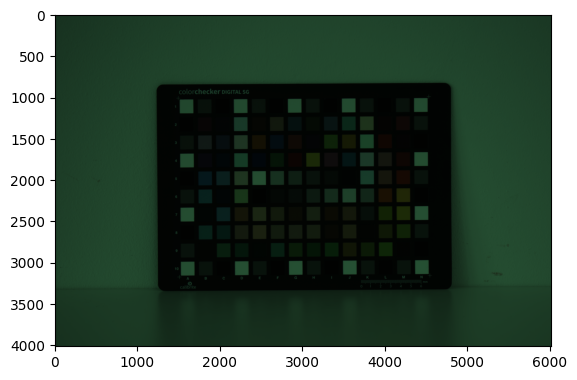

In [263]:
file_raw_0002i = ["data", "Indoor", "SPD32", "INDIGO_2022-05-25_NikonD5600_0002.NEF"]
path_raw_0002i= os.path.join(*file_raw_0002i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "CCDSG", "Illuminant": SPD32, "Observer":2}
image_0002i = RawImage(path_raw_0002i, metadata, method="postprocess")

image_0002i.show(method="matplotlib")

RAW RGB data extraction

In [264]:
has_colourchecker, corners, size_rect = image_0002i.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

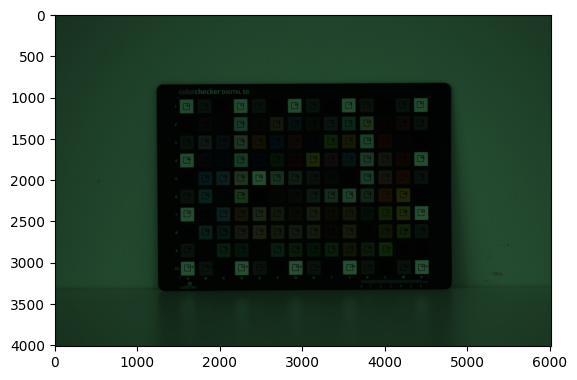

In [265]:
image_0002i.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [266]:
CCDSG_RGB_SPD32 = image_0002i.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [267]:
data_ccdsg_spd32 = pd.merge(CCDSG_XYZ_SPD32, CCDSG_RGB_SPD32, on="patch_id")
data_ccdsg_spd32.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant SPD32.,84.646170,90.861159,68.727225,MeasuredIlluminant object: Illuminant SPD32.,2160.645727,4554.218042,2927.173119
1,CCDSG,A2,MeasuredIlluminant object: Illuminant SPD32.,4.116763,4.392978,3.398870,MeasuredIlluminant object: Illuminant SPD32.,82.563915,166.612856,108.737034
2,CCDSG,A3,MeasuredIlluminant object: Illuminant SPD32.,20.605989,22.095501,16.945781,MeasuredIlluminant object: Illuminant SPD32.,519.189920,1089.692476,701.670562
3,CCDSG,A4,MeasuredIlluminant object: Illuminant SPD32.,83.657895,89.800813,68.052758,MeasuredIlluminant object: Illuminant SPD32.,2252.669467,4733.910153,3041.275383
4,CCDSG,A5,MeasuredIlluminant object: Illuminant SPD32.,4.101689,4.378171,3.390265,MeasuredIlluminant object: Illuminant SPD32.,80.168006,160.880752,104.585464
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant SPD32.,4.098190,4.375063,3.387885,MeasuredIlluminant object: Illuminant SPD32.,85.254018,167.823229,108.523192
136,CCDSG,N7,MeasuredIlluminant object: Illuminant SPD32.,84.110601,90.285299,68.388790,MeasuredIlluminant object: Illuminant SPD32.,2404.411980,5025.466764,3239.434624
137,CCDSG,N8,MeasuredIlluminant object: Illuminant SPD32.,20.663591,22.154798,16.967227,MeasuredIlluminant object: Illuminant SPD32.,562.712564,1173.366326,757.030314
138,CCDSG,N9,MeasuredIlluminant object: Illuminant SPD32.,4.073614,4.347599,3.358430,MeasuredIlluminant object: Illuminant SPD32.,87.666910,173.262235,111.875091


In [268]:
data_ccdsg_spd32 = data_ccdsg_spd32[(data_ccdsg_spd32["patch_id"].str.contains("1")==False) & (data_ccdsg_spd32["patch_id"].str.contains("0")==False) & (data_ccdsg_spd32["patch_id"].str.contains("0")==False) & (data_ccdsg_spd32["patch_id"].str.contains("A")==False) & (data_ccdsg_spd32["patch_id"].str.contains("N")==False)]
data_ccdsg_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant SPD32.,16.268791,10.740402,10.965548,MeasuredIlluminant object: Illuminant SPD32.,489.128561,381.420745,367.101534
12,CCDSG,B3,MeasuredIlluminant object: Illuminant SPD32.,37.385538,32.525748,35.753355,MeasuredIlluminant object: Illuminant SPD32.,1044.653397,1604.747261,1394.165084
13,CCDSG,B4,MeasuredIlluminant object: Illuminant SPD32.,14.164829,9.560519,19.380163,MeasuredIlluminant object: Illuminant SPD32.,368.083272,438.312637,627.596056
14,CCDSG,B5,MeasuredIlluminant object: Illuminant SPD32.,17.235838,21.006411,42.872054,MeasuredIlluminant object: Illuminant SPD32.,343.335281,1512.040906,1748.531045
15,CCDSG,B6,MeasuredIlluminant object: Illuminant SPD32.,22.901358,31.595065,40.623825,MeasuredIlluminant object: Illuminant SPD32.,515.319942,2118.242148,1827.893353
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant SPD32.,37.175450,22.873005,5.783552,MeasuredIlluminant object: Illuminant SPD32.,1368.989774,640.009496,254.225347
125,CCDSG,M6,MeasuredIlluminant object: Illuminant SPD32.,66.957214,61.524962,7.810749,MeasuredIlluminant object: Illuminant SPD32.,2074.344777,2457.171658,491.941198
126,CCDSG,M7,MeasuredIlluminant object: Illuminant SPD32.,60.119088,62.200511,6.218970,MeasuredIlluminant object: Illuminant SPD32.,1828.819211,2713.136961,475.016435
127,CCDSG,M8,MeasuredIlluminant object: Illuminant SPD32.,37.051981,44.979270,6.572756,MeasuredIlluminant object: Illuminant SPD32.,1020.158510,2156.257122,465.395909


In [269]:
data_spd32.append(data_ccdsg_spd32)

### WPP

White - E5

In [270]:
patch_max = find_patch_max_value(data_ccdsg_spd32)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [271]:
data_ccdsg_spd32 = apply_wpp(data_ccdsg_spd32, "E5")
data_ccdsg_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant SPD32.,0.192085,0.118150,0.159627,MeasuredIlluminant object: Illuminant SPD32.,0.210037,0.078027,0.117232
12,CCDSG,B3,MeasuredIlluminant object: Illuminant SPD32.,0.441410,0.357800,0.520467,MeasuredIlluminant object: Illuminant SPD32.,0.448586,0.328284,0.445221
13,CCDSG,B4,MeasuredIlluminant object: Illuminant SPD32.,0.167244,0.105171,0.282120,MeasuredIlluminant object: Illuminant SPD32.,0.158059,0.089666,0.200420
14,CCDSG,B5,MeasuredIlluminant object: Illuminant SPD32.,0.203503,0.231081,0.624095,MeasuredIlluminant object: Illuminant SPD32.,0.147432,0.309319,0.558386
15,CCDSG,B6,MeasuredIlluminant object: Illuminant SPD32.,0.270396,0.347562,0.591367,MeasuredIlluminant object: Illuminant SPD32.,0.221284,0.433330,0.583730
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant SPD32.,0.438930,0.251615,0.084192,MeasuredIlluminant object: Illuminant SPD32.,0.587859,0.130927,0.081186
125,CCDSG,M6,MeasuredIlluminant object: Illuminant SPD32.,0.790563,0.676806,0.113702,MeasuredIlluminant object: Illuminant SPD32.,0.890747,0.502665,0.157099
126,CCDSG,M7,MeasuredIlluminant object: Illuminant SPD32.,0.709825,0.684238,0.090530,MeasuredIlluminant object: Illuminant SPD32.,0.785315,0.555028,0.151695
127,CCDSG,M8,MeasuredIlluminant object: Illuminant SPD32.,0.437472,0.494795,0.095681,MeasuredIlluminant object: Illuminant SPD32.,0.438067,0.441107,0.148622


In [272]:
data_ccdsg_spd32.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.359874,0.343982,0.286629,0.371737,0.318347,0.286338
std,0.227683,0.222816,0.235567,0.248245,0.221681,0.231514
min,0.048308,0.048040,0.049208,0.035382,0.033540,0.033882
25%,0.160375,0.159195,0.099141,0.146791,0.127774,0.110881
50%,0.333561,0.347138,0.211406,0.351321,0.306955,0.205790
75%,0.475854,0.465611,0.410691,0.538071,0.430417,0.384343
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [273]:
data_wpp_spd32.append(data_ccdsg_spd32)

### CCC

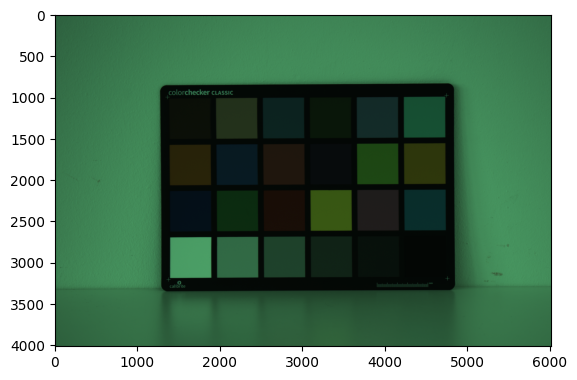

In [274]:
file_raw_0001i = ["data", "Indoor", "SPD32", "INDIGO_2022-05-25_NikonD5600_0001.NEF"]
path_raw_0001i = os.path.join(*file_raw_0001i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "CCC", "Illuminant": SPD32, "Observer":2}
image_0001i = RawImage(path_raw_0001i, metadata, method="postprocess")

image_0001i.show(method="matplotlib")

RAW RGB data extraction

In [275]:
has_colourchecker, corners, size_rect = image_0001i.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT")

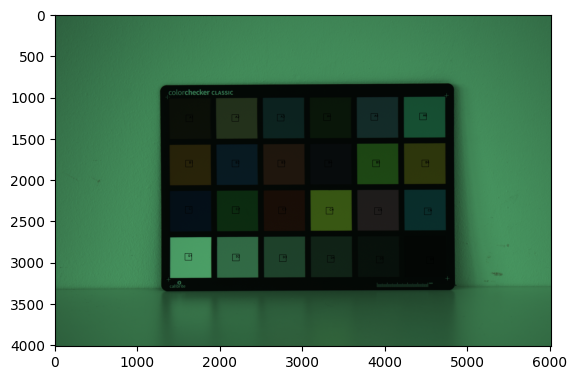

In [276]:
image_0001i.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [277]:
CCC_RGB_SPD32 = image_0001i.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [278]:
data_ccc_spd32 = pd.merge(CCC_XYZ_SPD32, CCC_RGB_SPD32, on="patch_id")
data_ccc_spd32.insert(0, "ColourChecker", "CCC")
data_ccc_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant SPD32.,12.143697,11.038802,5.258558,MeasuredIlluminant object: Illuminant SPD32.,177.415080,243.110054,127.012046
1,CCC,A2,MeasuredIlluminant object: Illuminant SPD32.,38.506470,35.551973,18.521229,MeasuredIlluminant object: Illuminant SPD32.,564.395003,789.121059,439.416419
2,CCC,A3,MeasuredIlluminant object: Illuminant SPD32.,17.208724,19.193302,25.453253,MeasuredIlluminant object: Illuminant SPD32.,199.985128,561.936942,509.861392
3,CCC,A4,MeasuredIlluminant object: Illuminant SPD32.,11.380645,14.183805,5.381845,MeasuredIlluminant object: Illuminant SPD32.,147.932778,357.750744,150.269929
4,CCC,A5,MeasuredIlluminant object: Illuminant SPD32.,24.475642,24.064665,32.532676,MeasuredIlluminant object: Illuminant SPD32.,317.665378,691.299524,647.597858
5,CCC,A6,MeasuredIlluminant object: Illuminant SPD32.,31.154612,43.579261,33.812267,MeasuredIlluminant object: Illuminant SPD32.,362.563355,1267.282570,810.309340
6,CCC,B1,MeasuredIlluminant object: Illuminant SPD32.,40.719433,32.266562,5.011403,MeasuredIlluminant object: Illuminant SPD32.,638.057109,561.856336,154.236169
7,CCC,B2,MeasuredIlluminant object: Illuminant SPD32.,12.286057,11.749995,28.790822,MeasuredIlluminant object: Illuminant SPD32.,136.928168,422.797739,543.968917
8,CCC,B3,MeasuredIlluminant object: Illuminant SPD32.,29.598221,19.960287,9.879678,MeasuredIlluminant object: Illuminant SPD32.,501.640095,362.959548,219.584176
9,CCC,B4,MeasuredIlluminant object: Illuminant SPD32.,8.548121,6.663980,10.557428,MeasuredIlluminant object: Illuminant SPD32.,122.295955,182.901844,196.785544


In [279]:
data_spd32.append(data_ccc_spd32)

### WPP

White - D1

In [280]:
patch_max = find_patch_max_value(data_ccc_spd32)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [281]:
data_ccc_spd32 = apply_wpp(data_ccc_spd32, "D1")
data_ccc_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant SPD32.,0.141494,0.119806,0.075630,MeasuredIlluminant object: Illuminant SPD32.,0.148886,0.096441,0.078299
1,CCC,A2,MeasuredIlluminant object: Illuminant SPD32.,0.448662,0.385852,0.266378,MeasuredIlluminant object: Illuminant SPD32.,0.473637,0.313043,0.270885
2,CCC,A3,MeasuredIlluminant object: Illuminant SPD32.,0.200509,0.208308,0.366076,MeasuredIlluminant object: Illuminant SPD32.,0.167827,0.222920,0.314312
3,CCC,A4,MeasuredIlluminant object: Illuminant SPD32.,0.132603,0.153939,0.077403,MeasuredIlluminant object: Illuminant SPD32.,0.124144,0.141919,0.092636
4,CCC,A5,MeasuredIlluminant object: Illuminant SPD32.,0.285181,0.261178,0.467894,MeasuredIlluminant object: Illuminant SPD32.,0.266583,0.274238,0.399222
5,CCC,A6,MeasuredIlluminant object: Illuminant SPD32.,0.363001,0.472974,0.486298,MeasuredIlluminant object: Illuminant SPD32.,0.304261,0.502730,0.499528
6,CCC,B1,MeasuredIlluminant object: Illuminant SPD32.,0.474447,0.350195,0.072075,MeasuredIlluminant object: Illuminant SPD32.,0.535454,0.222888,0.095081
7,CCC,B2,MeasuredIlluminant object: Illuminant SPD32.,0.143152,0.127525,0.414078,MeasuredIlluminant object: Illuminant SPD32.,0.114909,0.167723,0.335338
8,CCC,B3,MeasuredIlluminant object: Illuminant SPD32.,0.344867,0.216633,0.142092,MeasuredIlluminant object: Illuminant SPD32.,0.420974,0.143986,0.135366
9,CCC,B4,MeasuredIlluminant object: Illuminant SPD32.,0.099599,0.072325,0.151840,MeasuredIlluminant object: Illuminant SPD32.,0.102630,0.072557,0.121312


In [282]:
data_ccc_spd32.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.323521,0.307699,0.272280,0.332961,0.288090,0.271669
std,0.232690,0.233166,0.232492,0.246788,0.223594,0.221661
min,0.037049,0.037030,0.038727,0.043091,0.042123,0.044451
25%,0.142738,0.140604,0.101067,0.130829,0.133390,0.118904
50%,0.269054,0.220956,0.188330,0.285422,0.223002,0.212383
75%,0.424129,0.426513,0.416711,0.434140,0.366320,0.351309
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [283]:
data_wpp_spd32.append(data_ccc_spd32)

### CCPPV

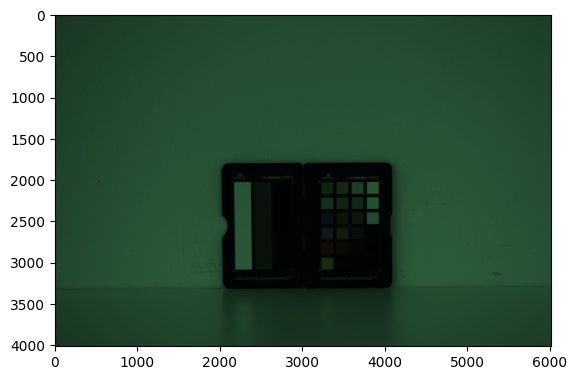

In [284]:
file_raw_0004i = ["data", "Indoor", "SPD32", "INDIGO_2022-05-25_NikonD5600_0004.NEF"]
path_raw_0004i = os.path.join(*file_raw_0004i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "CCPPV", "Illuminant": SPD32, "Observer":2}
image_0004i = RawImage(path_raw_0004i, metadata, method="postprocess")

image_0004i.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0004i.automatic_colourchecker_extraction(checker_name="CCPPV_24", opencv_descriptor="SIFT") # Fails

In [285]:
corners = {"TopLeft":[3196.8,3100.93], "TopRight":[3196.7,2013.09], "BottomRight":[3924,2013.09], "BottomLeft":[3924,3100.93]}
image_0004i.extract_colourchecker_rgb_patches(checker_name="CCPPV_24", corners=corners, size_rect=40)

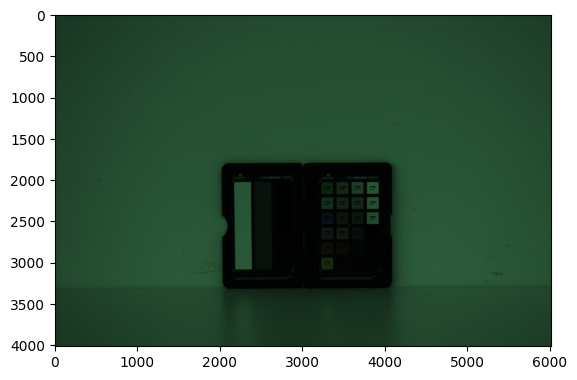

In [286]:
image_0004i.show_colourchecker(checker_name="CCPPV", show_image=True, method="matplotlib")

In [287]:
CCPPV_RGB_SPD32 = image_0004i.get_ColourCheckerRGB("CCPPV").as_pandas_dataframe()

In [289]:
data_ccppv_spd32 = pd.merge(CCPPV_XYZ_SPD32, CCPPV_RGB_SPD32, on="patch_id")
data_ccppv_spd32.insert(0, "ColourChecker", "CCPPV")
data_ccppv_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant SPD32.,33.889870,38.958863,9.555968,MeasuredIlluminant object: Illuminant SPD32.,1463.407500,2847.230000,868.850000
1,CCPPV,A2,MeasuredIlluminant object: Illuminant SPD32.,23.249314,16.751567,7.653139,MeasuredIlluminant object: Illuminant SPD32.,1119.775000,844.515000,444.607500
2,CCPPV,A3,MeasuredIlluminant object: Illuminant SPD32.,23.645721,17.501367,24.793240,MeasuredIlluminant object: Illuminant SPD32.,1161.090000,1381.002500,1502.615000
3,CCPPV,A4,MeasuredIlluminant object: Illuminant SPD32.,10.737700,9.843445,22.214469,MeasuredIlluminant object: Illuminant SPD32.,393.490000,1033.180000,1365.602500
4,CCPPV,A5,MeasuredIlluminant object: Illuminant SPD32.,21.750074,29.579067,28.386012,MeasuredIlluminant object: Illuminant SPD32.,866.160000,3127.017500,2275.403750
5,CCPPV,A6,MeasuredIlluminant object: Illuminant SPD32.,22.077289,34.325878,10.967807,MeasuredIlluminant object: Illuminant SPD32.,654.215000,2383.695000,856.922500
6,CCPPV,B1,MeasuredIlluminant object: Illuminant SPD32.,5.971769,5.806012,3.191999,MeasuredIlluminant object: Illuminant SPD32.,220.176250,350.795000,189.625000
7,CCPPV,B2,MeasuredIlluminant object: Illuminant SPD32.,12.809427,11.851741,5.334368,MeasuredIlluminant object: Illuminant SPD32.,557.903750,728.616250,337.968750
8,CCPPV,B3,MeasuredIlluminant object: Illuminant SPD32.,23.104013,22.569153,11.936800,MeasuredIlluminant object: Illuminant SPD32.,1119.542500,1726.918750,883.479375
9,CCPPV,B4,MeasuredIlluminant object: Illuminant SPD32.,20.149156,19.144072,8.991313,MeasuredIlluminant object: Illuminant SPD32.,915.741875,1291.425000,613.667500


In [290]:
data_spd32.append(data_ccppv_spd32)

### WPP

White - D6

In [291]:
patch_max = find_patch_max_value(data_ccppv_spd32)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D6', 'D6', 'D6']
['D6', 'D6', 'D6']


In [292]:
data_ccppv_spd32 = apply_wpp(data_ccppv_spd32, "D6")
data_ccppv_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant SPD32.,0.465167,0.497661,0.162574,MeasuredIlluminant object: Illuminant SPD32.,0.561970,0.523574,0.249835
1,CCPPV,A2,MeasuredIlluminant object: Illuminant SPD32.,0.319116,0.213985,0.130201,MeasuredIlluminant object: Illuminant SPD32.,0.430010,0.155297,0.127846
2,CCPPV,A3,MeasuredIlluminant object: Illuminant SPD32.,0.324558,0.223563,0.421802,MeasuredIlluminant object: Illuminant SPD32.,0.445875,0.253951,0.432073
3,CCPPV,A4,MeasuredIlluminant object: Illuminant SPD32.,0.147384,0.125740,0.377930,MeasuredIlluminant object: Illuminant SPD32.,0.151106,0.189990,0.392675
4,CCPPV,A5,MeasuredIlluminant object: Illuminant SPD32.,0.298538,0.377843,0.482925,MeasuredIlluminant object: Illuminant SPD32.,0.332618,0.575024,0.654286
5,CCPPV,A6,MeasuredIlluminant object: Illuminant SPD32.,0.303029,0.438479,0.186593,MeasuredIlluminant object: Illuminant SPD32.,0.251228,0.438335,0.246406
6,CCPPV,B1,MeasuredIlluminant object: Illuminant SPD32.,0.081968,0.074166,0.054305,MeasuredIlluminant object: Illuminant SPD32.,0.084551,0.064507,0.054526
7,CCPPV,B2,MeasuredIlluminant object: Illuminant SPD32.,0.175820,0.151394,0.090753,MeasuredIlluminant object: Illuminant SPD32.,0.214243,0.133984,0.097182
8,CCPPV,B3,MeasuredIlluminant object: Illuminant SPD32.,0.317122,0.288298,0.203078,MeasuredIlluminant object: Illuminant SPD32.,0.429920,0.317561,0.254042
9,CCPPV,B4,MeasuredIlluminant object: Illuminant SPD32.,0.276564,0.244546,0.152967,MeasuredIlluminant object: Illuminant SPD32.,0.351658,0.237479,0.176458


In [293]:
data_ccppv_spd32.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.346898,0.340713,0.322241,0.374086,0.351007,0.340544
std,0.290158,0.294550,0.305189,0.290343,0.296483,0.302490
min,0.038111,0.038103,0.040095,0.021831,0.021573,0.023228
25%,0.131030,0.114055,0.088927,0.134467,0.118874,0.091769
50%,0.300784,0.247976,0.194836,0.342138,0.263977,0.251939
75%,0.452150,0.446085,0.424759,0.524499,0.474722,0.440834
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [294]:
data_wpp_spd32.append(data_ccppv_spd32)

### XRCCPP

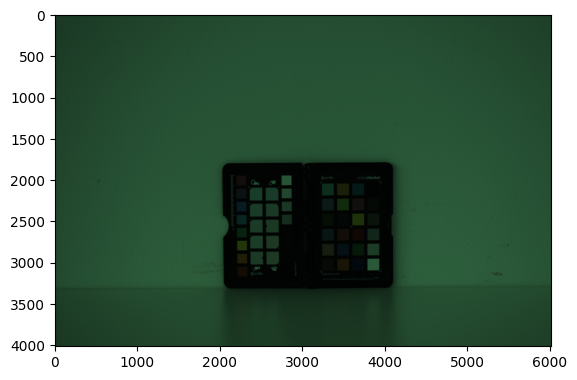

In [295]:
file_raw_0005i = ["data", "Indoor", "SPD32", "INDIGO_2022-05-25_NikonD5600_0005.NEF"]
path_raw_0005i = os.path.join(*file_raw_0005i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "XRCCPP", "Illuminant": SPD32, "Observer":2}
image_0005i = RawImage(path_raw_0005i, metadata, method="postprocess")

image_0005i.show(method="matplotlib")

RAW RGB data extraction

In [296]:
has_colourchecker, corners, size_rect = image_0005i.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

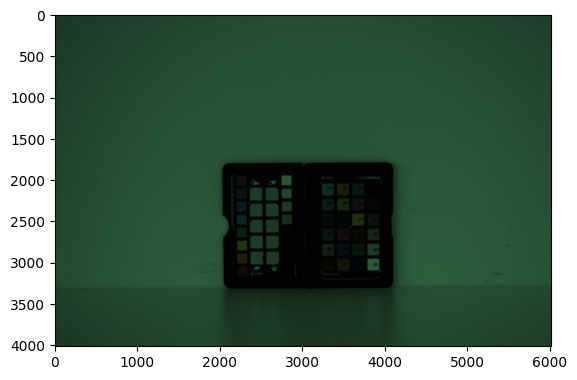

In [297]:
image_0005i.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [298]:
XRCCPP_RGB_SPD32 = image_0005i.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [299]:
data_xrccpp_spd32 = pd.merge(XRCCPP_XYZ_SPD32, XRCCPP_RGB_SPD32, on="patch_id")
data_xrccpp_spd32.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant SPD32.,11.670449,10.680254,5.148434,MeasuredIlluminant object: Illuminant SPD32.,437.849112,603.934911,312.860947
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant SPD32.,36.810833,33.641045,17.511374,MeasuredIlluminant object: Illuminant SPD32.,1419.786982,1932.926036,1088.035503
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant SPD32.,15.232674,16.960271,22.349400,MeasuredIlluminant object: Illuminant SPD32.,503.553254,1395.636095,1243.396450
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant SPD32.,10.421726,12.956693,5.130053,MeasuredIlluminant object: Illuminant SPD32.,364.112426,865.272189,366.508876
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant SPD32.,21.129125,20.959260,27.965735,MeasuredIlluminant object: Illuminant SPD32.,752.735207,1658.042899,1525.399408
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant SPD32.,29.266611,41.264224,32.423859,MeasuredIlluminant object: Illuminant SPD32.,844.204142,2975.792899,1901.201183
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant SPD32.,38.000643,30.288569,4.851200,MeasuredIlluminant object: Illuminant SPD32.,1546.090237,1366.644970,371.461538
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant SPD32.,12.023218,11.550233,27.566625,MeasuredIlluminant object: Illuminant SPD32.,342.378698,1040.284024,1317.372781
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant SPD32.,28.233161,19.016565,9.509564,MeasuredIlluminant object: Illuminant SPD32.,1207.810651,858.491124,517.224852
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant SPD32.,8.164980,6.448828,10.015679,MeasuredIlluminant object: Illuminant SPD32.,301.869822,462.526627,484.471893


In [300]:
data_spd32.append(data_xrccpp_spd32)

### WPP

White - D1

In [301]:
patch_max = find_patch_max_value(data_xrccpp_spd32)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [302]:
data_xrccpp_spd32 = apply_wpp(data_xrccpp_spd32, "D1")
data_xrccpp_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant SPD32.,0.155760,0.132623,0.086086,MeasuredIlluminant object: Illuminant SPD32.,0.158691,0.104794,0.085249
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant SPD32.,0.491296,0.417740,0.292806,MeasuredIlluminant object: Illuminant SPD32.,0.514577,0.335400,0.296469
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant SPD32.,0.203303,0.210605,0.373702,MeasuredIlluminant object: Illuminant SPD32.,0.182504,0.242170,0.338802
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant SPD32.,0.139094,0.160891,0.085779,MeasuredIlluminant object: Illuminant SPD32.,0.131966,0.150141,0.099867
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant SPD32.,0.282000,0.260263,0.467612,MeasuredIlluminant object: Illuminant SPD32.,0.272816,0.287702,0.415643
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant SPD32.,0.390607,0.512401,0.542156,MeasuredIlluminant object: Illuminant SPD32.,0.305967,0.516357,0.518041
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant SPD32.,0.507176,0.376110,0.081116,MeasuredIlluminant object: Illuminant SPD32.,0.560353,0.237139,0.101216
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant SPD32.,0.160468,0.143426,0.460938,MeasuredIlluminant object: Illuminant SPD32.,0.124089,0.180509,0.358959
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant SPD32.,0.376814,0.236139,0.159008,MeasuredIlluminant object: Illuminant SPD32.,0.437750,0.148965,0.140934
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant SPD32.,0.108974,0.080079,0.167471,MeasuredIlluminant object: Illuminant SPD32.,0.109407,0.080257,0.132009


In [303]:
data_xrccpp_spd32.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.336608,0.319892,0.286155,0.338227,0.295088,0.279230
std,0.235444,0.235610,0.238185,0.246811,0.223538,0.221863
min,0.041466,0.041536,0.045260,0.041097,0.042219,0.044587
25%,0.159291,0.150171,0.105682,0.130813,0.138817,0.126964
50%,0.274941,0.235380,0.205669,0.289391,0.239654,0.216936
75%,0.442882,0.442410,0.445999,0.456956,0.377270,0.373130
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [304]:
data_wpp_spd32.append(data_xrccpp_spd32)

### SCK100

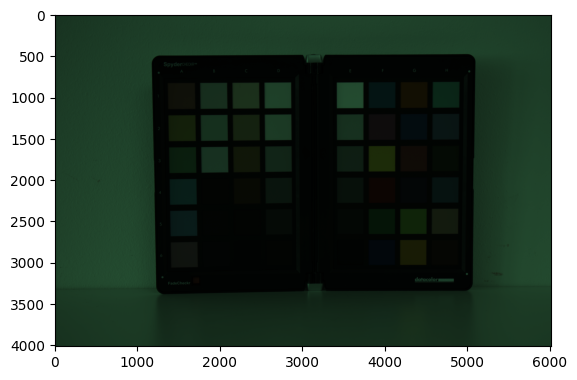

In [305]:
file_raw_0003i = ["data", "Indoor", "SPD32", "INDIGO_2022-05-25_NikonD5600_0003.NEF"]
path_raw_0003i = os.path.join(*file_raw_0003i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "SCK100", "Illuminant": SPD32, "Observer":2}
image_0003i = RawImage(path_raw_0003i, metadata, method="postprocess")

image_0003i.show(method="matplotlib")

RAW RGB data extraction

In [306]:
has_colourchecker, corners, size_rect = image_0003i.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

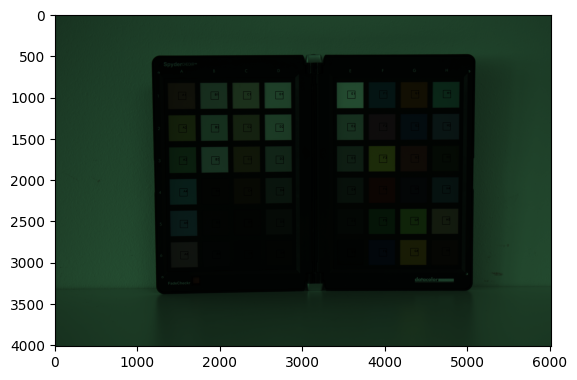

In [307]:
image_0003i.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [308]:
SCK100_RGB_SPD32 = image_0003i.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [309]:
data_sck100_spd32 = pd.merge(SCK100_XYZ_SPD32, SCK100_RGB_SPD32, on="patch_id")
data_sck100_spd32.insert(0, "ColourChecker", "SCK100")
data_sck100_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant SPD32.,35.830058,28.995419,15.087237,MeasuredIlluminant object: Illuminant SPD32.,1015.671314,1079.348535,598.799622
1,SCK100,A2,MeasuredIlluminant object: Illuminant SPD32.,46.786329,48.482780,12.675378,MeasuredIlluminant object: Illuminant SPD32.,1261.167533,2035.443526,685.754253
2,SCK100,A3,MeasuredIlluminant object: Illuminant SPD32.,26.787607,35.988754,16.807137,MeasuredIlluminant object: Illuminant SPD32.,675.692817,1915.438563,898.639887
3,SCK100,A4,MeasuredIlluminant object: Illuminant SPD32.,23.420463,30.541678,35.882907,MeasuredIlluminant object: Illuminant SPD32.,540.016068,1909.392722,1558.465265
4,SCK100,A5,MeasuredIlluminant object: Illuminant SPD32.,25.037484,27.744053,38.856936,MeasuredIlluminant object: Illuminant SPD32.,611.781664,1727.939509,1600.082231
5,SCK100,A6,MeasuredIlluminant object: Illuminant SPD32.,33.380157,27.219020,24.103977,MeasuredIlluminant object: Illuminant SPD32.,1021.208885,1257.028592,971.671314
6,SCK100,B1,MeasuredIlluminant object: Illuminant SPD32.,57.455660,60.097556,44.914615,MeasuredIlluminant object: Illuminant SPD32.,1475.823960,2930.157136,1891.577859
7,SCK100,B2,MeasuredIlluminant object: Illuminant SPD32.,54.605335,60.023463,44.142163,MeasuredIlluminant object: Illuminant SPD32.,1396.196125,3041.806711,1916.720227
8,SCK100,B3,MeasuredIlluminant object: Illuminant SPD32.,56.541714,60.130758,48.672997,MeasuredIlluminant object: Illuminant SPD32.,1499.260043,3139.007325,2112.081758
9,SCK100,B4,MeasuredIlluminant object: Illuminant SPD32.,5.850519,5.830241,4.232656,MeasuredIlluminant object: Illuminant SPD32.,159.930766,276.944943,178.410326


In [310]:
data_spd32.append(data_sck100_spd32)

### WPP

White - E1

In [311]:
patch_max = find_patch_max_value(data_sck100_spd32)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [312]:
data_sck100_spd32 = apply_wpp(data_sck100_spd32, "E1")
data_sck100_spd32

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant SPD32.,0.428021,0.323477,0.222018,MeasuredIlluminant object: Illuminant SPD32.,0.447459,0.226883,0.195124
1,SCK100,A2,MeasuredIlluminant object: Illuminant SPD32.,0.558903,0.540881,0.186526,MeasuredIlluminant object: Illuminant SPD32.,0.555613,0.427857,0.223458
2,SCK100,A3,MeasuredIlluminant object: Illuminant SPD32.,0.320001,0.401496,0.247328,MeasuredIlluminant object: Illuminant SPD32.,0.297680,0.402632,0.292829
3,SCK100,A4,MeasuredIlluminant object: Illuminant SPD32.,0.279778,0.340727,0.528039,MeasuredIlluminant object: Illuminant SPD32.,0.237907,0.401361,0.507838
4,SCK100,A5,MeasuredIlluminant object: Illuminant SPD32.,0.299094,0.309517,0.571804,MeasuredIlluminant object: Illuminant SPD32.,0.269523,0.363219,0.521399
5,SCK100,A6,MeasuredIlluminant object: Illuminant SPD32.,0.398755,0.303659,0.354705,MeasuredIlluminant object: Illuminant SPD32.,0.449898,0.264232,0.316627
6,SCK100,B1,MeasuredIlluminant object: Illuminant SPD32.,0.686357,0.670457,0.660947,MeasuredIlluminant object: Illuminant SPD32.,0.650181,0.615929,0.616385
7,SCK100,B2,MeasuredIlluminant object: Illuminant SPD32.,0.652308,0.669630,0.649580,MeasuredIlluminant object: Illuminant SPD32.,0.615101,0.639398,0.624578
8,SCK100,B3,MeasuredIlluminant object: Illuminant SPD32.,0.675439,0.670827,0.716254,MeasuredIlluminant object: Illuminant SPD32.,0.660506,0.659830,0.688238
9,SCK100,B4,MeasuredIlluminant object: Illuminant SPD32.,0.069889,0.065043,0.062286,MeasuredIlluminant object: Illuminant SPD32.,0.070458,0.058215,0.058136


In [313]:
data_sck100_spd32.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.353446,0.340781,0.304750,0.361642,0.321755,0.302225
std,0.251149,0.249456,0.249931,0.258227,0.238658,0.238612
min,0.046995,0.047122,0.048523,0.043074,0.042392,0.043021
25%,0.136063,0.136322,0.084449,0.121696,0.119673,0.097194
50%,0.309548,0.294331,0.234673,0.300487,0.279693,0.234790
75%,0.518980,0.494889,0.462455,0.543925,0.459471,0.435082
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [314]:
data_wpp_spd32.append(data_sck100_spd32)

## Merge data

In [315]:
data_pd_spd32 = pd.concat(data_spd32, ignore_index=True)

data_pd_spd32 = data_pd_spd32.drop(columns="illuminant_y")
data_pd_spd32 = data_pd_spd32.rename(columns={"illuminant_x":"illuminant"})
data_pd_spd32["illuminant"] = "SPD32" # as str to avoid error
data_pd_spd32

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,SPD32,16.268791,10.740402,10.965548,489.128561,381.420745,367.101534
1,CCDSG,B3,SPD32,37.385538,32.525748,35.753355,1044.653397,1604.747261,1394.165084
2,CCDSG,B4,SPD32,14.164829,9.560519,19.380163,368.083272,438.312637,627.596056
3,CCDSG,B5,SPD32,17.235838,21.006411,42.872054,343.335281,1512.040906,1748.531045
4,CCDSG,B6,SPD32,22.901358,31.595065,40.623825,515.319942,2118.242148,1827.893353
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,SPD32,23.700636,23.603217,31.737655,612.522684,1366.419187,1284.394612
212,SCK100,H3,SPD32,10.388623,13.174968,5.178507,268.181002,663.507325,263.905009
213,SCK100,H4,SPD32,16.533287,18.741335,24.614401,405.255907,1173.733696,1043.675803
214,SCK100,H5,SPD32,37.535684,34.765251,18.093299,1225.793478,1708.706285,936.418951


In [316]:
data_pd_wpp_spd32 = pd.concat(data_wpp_spd32, ignore_index=True)

data_pd_wpp_spd32 = data_pd_wpp_spd32.drop(columns="illuminant_y")
data_pd_wpp_spd32 = data_pd_wpp_spd32.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_spd32["illuminant"] = "SPD32" # as str to avoid error
data_pd_wpp_spd32

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,SPD32,0.192085,0.118150,0.159627,0.210037,0.078027,0.117232
1,CCDSG,B3,SPD32,0.441410,0.357800,0.520467,0.448586,0.328284,0.445221
2,CCDSG,B4,SPD32,0.167244,0.105171,0.282120,0.158059,0.089666,0.200420
3,CCDSG,B5,SPD32,0.203503,0.231081,0.624095,0.147432,0.309319,0.558386
4,CCDSG,B6,SPD32,0.270396,0.347562,0.591367,0.221284,0.433330,0.583730
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,SPD32,0.283124,0.263321,0.467039,0.269850,0.287226,0.418530
212,SCK100,H3,SPD32,0.124101,0.146982,0.076205,0.118148,0.139471,0.085996
213,SCK100,H4,SPD32,0.197504,0.209081,0.362216,0.178537,0.246723,0.340090
214,SCK100,H5,SPD32,0.448396,0.387846,0.266254,0.540029,0.359176,0.305139


## SPD33

In [317]:
data_spd33 = []
data_wpp_spd33 = []

| Image                                 |  Illuminant  | ColourChecker                         | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-05-25_NikonD5600_0015.NEF | SPD33-3064ºK | CCDSG  - Calibrite DIGITAL SG        | 140     |
| INDIGO_2022-05-25_NikonD5600_0014.NEF | SPD33-3064ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-05-25_NikonD5600_0017.NEF | SPD33-3064ºK | CCPPV - Calibrite PASSPORT VIDEO     | 24      |
| INDIGO_2022-05-25_NikonD5600_0018.NEF | SPD33-3064ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-05-25_NikonD5600_0016.NEF | SPD33-3064ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/SPD33/INDIGO_2022-05-25_NikonD5600_0015.jpg" width="400">
<img src="res/screenshot/SPD33/INDIGO_2022-05-25_NikonD5600_0014.jpg" width="400">
<img src="res/screenshot/SPD33/INDIGO_2022-05-25_NikonD5600_0017.jpg" width="400">
<img src="res/screenshot/SPD33/INDIGO_2022-05-25_NikonD5600_0018.jpg" width="400">
<img src="res/screenshot/SPD33/INDIGO_2022-05-25_NikonD5600_0016.jpg" width="400">


## SPD Illuminant

SPD33

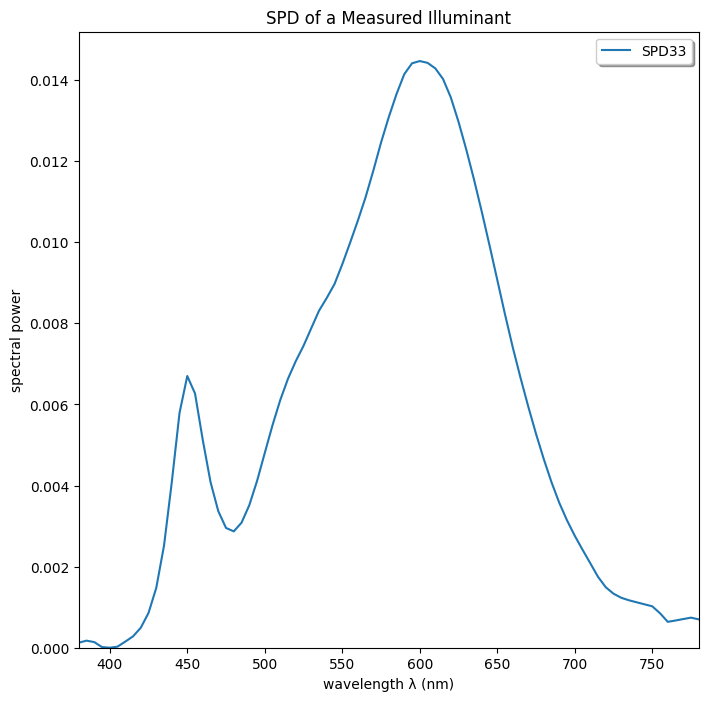

In [318]:
file_spd = ["res", "spd", "INDIGO-C7000-A_033_02°_3064K.csv"]
path_spd = os.path.join(*file_spd)

SPD33 = MeasuredIlluminant(illuminant_name="SPD33", path_file=path_spd)

SPD33.plot()

XYZ data (under JNA)

In [319]:
CCDSG_XYZ_SPD33 = CCDSG.to_ColourCheckerXYZ(illuminant=SPD33, observer=2).as_pandas_dataframe()

In [320]:
CCC_XYZ_SPD33 = CCC.to_ColourCheckerXYZ(illuminant=SPD33, observer=2).as_pandas_dataframe()

In [321]:
CCPPV_XYZ_SPD33 = CCPPV.to_ColourCheckerXYZ(illuminant=SPD33, observer=2).as_pandas_dataframe()

In [322]:
XRCCPP_XYZ_SPD33 = XRCCPP.to_ColourCheckerXYZ(illuminant=SPD33, observer=2).as_pandas_dataframe()

In [323]:
SCK100_XYZ_SPD33 = SCK100.to_ColourCheckerXYZ(illuminant=SPD33, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

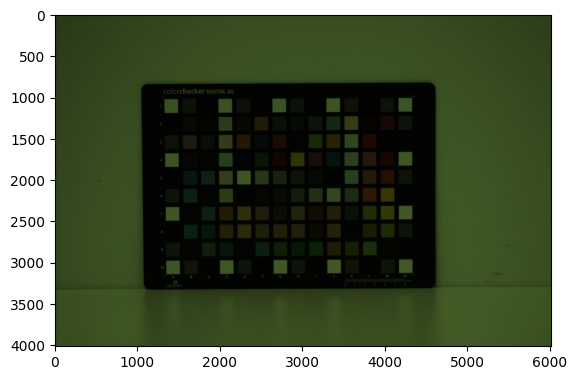

In [324]:
file_raw_0015i = ["data", "Indoor", "SPD33", "INDIGO_2022-05-25_NikonD5600_0015.NEF"]
path_raw_0015i= os.path.join(*file_raw_0015i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "CCDSG", "Illuminant": SPD33, "Observer":2}
image_0015i = RawImage(path_raw_0015i, metadata, method="postprocess")

image_0015i.show(method="matplotlib")

RAW RGB data extraction

In [325]:
has_colourchecker, corners, size_rect = image_0015i.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

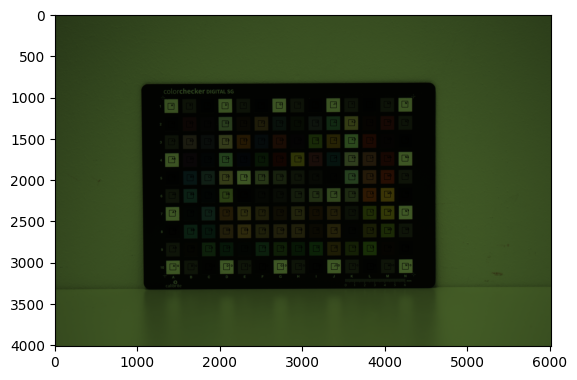

In [326]:
image_0015i.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [327]:
CCDSG_RGB_SPD33 = image_0015i.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [328]:
data_ccdsg_spd33 = pd.merge(CCDSG_XYZ_SPD33, CCDSG_RGB_SPD33, on="patch_id")
data_ccdsg_spd33.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant SPD33.,96.771929,90.822122,35.034660,MeasuredIlluminant object: Illuminant SPD33.,3671.414354,5112.947955,2195.819028
1,CCDSG,A2,MeasuredIlluminant object: Illuminant SPD33.,4.697012,4.393165,1.723795,MeasuredIlluminant object: Illuminant SPD33.,119.197224,161.552593,72.329072
2,CCDSG,A3,MeasuredIlluminant object: Illuminant SPD33.,23.558895,22.125842,8.642089,MeasuredIlluminant object: Illuminant SPD33.,870.909058,1215.164719,525.277210
3,CCDSG,A4,MeasuredIlluminant object: Illuminant SPD33.,95.624847,89.752295,34.688599,MeasuredIlluminant object: Illuminant SPD33.,3865.872169,5373.886048,2308.399196
4,CCDSG,A5,MeasuredIlluminant object: Illuminant SPD33.,4.679189,4.377760,1.719666,MeasuredIlluminant object: Illuminant SPD33.,123.833455,167.525566,74.707451
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant SPD33.,4.675043,4.374296,1.718205,MeasuredIlluminant object: Illuminant SPD33.,127.756757,169.596056,74.408327
136,CCDSG,N7,MeasuredIlluminant object: Illuminant SPD33.,96.145692,90.237840,34.865102,MeasuredIlluminant object: Illuminant SPD33.,4107.861760,5692.922571,2445.530679
137,CCDSG,N8,MeasuredIlluminant object: Illuminant SPD33.,23.628391,22.187451,8.653108,MeasuredIlluminant object: Illuminant SPD33.,958.238495,1327.655953,572.528488
138,CCDSG,N9,MeasuredIlluminant object: Illuminant SPD33.,4.648427,4.347817,1.703217,MeasuredIlluminant object: Illuminant SPD33.,151.260044,202.357195,88.276844


In [329]:
data_ccdsg_spd33 = data_ccdsg_spd33[(data_ccdsg_spd33["patch_id"].str.contains("1")==False) & (data_ccdsg_spd33["patch_id"].str.contains("0")==False) & (data_ccdsg_spd33["patch_id"].str.contains("0")==False) & (data_ccdsg_spd33["patch_id"].str.contains("A")==False) & (data_ccdsg_spd33["patch_id"].str.contains("N")==False)]
data_ccdsg_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant SPD33.,19.147955,11.916876,5.501931,MeasuredIlluminant object: Illuminant SPD33.,811.899196,415.936267,264.238313
12,CCDSG,B3,MeasuredIlluminant object: Illuminant SPD33.,42.878052,33.678849,18.183212,MeasuredIlluminant object: Illuminant SPD33.,1783.627465,1772.069759,1037.536158
13,CCDSG,B4,MeasuredIlluminant object: Illuminant SPD33.,15.259572,10.006759,9.821045,MeasuredIlluminant object: Illuminant SPD33.,589.905771,434.672389,456.947407
14,CCDSG,B5,MeasuredIlluminant object: Illuminant SPD33.,15.702739,17.515753,22.066762,MeasuredIlluminant object: Illuminant SPD33.,470.923302,1381.571950,1266.055515
15,CCDSG,B6,MeasuredIlluminant object: Illuminant SPD33.,22.630767,27.337169,20.627042,MeasuredIlluminant object: Illuminant SPD33.,760.954346,2073.843316,1334.413440
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant SPD33.,47.799823,28.146927,2.929268,MeasuredIlluminant object: Illuminant SPD33.,2464.533966,925.006209,204.776479
125,CCDSG,M6,MeasuredIlluminant object: Illuminant SPD33.,83.719461,69.106289,4.022641,MeasuredIlluminant object: Illuminant SPD33.,3766.892257,3408.744339,450.472973
126,CCDSG,M7,MeasuredIlluminant object: Illuminant SPD33.,74.267737,67.161276,3.349209,MeasuredIlluminant object: Illuminant SPD33.,3276.605551,3624.635500,456.963112
127,CCDSG,M8,MeasuredIlluminant object: Illuminant SPD33.,44.561231,46.366025,3.443039,MeasuredIlluminant object: Illuminant SPD33.,1800.759679,2734.371074,417.566107


In [330]:
data_spd33.append(data_ccdsg_spd33)

### WPP

White - E5

In [331]:
patch_max = find_patch_max_value(data_ccdsg_spd33)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [332]:
data_ccdsg_spd33 = apply_wpp(data_ccdsg_spd33, "E5")
data_ccdsg_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant SPD33.,0.197731,0.131137,0.157114,MeasuredIlluminant object: Illuminant SPD33.,0.203802,0.075176,0.111499
12,CCDSG,B3,MeasuredIlluminant object: Illuminant SPD33.,0.442779,0.370612,0.519241,MeasuredIlluminant object: Illuminant SPD33.,0.447725,0.320281,0.437801
13,CCDSG,B4,MeasuredIlluminant object: Illuminant SPD33.,0.157577,0.110117,0.280450,MeasuredIlluminant object: Illuminant SPD33.,0.148078,0.078562,0.192815
14,CCDSG,B5,MeasuredIlluminant object: Illuminant SPD33.,0.162154,0.192748,0.630140,MeasuredIlluminant object: Illuminant SPD33.,0.118211,0.249703,0.534228
15,CCDSG,B6,MeasuredIlluminant object: Illuminant SPD33.,0.233696,0.300826,0.589027,MeasuredIlluminant object: Illuminant SPD33.,0.191014,0.374823,0.563072
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant SPD33.,0.493603,0.309737,0.083648,MeasuredIlluminant object: Illuminant SPD33.,0.618646,0.167184,0.086408
125,CCDSG,M6,MeasuredIlluminant object: Illuminant SPD33.,0.864526,0.760466,0.114871,MeasuredIlluminant object: Illuminant SPD33.,0.945563,0.616092,0.190083
126,CCDSG,M7,MeasuredIlluminant object: Illuminant SPD33.,0.766923,0.739062,0.095640,MeasuredIlluminant object: Illuminant SPD33.,0.822491,0.655111,0.192821
127,CCDSG,M8,MeasuredIlluminant object: Illuminant SPD33.,0.460160,0.510225,0.098320,MeasuredIlluminant object: Illuminant SPD33.,0.452025,0.494206,0.176197


In [333]:
data_ccdsg_spd33.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.368376,0.351626,0.285903,0.372415,0.324314,0.286158
std,0.239204,0.228585,0.234994,0.258386,0.227331,0.227435
min,0.048201,0.048052,0.048957,0.030315,0.029148,0.029981
25%,0.157432,0.158606,0.098779,0.138773,0.126222,0.108893
50%,0.332538,0.325388,0.210460,0.351040,0.316446,0.212985
75%,0.512004,0.466878,0.414156,0.555635,0.429607,0.374915
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [334]:
data_wpp_spd33.append(data_ccdsg_spd33)

### CCC

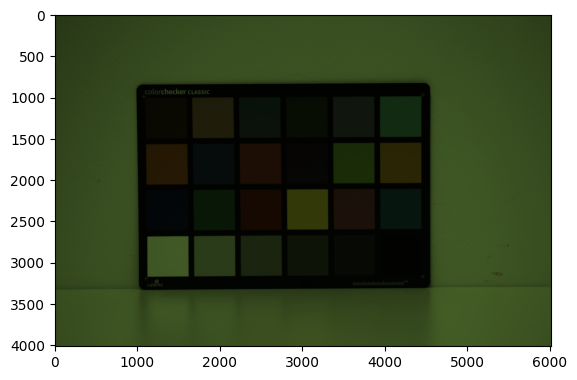

In [335]:
file_raw_0014i = ["data", "Indoor", "SPD33", "INDIGO_2022-05-25_NikonD5600_0014.NEF"]
path_raw_0014i = os.path.join(*file_raw_0014i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "CCC", "Illuminant": SPD33, "Observer":2}
image_0014i = RawImage(path_raw_0014i, metadata, method="postprocess")

image_0014i.show(method="matplotlib")

RAW RGB data extraction

In [336]:
has_colourchecker, corners, size_rect = image_0014i.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT")

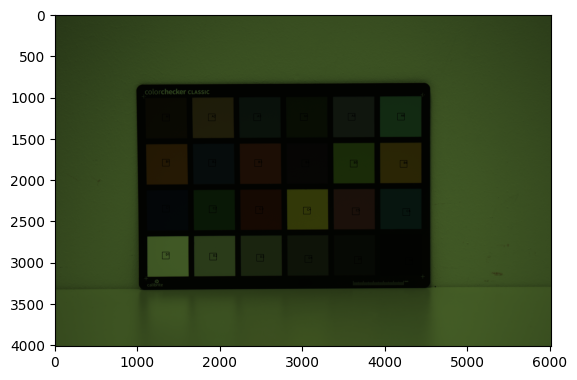

In [337]:
image_0014i.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [338]:
CCC_RGB_SPD33 = image_0014i.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [339]:
data_ccc_spd33 = pd.merge(CCC_XYZ_SPD33, CCC_RGB_SPD33, on="patch_id")
data_ccc_spd33.insert(0, "ColourChecker", "CCC")
data_ccc_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant SPD33.,14.810069,11.957376,2.658178,MeasuredIlluminant object: Illuminant SPD33.,624.270408,585.496032,187.286848
1,CCC,A2,MeasuredIlluminant object: Illuminant SPD33.,46.672205,37.508726,9.330850,MeasuredIlluminant object: Illuminant SPD33.,1990.936224,1847.981293,652.071429
2,CCC,A3,MeasuredIlluminant object: Illuminant SPD33.,18.037622,17.937216,13.055637,MeasuredIlluminant object: Illuminant SPD33.,645.943594,1157.231293,736.613379
3,CCC,A4,MeasuredIlluminant object: Illuminant SPD33.,13.202651,14.033512,2.718351,MeasuredIlluminant object: Illuminant SPD33.,517.358844,848.776077,232.280612
4,CCC,A5,MeasuredIlluminant object: Illuminant SPD33.,26.115610,22.955868,16.562618,MeasuredIlluminant object: Illuminant SPD33.,1058.587868,1455.466270,948.876701
5,CCC,A6,MeasuredIlluminant object: Illuminant SPD33.,33.480277,40.006290,17.034544,MeasuredIlluminant object: Illuminant SPD33.,1199.573980,2730.077664,1190.619898
6,CCC,B1,MeasuredIlluminant object: Illuminant SPD33.,52.097422,37.918023,2.551375,MeasuredIlluminant object: Illuminant SPD33.,2362.120181,1604.342971,258.721939
7,CCC,B2,MeasuredIlluminant object: Illuminant SPD33.,11.518384,10.484846,14.825391,MeasuredIlluminant object: Illuminant SPD33.,416.833900,804.559524,784.353175
8,CCC,B3,MeasuredIlluminant object: Illuminant SPD33.,37.297774,23.402077,5.003963,MeasuredIlluminant object: Illuminant SPD33.,1830.245748,946.126842,336.066185
9,CCC,B4,MeasuredIlluminant object: Illuminant SPD33.,9.121436,6.654526,5.340620,MeasuredIlluminant object: Illuminant SPD33.,394.750567,384.566327,285.114512


In [340]:
data_spd33.append(data_ccc_spd33)

### WPP

White - D1

In [341]:
patch_max = find_patch_max_value(data_ccc_spd33)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [342]:
data_ccc_spd33 = apply_wpp(data_ccc_spd33, "D1")
data_ccc_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant SPD33.,0.150917,0.129814,0.075008,MeasuredIlluminant object: Illuminant SPD33.,0.152150,0.103607,0.078541
1,CCC,A2,MeasuredIlluminant object: Illuminant SPD33.,0.475598,0.407209,0.263295,MeasuredIlluminant object: Illuminant SPD33.,0.485239,0.327013,0.273455
2,CCC,A3,MeasuredIlluminant object: Illuminant SPD33.,0.183806,0.194733,0.368401,MeasuredIlluminant object: Illuminant SPD33.,0.157432,0.204780,0.308909
3,CCC,A4,MeasuredIlluminant object: Illuminant SPD33.,0.134537,0.152353,0.076706,MeasuredIlluminant object: Illuminant SPD33.,0.126093,0.150197,0.097410
4,CCC,A5,MeasuredIlluminant object: Illuminant SPD33.,0.266123,0.249218,0.467360,MeasuredIlluminant object: Illuminant SPD33.,0.258003,0.257554,0.397924
5,CCC,A6,MeasuredIlluminant object: Illuminant SPD33.,0.341170,0.434324,0.480676,MeasuredIlluminant object: Illuminant SPD33.,0.292365,0.483105,0.499303
6,CCC,B1,MeasuredIlluminant object: Illuminant SPD33.,0.530882,0.411653,0.071994,MeasuredIlluminant object: Illuminant SPD33.,0.575706,0.283899,0.108499
7,CCC,B2,MeasuredIlluminant object: Illuminant SPD33.,0.117374,0.113828,0.418339,MeasuredIlluminant object: Illuminant SPD33.,0.101592,0.142372,0.328929
8,CCC,B3,MeasuredIlluminant object: Illuminant SPD33.,0.380071,0.254062,0.141200,MeasuredIlluminant object: Illuminant SPD33.,0.446075,0.167423,0.140934
9,CCC,B4,MeasuredIlluminant object: Illuminant SPD33.,0.092949,0.072244,0.150700,MeasuredIlluminant object: Illuminant SPD33.,0.096210,0.068052,0.119567


In [343]:
data_ccc_spd33.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.329454,0.313164,0.272233,0.336852,0.296484,0.275687
std,0.245144,0.238870,0.232168,0.256997,0.231297,0.218722
min,0.036863,0.036939,0.038541,0.042882,0.042977,0.044878
25%,0.133729,0.146718,0.103664,0.122665,0.133586,0.117435
50%,0.272378,0.244542,0.187722,0.275184,0.235352,0.227361
75%,0.442420,0.417321,0.419196,0.455866,0.420358,0.346178
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [344]:
data_wpp_spd33.append(data_ccc_spd33)

### CCPPV

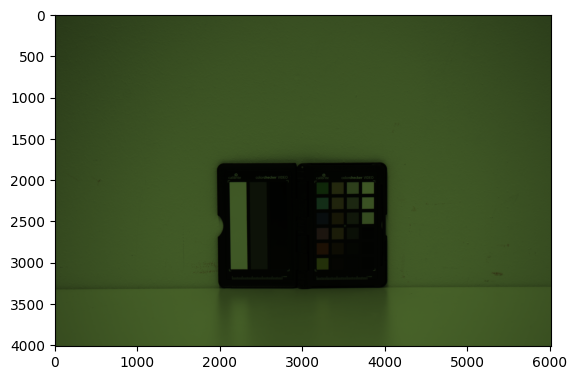

In [345]:
file_raw_0017i = ["data", "Indoor", "SPD33", "INDIGO_2022-05-25_NikonD5600_0017.NEF"]
path_raw_0017i = os.path.join(*file_raw_0017i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "CCPPV", "Illuminant": SPD33, "Observer":2}
image_0017i = RawImage(path_raw_0017i, metadata, method="postprocess")

image_0017i.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0017i.automatic_colourchecker_extraction(checker_name="CCPPV_24", opencv_descriptor="SIFT") # Fails

In [346]:
corners = {"TopLeft":[3140.39,3102.73], "TopRight":[3137.05,2016.71], "BottomRight":[3865.74,2016.71], "BottomLeft":[3865.74,3102.73]}
image_0017i.extract_colourchecker_rgb_patches(checker_name="CCPPV_24", corners=corners, size_rect=40)

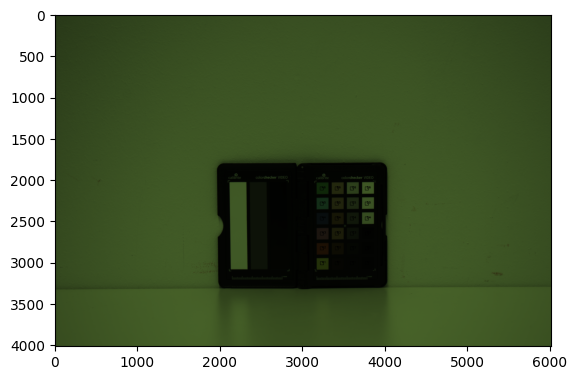

In [347]:
image_0017i.show_colourchecker(checker_name="CCPPV", show_image=True, method="matplotlib")

In [348]:
CCPPV_RGB_SPD33 = image_0017i.get_ColourCheckerRGB("CCPPV").as_pandas_dataframe()

In [349]:
data_ccppv_spd33 = pd.merge(CCPPV_XYZ_SPD33, CCPPV_RGB_SPD33, on="patch_id")
data_ccppv_spd33.insert(0, "ColourChecker", "CCPPV")
data_ccppv_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant SPD33.,40.961836,40.324934,4.904443,MeasuredIlluminant object: Illuminant SPD33.,2294.210000,3121.937500,644.435000
1,CCPPV,A2,MeasuredIlluminant object: Illuminant SPD33.,29.571276,19.892247,3.888537,MeasuredIlluminant object: Illuminant SPD33.,1826.637500,1040.695000,317.360000
2,CCPPV,A3,MeasuredIlluminant object: Illuminant SPD33.,27.070143,18.717404,12.611240,MeasuredIlluminant object: Illuminant SPD33.,1800.316250,1386.193750,1014.896250
3,CCPPV,A4,MeasuredIlluminant object: Illuminant SPD33.,10.297661,8.867585,11.361606,MeasuredIlluminant object: Illuminant SPD33.,533.865000,885.645000,909.164375
4,CCPPV,A5,MeasuredIlluminant object: Illuminant SPD33.,22.821324,26.756290,14.350746,MeasuredIlluminant object: Illuminant SPD33.,1251.603750,2953.781250,1532.339375
5,CCPPV,A6,MeasuredIlluminant object: Illuminant SPD33.,24.612109,32.225573,5.578524,MeasuredIlluminant object: Illuminant SPD33.,997.405000,2516.575000,632.802500
6,CCPPV,B1,MeasuredIlluminant object: Illuminant SPD33.,7.161217,6.180061,1.621409,MeasuredIlluminant object: Illuminant SPD33.,347.033750,381.461250,132.325000
7,CCPPV,B2,MeasuredIlluminant object: Illuminant SPD33.,15.655555,12.801340,2.713688,MeasuredIlluminant object: Illuminant SPD33.,887.897500,816.682500,242.058750
8,CCPPV,B3,MeasuredIlluminant object: Illuminant SPD33.,27.693774,23.668897,6.065341,MeasuredIlluminant object: Illuminant SPD33.,1770.925625,1860.346250,624.553125
9,CCPPV,B4,MeasuredIlluminant object: Illuminant SPD33.,24.423405,20.379588,4.572725,MeasuredIlluminant object: Illuminant SPD33.,1462.007500,1430.558750,440.776250


In [350]:
data_spd33.append(data_ccppv_spd33)

### WPP

White - D6

In [351]:
patch_max = find_patch_max_value(data_ccppv_spd33)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D6', 'D6', 'D6']
['D6', 'D6', 'D6']


In [352]:
data_ccppv_spd33 = apply_wpp(data_ccppv_spd33, "D6")
data_ccppv_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant SPD33.,0.491562,0.515226,0.163607,MeasuredIlluminant object: Illuminant SPD33.,0.566850,0.556362,0.268271
1,CCPPV,A2,MeasuredIlluminant object: Illuminant SPD33.,0.354870,0.254161,0.129718,MeasuredIlluminant object: Illuminant SPD33.,0.451322,0.185463,0.132114
2,CCPPV,A3,MeasuredIlluminant object: Illuminant SPD33.,0.324855,0.239150,0.420698,MeasuredIlluminant object: Illuminant SPD33.,0.444819,0.247034,0.422491
3,CCPPV,A4,MeasuredIlluminant object: Illuminant SPD33.,0.123577,0.113300,0.379011,MeasuredIlluminant object: Illuminant SPD33.,0.131906,0.157831,0.378475
4,CCPPV,A5,MeasuredIlluminant object: Illuminant SPD33.,0.273867,0.341862,0.478726,MeasuredIlluminant object: Illuminant SPD33.,0.309244,0.526395,0.637897
5,CCPPV,A6,MeasuredIlluminant object: Illuminant SPD33.,0.295357,0.411742,0.186094,MeasuredIlluminant object: Illuminant SPD33.,0.246437,0.448480,0.263429
6,CCPPV,B1,MeasuredIlluminant object: Illuminant SPD33.,0.085938,0.078962,0.054088,MeasuredIlluminant object: Illuminant SPD33.,0.085745,0.067980,0.055085
7,CCPPV,B2,MeasuredIlluminant object: Illuminant SPD33.,0.187874,0.163561,0.090526,MeasuredIlluminant object: Illuminant SPD33.,0.219380,0.145542,0.100766
8,CCPPV,B3,MeasuredIlluminant object: Illuminant SPD33.,0.332339,0.302414,0.202333,MeasuredIlluminant object: Illuminant SPD33.,0.437557,0.331533,0.259995
9,CCPPV,B4,MeasuredIlluminant object: Illuminant SPD33.,0.293093,0.260387,0.152541,MeasuredIlluminant object: Illuminant SPD33.,0.361230,0.254941,0.183490


In [353]:
data_ccppv_spd33.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.350225,0.343686,0.321529,0.374800,0.353132,0.341931
std,0.291213,0.293399,0.304863,0.290266,0.293396,0.298986
min,0.037894,0.037986,0.039908,0.037345,0.037352,0.039431
25%,0.114167,0.104715,0.088692,0.120366,0.127423,0.094595
50%,0.294225,0.257274,0.194214,0.335237,0.263860,0.265850
75%,0.473067,0.442203,0.423720,0.534444,0.477969,0.433451
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [354]:
data_wpp_spd33.append(data_ccppv_spd33)

### XRCCPP

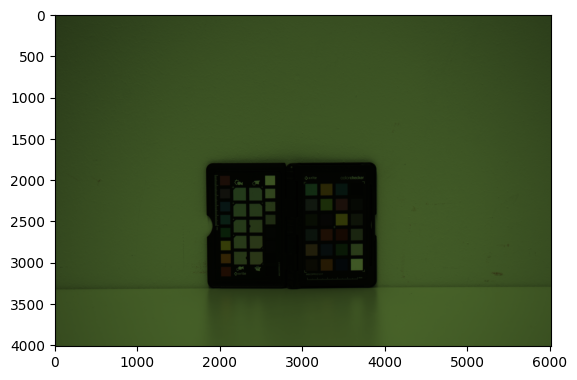

In [355]:
file_raw_0018i = ["data", "Indoor", "SPD33", "INDIGO_2022-05-25_NikonD5600_0018.NEF"]
path_raw_0018i = os.path.join(*file_raw_0018i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "XRCCPP", "Illuminant": SPD33, "Observer":2}
image_0018i = RawImage(path_raw_0018i, metadata, method="postprocess")

image_0018i.show(method="matplotlib")

RAW RGB data extraction

In [356]:
has_colourchecker, corners, size_rect = image_0018i.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

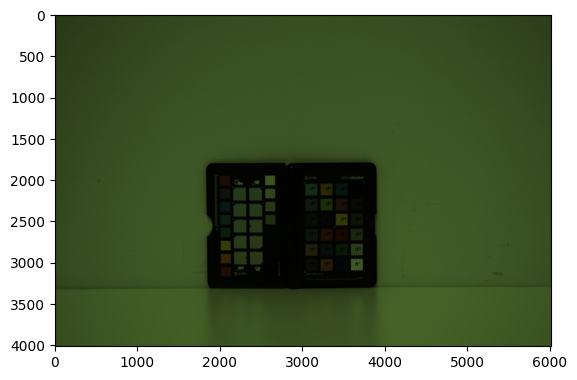

In [357]:
image_0018i.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [358]:
XRCCPP_RGB_SPD33 = image_0018i.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [359]:
data_xrccpp_spd33 = pd.merge(XRCCPP_XYZ_SPD33, XRCCPP_RGB_SPD33, on="patch_id")
data_xrccpp_spd33.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant SPD33.,14.195419,11.543488,2.605551,MeasuredIlluminant object: Illuminant SPD33.,673.711538,647.994083,215.389053
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant SPD33.,44.756082,35.574373,8.797672,MeasuredIlluminant object: Illuminant SPD33.,2173.636095,1988.319527,724.115385
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant SPD33.,15.985468,15.872967,11.448365,MeasuredIlluminant object: Illuminant SPD33.,723.997041,1280.801775,813.695266
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant SPD33.,12.060562,12.767522,2.585386,MeasuredIlluminant object: Illuminant SPD33.,549.550296,891.071006,254.798817
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant SPD33.,22.662302,20.184526,14.242986,MeasuredIlluminant object: Illuminant SPD33.,1100.550296,1554.677515,1009.056213
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant SPD33.,31.319427,37.783751,16.370447,MeasuredIlluminant object: Illuminant SPD33.,1222.266272,2834.355030,1266.988166
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant SPD33.,48.599054,35.518561,2.470849,MeasuredIlluminant object: Illuminant SPD33.,2432.677515,1668.881657,279.248521
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant SPD33.,11.340106,10.308518,14.234636,MeasuredIlluminant object: Illuminant SPD33.,460.144970,878.053254,854.695266
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant SPD33.,35.563578,22.268140,4.821201,MeasuredIlluminant object: Illuminant SPD33.,1898.195266,975.860947,356.491124
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant SPD33.,8.584028,6.335366,5.056607,MeasuredIlluminant object: Illuminant SPD33.,424.710059,433.062130,321.127219


In [360]:
data_spd33.append(data_xrccpp_spd33)

### WPP

White - D1

In [361]:
patch_max = find_patch_max_value(data_xrccpp_spd33)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [362]:
data_xrccpp_spd33 = apply_wpp(data_xrccpp_spd33, "D1")
data_xrccpp_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant SPD33.,0.165452,0.143288,0.085429,MeasuredIlluminant object: Illuminant SPD33.,0.165528,0.115069,0.089370
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant SPD33.,0.521647,0.441582,0.288451,MeasuredIlluminant object: Illuminant SPD33.,0.534052,0.353079,0.300454
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant SPD33.,0.186316,0.197030,0.375360,MeasuredIlluminant object: Illuminant SPD33.,0.177883,0.227441,0.337623
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant SPD33.,0.140570,0.158482,0.084768,MeasuredIlluminant object: Illuminant SPD33.,0.135022,0.158233,0.105723
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant SPD33.,0.264137,0.250549,0.466987,MeasuredIlluminant object: Illuminant SPD33.,0.270400,0.276074,0.418683
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant SPD33.,0.365039,0.469007,0.536741,MeasuredIlluminant object: Illuminant SPD33.,0.300305,0.503315,0.525706
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant SPD33.,0.566438,0.440889,0.081012,MeasuredIlluminant object: Illuminant SPD33.,0.597697,0.296354,0.115867
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant SPD33.,0.132173,0.127959,0.466714,MeasuredIlluminant object: Illuminant SPD33.,0.113055,0.155922,0.354635
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant SPD33.,0.414506,0.276413,0.158074,MeasuredIlluminant object: Illuminant SPD33.,0.466378,0.173290,0.147917
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant SPD33.,0.100050,0.078640,0.165792,MeasuredIlluminant object: Illuminant SPD33.,0.104349,0.076902,0.133244


In [363]:
data_xrccpp_spd33.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.342548,0.325479,0.286023,0.347322,0.306177,0.286706
std,0.248351,0.241295,0.237739,0.258217,0.231573,0.218993
min,0.041063,0.041292,0.045028,0.043150,0.043932,0.046955
25%,0.140385,0.154684,0.105881,0.129530,0.145709,0.128900
50%,0.279140,0.252422,0.204774,0.285352,0.237413,0.236916
75%,0.461873,0.448438,0.444610,0.483296,0.431267,0.369438
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [364]:
data_wpp_spd33.append(data_xrccpp_spd33)

### SCK100

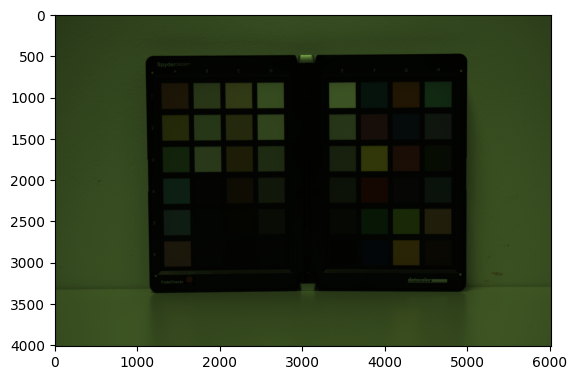

In [365]:
file_raw_0016i = ["data", "Indoor", "SPD33", "INDIGO_2022-05-25_NikonD5600_0016.NEF"]
path_raw_0016i = os.path.join(*file_raw_0016i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "SCK100", "Illuminant": SPD33, "Observer":2}
image_0016i = RawImage(path_raw_0016i, metadata, method="postprocess")

image_0016i.show(method="matplotlib")

RAW RGB data extraction

In [366]:
has_colourchecker, corners, size_rect = image_0016i.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

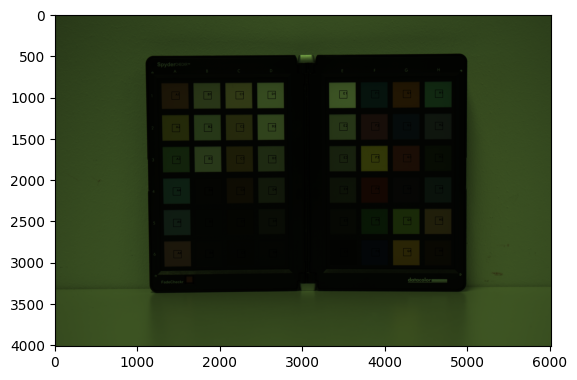

In [367]:
image_0016i.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [368]:
SCK100_RGB_SPD33 = image_0016i.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [369]:
data_sck100_spd33 = pd.merge(SCK100_XYZ_SPD33, SCK100_RGB_SPD33, on="patch_id")
data_sck100_spd33.insert(0, "ColourChecker", "SCK100")
data_sck100_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant SPD33.,44.153180,32.655066,7.612774,MeasuredIlluminant object: Illuminant SPD33.,1811.940690,1403.620510,476.175449
1,SCK100,A2,MeasuredIlluminant object: Illuminant SPD33.,57.042396,51.441862,6.507730,MeasuredIlluminant object: Illuminant SPD33.,2290.600189,2633.697779,579.512051
2,SCK100,A3,MeasuredIlluminant object: Illuminant SPD33.,30.426425,34.388600,8.504729,MeasuredIlluminant object: Illuminant SPD33.,1162.526229,2223.288752,720.653119
3,SCK100,A4,MeasuredIlluminant object: Illuminant SPD33.,24.023500,27.417447,18.238126,MeasuredIlluminant object: Illuminant SPD33.,872.389887,2008.082231,1186.329868
4,SCK100,A5,MeasuredIlluminant object: Illuminant SPD33.,25.958590,25.711313,19.786136,MeasuredIlluminant object: Illuminant SPD33.,1006.930293,1818.426512,1212.643667
5,SCK100,A6,MeasuredIlluminant object: Illuminant SPD33.,39.795146,29.433642,12.189260,MeasuredIlluminant object: Illuminant SPD33.,1800.329868,1493.508388,743.965855
6,SCK100,B1,MeasuredIlluminant object: Illuminant SPD33.,66.105120,60.603505,22.890505,MeasuredIlluminant object: Illuminant SPD33.,2581.831758,3416.281427,1471.723299
7,SCK100,B2,MeasuredIlluminant object: Illuminant SPD33.,62.322916,59.713188,22.457845,MeasuredIlluminant object: Illuminant SPD33.,2441.740548,3552.398866,1494.112949
8,SCK100,B3,MeasuredIlluminant object: Illuminant SPD33.,64.216211,59.873565,24.764963,MeasuredIlluminant object: Illuminant SPD33.,2610.068526,3640.435255,1648.431947
9,SCK100,B4,MeasuredIlluminant object: Illuminant SPD33.,6.800868,5.936760,2.132943,MeasuredIlluminant object: Illuminant SPD33.,283.297023,331.245983,142.070888


In [370]:
data_spd33.append(data_sck100_spd33)

### WPP

White - E1

In [371]:
patch_max = find_patch_max_value(data_sck100_spd33)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [372]:
data_sck100_spd33 = apply_wpp(data_sck100_spd33, "E1")
data_sck100_spd33

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant SPD33.,0.461241,0.364350,0.219900,MeasuredIlluminant object: Illuminant SPD33.,0.475059,0.264773,0.206734
1,SCK100,A2,MeasuredIlluminant object: Illuminant SPD33.,0.595886,0.573964,0.187980,MeasuredIlluminant object: Illuminant SPD33.,0.600555,0.496809,0.251598
2,SCK100,A3,MeasuredIlluminant object: Illuminant SPD33.,0.317846,0.383692,0.245665,MeasuredIlluminant object: Illuminant SPD33.,0.304794,0.419391,0.312875
3,SCK100,A4,MeasuredIlluminant object: Illuminant SPD33.,0.250958,0.305911,0.526820,MeasuredIlluminant object: Illuminant SPD33.,0.228725,0.378796,0.515051
4,SCK100,A5,MeasuredIlluminant object: Illuminant SPD33.,0.271173,0.286875,0.571535,MeasuredIlluminant object: Illuminant SPD33.,0.263999,0.343020,0.526475
5,SCK100,A6,MeasuredIlluminant object: Illuminant SPD33.,0.415715,0.328407,0.352095,MeasuredIlluminant object: Illuminant SPD33.,0.472015,0.281729,0.322996
6,SCK100,B1,MeasuredIlluminant object: Illuminant SPD33.,0.690559,0.676185,0.661207,MeasuredIlluminant object: Illuminant SPD33.,0.676911,0.644432,0.638956
7,SCK100,B2,MeasuredIlluminant object: Illuminant SPD33.,0.651048,0.666252,0.648709,MeasuredIlluminant object: Illuminant SPD33.,0.640182,0.670109,0.648676
8,SCK100,B3,MeasuredIlluminant object: Illuminant SPD33.,0.670826,0.668041,0.715352,MeasuredIlluminant object: Illuminant SPD33.,0.684314,0.686716,0.715675
9,SCK100,B4,MeasuredIlluminant object: Illuminant SPD33.,0.071044,0.066240,0.061611,MeasuredIlluminant object: Illuminant SPD33.,0.074276,0.062485,0.061681


In [373]:
data_sck100_spd33.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.358888,0.345990,0.304446,0.370272,0.335220,0.310842
std,0.259341,0.253637,0.249512,0.268358,0.248275,0.241345
min,0.046778,0.046988,0.048292,0.045764,0.045691,0.046325
25%,0.124764,0.137803,0.085930,0.114955,0.132223,0.099724
50%,0.301257,0.286029,0.232782,0.298779,0.273897,0.243810
75%,0.525939,0.516434,0.458490,0.566978,0.496036,0.428034
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [374]:
data_wpp_spd33.append(data_sck100_spd33)

## Merge data

In [375]:
data_pd_spd33 = pd.concat(data_spd33, ignore_index=True)

data_pd_spd33 = data_pd_spd33.drop(columns="illuminant_y")
data_pd_spd33 = data_pd_spd33.rename(columns={"illuminant_x":"illuminant"})
data_pd_spd33["illuminant"] = "SPD33" # as str to avoid error
data_pd_spd33

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,SPD33,19.147955,11.916876,5.501931,811.899196,415.936267,264.238313
1,CCDSG,B3,SPD33,42.878052,33.678849,18.183212,1783.627465,1772.069759,1037.536158
2,CCDSG,B4,SPD33,15.259572,10.006759,9.821045,589.905771,434.672389,456.947407
3,CCDSG,B5,SPD33,15.702739,17.515753,22.066762,470.923302,1381.571950,1266.055515
4,CCDSG,B6,SPD33,22.630767,27.337169,20.627042,760.954346,2073.843316,1334.413440
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,SPD33,25.440391,22.752045,16.195002,990.971172,1419.642250,942.941871
212,SCK100,H3,SPD33,11.963694,12.913219,2.639714,451.278355,773.493384,213.129962
213,SCK100,H4,SPD33,17.231752,17.484302,12.491969,641.057183,1202.274575,758.429112
214,SCK100,H5,SPD33,45.362678,36.716182,9.041996,2072.528828,1965.924858,694.983459


In [376]:
data_pd_wpp_spd33 = pd.concat(data_wpp_spd33, ignore_index=True)

data_pd_wpp_spd33 = data_pd_wpp_spd33.drop(columns="illuminant_y")
data_pd_wpp_spd33 = data_pd_wpp_spd33.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_spd33["illuminant"] = "SPD33" # as str to avoid error
data_pd_wpp_spd33

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,SPD33,0.197731,0.131137,0.157114,0.203802,0.075176,0.111499
1,CCDSG,B3,SPD33,0.442779,0.370612,0.519241,0.447725,0.320281,0.437801
2,CCDSG,B4,SPD33,0.157577,0.110117,0.280450,0.148078,0.078562,0.192815
3,CCDSG,B5,SPD33,0.162154,0.192748,0.630140,0.118211,0.249703,0.534228
4,CCDSG,B6,SPD33,0.233696,0.300826,0.589027,0.191014,0.374823,0.563072
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,SPD33,0.265760,0.253857,0.467803,0.259815,0.267795,0.409383
212,SCK100,H3,SPD33,0.124977,0.144080,0.076250,0.118317,0.145908,0.092531
213,SCK100,H4,SPD33,0.180009,0.195082,0.360839,0.168074,0.226792,0.329276
214,SCK100,H5,SPD33,0.473875,0.409662,0.261184,0.543381,0.370843,0.301730


## Outdoor

In [377]:
data_spd38 = []
data_wpp_spd38 = []

## SPD38

| Image                                 |  Illuminant  | ColourChecker                         | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-05-26_NikonD5600_0028.NEF | SPD38-5557ºK | CCDSG  - Calibrite DIGITAL SG        | 140     |
| INDIGO_2022-05-26_NikonD5600_0027.NEF | SPD38-5557ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-05-26_NikonD5600_0030.NEF | SPD38-5557ºK | CCPPV - Calibrite PASSPORT VIDEO     | 24      |
| INDIGO_2022-05-26_NikonD5600_0031.NEF | SPD38-5557ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-05-26_NikonD5600_0029.NEF | SPD38-5557ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/SPD38/INDIGO_2022-05-26_NikonD5600_0028.jpg" width="400">
<img src="res/screenshot/SPD38/INDIGO_2022-05-26_NikonD5600_0027.jpg" width="400">
<img src="res/screenshot/SPD38/INDIGO_2022-05-26_NikonD5600_0030.jpg" width="400">
<img src="res/screenshot/SPD38/INDIGO_2022-05-26_NikonD5600_0031.jpg" width="400">
<img src="res/screenshot/SPD38/INDIGO_2022-05-26_NikonD5600_0029.jpg" width="400">


## SPD Illuminant

SPD33

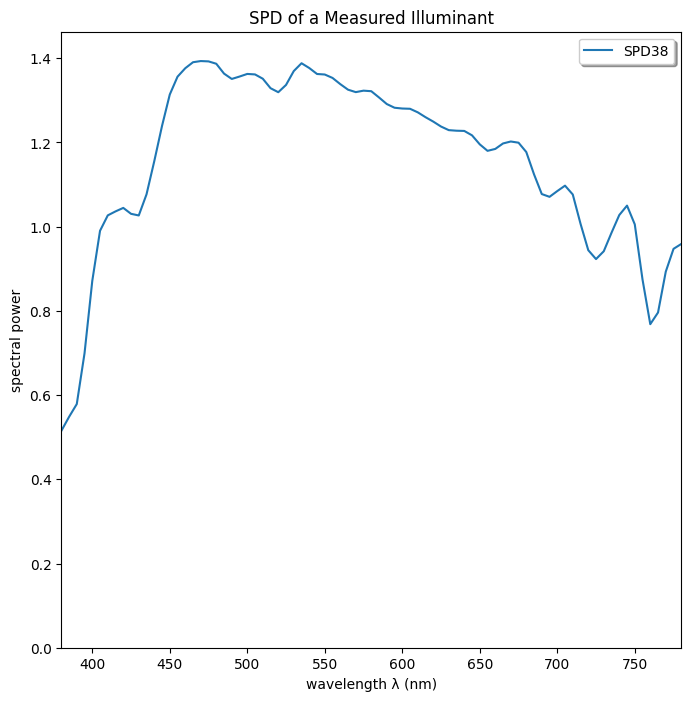

In [378]:
file_spd = ["res", "spd", "INDIGO-C7000-A_038_02°_5557K.csv"]
path_spd = os.path.join(*file_spd)

SPD38 = MeasuredIlluminant(illuminant_name="SPD38", path_file=path_spd)

SPD38.plot()

XYZ data (under JNA)

In [379]:
CCDSG_XYZ_SPD38 = CCDSG.to_ColourCheckerXYZ(illuminant=SPD38, observer=2).as_pandas_dataframe()

In [380]:
CCC_XYZ_SPD38 = CCC.to_ColourCheckerXYZ(illuminant=SPD38, observer=2).as_pandas_dataframe()

In [381]:
CCPPV_XYZ_SPD38 = CCPPV.to_ColourCheckerXYZ(illuminant=SPD38, observer=2).as_pandas_dataframe()

In [382]:
XRCCPP_XYZ_SPD38 = XRCCPP.to_ColourCheckerXYZ(illuminant=SPD38, observer=2).as_pandas_dataframe()

In [383]:
SCK100_XYZ_SPD38 = SCK100.to_ColourCheckerXYZ(illuminant=SPD38, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

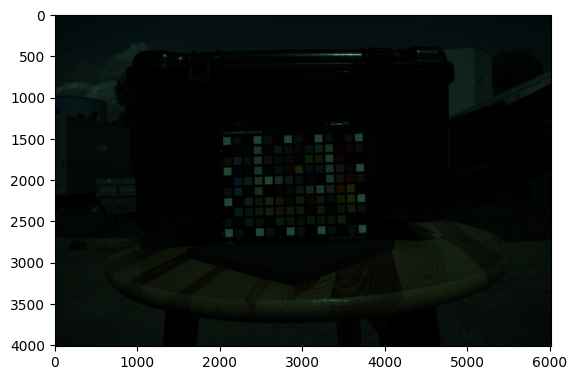

In [384]:
file_raw_0028o = ["data", "Outdoor", "SPD38", "INDIGO_2022-05-26_NikonD5600_0028.NEF"]
path_raw_0028o= os.path.join(*file_raw_0028o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "CCDSG", "Illuminant": SPD38, "Observer":2}
image_0028o = RawImage(path_raw_0028o, metadata, method="postprocess")

image_0028o.show(method="matplotlib")

RAW RGB data extraction

In [385]:
has_colourchecker, corners, size_rect = image_0028o.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

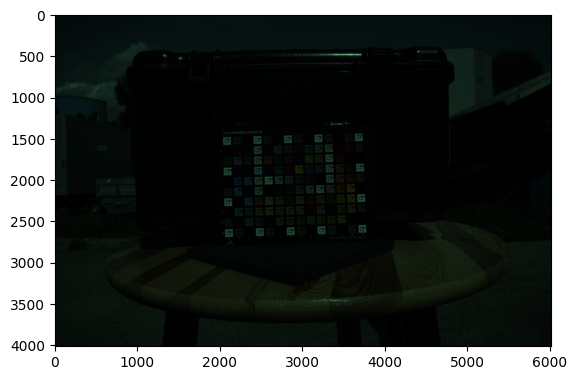

In [386]:
image_0028o.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [387]:
CCDSG_RGB_SPD38 = image_0028o.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [388]:
data_ccdsg_spd38 = pd.merge(CCDSG_XYZ_SPD38, CCDSG_RGB_SPD38, on="patch_id")
data_ccdsg_spd38.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant SPD38.,87.300586,90.859164,85.223169,MeasuredIlluminant object: Illuminant SPD38.,2049.166667,4265.138322,3090.131519
1,CCDSG,A2,MeasuredIlluminant object: Illuminant SPD38.,4.253752,4.393613,4.236990,MeasuredIlluminant object: Illuminant SPD38.,23.882086,46.804989,35.435374
2,CCDSG,A3,MeasuredIlluminant object: Illuminant SPD38.,21.267657,22.091132,21.075288,MeasuredIlluminant object: Illuminant SPD38.,451.670068,933.159864,673.414966
3,CCDSG,A4,MeasuredIlluminant object: Illuminant SPD38.,86.287721,89.800334,84.392373,MeasuredIlluminant object: Illuminant SPD38.,2132.455782,4409.344671,3182.675737
4,CCDSG,A5,MeasuredIlluminant object: Illuminant SPD38.,4.238284,4.378805,4.226200,MeasuredIlluminant object: Illuminant SPD38.,23.209751,44.714286,33.678005
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant SPD38.,4.234712,4.375731,4.223337,MeasuredIlluminant object: Illuminant SPD38.,27.444444,51.396825,38.770975
136,CCDSG,N7,MeasuredIlluminant object: Illuminant SPD38.,86.752339,90.284485,84.802768,MeasuredIlluminant object: Illuminant SPD38.,2254.482993,4609.961451,3303.151927
137,CCDSG,N8,MeasuredIlluminant object: Illuminant SPD38.,21.325868,22.150208,21.100860,MeasuredIlluminant object: Illuminant SPD38.,483.791383,988.345805,707.083900
138,CCDSG,N9,MeasuredIlluminant object: Illuminant SPD38.,4.208917,4.348210,4.186358,MeasuredIlluminant object: Illuminant SPD38.,28.453515,51.920068,36.846372


In [389]:
data_ccdsg_spd38 = data_ccdsg_spd38[(data_ccdsg_spd38["patch_id"].str.contains("1")==False) & (data_ccdsg_spd38["patch_id"].str.contains("0")==False) & (data_ccdsg_spd38["patch_id"].str.contains("0")==False) & (data_ccdsg_spd38["patch_id"].str.contains("A")==False) & (data_ccdsg_spd38["patch_id"].str.contains("N")==False)]
data_ccdsg_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant SPD38.,17.019386,10.871192,14.000805,MeasuredIlluminant object: Illuminant SPD38.,419.321995,260.684807,324.004535
12,CCDSG,B3,MeasuredIlluminant object: Illuminant SPD38.,39.099460,32.775758,44.825191,MeasuredIlluminant object: Illuminant SPD38.,963.489796,1444.982993,1437.141723
13,CCDSG,B4,MeasuredIlluminant object: Illuminant SPD38.,15.293600,9.750916,24.760794,MeasuredIlluminant object: Illuminant SPD38.,299.428571,320.317460,601.519274
14,CCDSG,B5,MeasuredIlluminant object: Illuminant SPD38.,18.983367,21.458387,53.076720,MeasuredIlluminant object: Illuminant SPD38.,285.494898,1379.146259,1795.289116
15,CCDSG,B6,MeasuredIlluminant object: Illuminant SPD38.,24.444401,31.933887,50.187256,MeasuredIlluminant object: Illuminant SPD38.,443.564626,1921.079365,1854.619048
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant SPD38.,37.788664,22.981807,7.227809,MeasuredIlluminant object: Illuminant SPD38.,1258.907029,501.885488,198.866213
125,CCDSG,M6,MeasuredIlluminant object: Illuminant SPD38.,67.116006,60.837795,9.551035,MeasuredIlluminant object: Illuminant SPD38.,1927.399660,2138.036848,434.016440
126,CCDSG,M7,MeasuredIlluminant object: Illuminant SPD38.,60.092033,61.398777,7.500841,MeasuredIlluminant object: Illuminant SPD38.,1677.504535,2335.886621,383.241497
127,CCDSG,M8,MeasuredIlluminant object: Illuminant SPD38.,36.953162,44.348139,7.899924,MeasuredIlluminant object: Illuminant SPD38.,898.053288,1821.998866,375.187075


In [390]:
data_spd38.append(data_ccdsg_spd38)

### WPP

White - E5

In [391]:
patch_max = find_patch_max_value(data_ccdsg_spd38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [392]:
data_ccdsg_spd38 = apply_wpp(data_ccdsg_spd38, "E5")
data_ccdsg_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant SPD38.,0.194845,0.119592,0.164366,MeasuredIlluminant object: Illuminant SPD38.,0.195677,0.058815,0.101226
12,CCDSG,B3,MeasuredIlluminant object: Illuminant SPD38.,0.447627,0.360561,0.526236,MeasuredIlluminant object: Illuminant SPD38.,0.449613,0.326016,0.448994
13,CCDSG,B4,MeasuredIlluminant object: Illuminant SPD38.,0.175087,0.107268,0.290685,MeasuredIlluminant object: Illuminant SPD38.,0.139728,0.072270,0.187927
14,CCDSG,B5,MeasuredIlluminant object: Illuminant SPD38.,0.217329,0.236061,0.623106,MeasuredIlluminant object: Illuminant SPD38.,0.133226,0.311162,0.560886
15,CCDSG,B6,MeasuredIlluminant object: Illuminant SPD38.,0.279850,0.351300,0.589185,MeasuredIlluminant object: Illuminant SPD38.,0.206990,0.433432,0.579422
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant SPD38.,0.432620,0.252820,0.084853,MeasuredIlluminant object: Illuminant SPD38.,0.587469,0.113235,0.062130
125,CCDSG,M6,MeasuredIlluminant object: Illuminant SPD38.,0.768372,0.669268,0.112127,MeasuredIlluminant object: Illuminant SPD38.,0.899422,0.482382,0.135596
126,CCDSG,M7,MeasuredIlluminant object: Illuminant SPD38.,0.687958,0.675439,0.088058,MeasuredIlluminant object: Illuminant SPD38.,0.782808,0.527021,0.119733
127,CCDSG,M8,MeasuredIlluminant object: Illuminant SPD38.,0.423055,0.487867,0.092743,MeasuredIlluminant object: Illuminant SPD38.,0.419077,0.411078,0.117216


In [393]:
data_ccdsg_spd38.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.357907,0.343665,0.286503,0.355821,0.300999,0.267913
std,0.224927,0.221862,0.235864,0.254268,0.226411,0.238141
min,0.048401,0.048049,0.049471,0.011637,0.010643,0.011168
25%,0.163854,0.160395,0.098232,0.128923,0.109272,0.088261
50%,0.332046,0.349066,0.212210,0.339987,0.281231,0.190121
75%,0.469160,0.464864,0.414163,0.533302,0.411250,0.375335
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [394]:
data_wpp_spd38.append(data_ccdsg_spd38)

### CCC

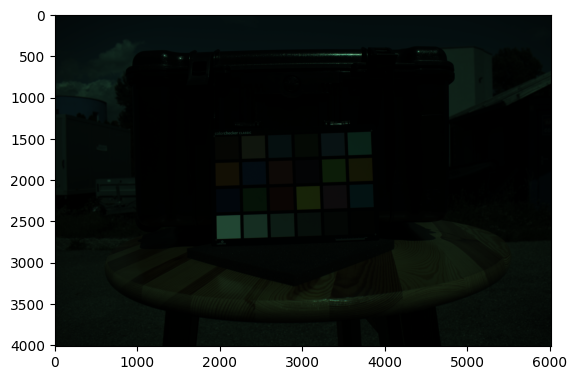

In [395]:
file_raw_0027o = ["data", "Outdoor", "SPD38", "INDIGO_2022-05-26_NikonD5600_0027.NEF"]
path_raw_0027o = os.path.join(*file_raw_0027o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "CCC", "Illuminant": SPD38, "Observer":2}
image_0027o = RawImage(path_raw_0027o, metadata, method="postprocess")

image_0027o.show(method="matplotlib")

RAW RGB data extraction

In [396]:
has_colourchecker, corners, size_rect = image_0027o.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT")

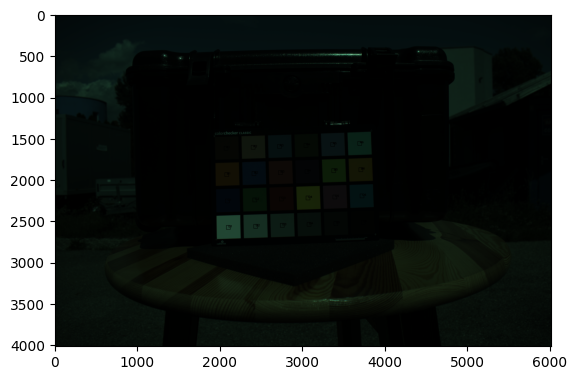

In [397]:
image_0027o.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [398]:
CCC_RGB_SPD38 = image_0027o.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [399]:
data_ccc_spd38 = pd.merge(CCC_XYZ_SPD38, CCC_RGB_SPD38, on="patch_id")
data_ccc_spd38.insert(0, "ColourChecker", "CCC")
data_ccc_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant SPD38.,12.369534,11.020969,6.523938,MeasuredIlluminant object: Illuminant SPD38.,327.192708,433.552083,252.590278
1,CCC,A2,MeasuredIlluminant object: Illuminant SPD38.,39.333099,35.619342,22.849698,MeasuredIlluminant object: Illuminant SPD38.,1019.902778,1393.003472,854.427083
2,CCC,A3,MeasuredIlluminant object: Illuminant SPD38.,18.254646,19.353197,31.651975,MeasuredIlluminant object: Illuminant SPD38.,349.942274,990.345052,995.353733
3,CCC,A4,MeasuredIlluminant object: Illuminant SPD38.,11.508979,14.068016,6.585266,MeasuredIlluminant object: Illuminant SPD38.,262.083333,611.960938,285.359375
4,CCC,A5,MeasuredIlluminant object: Illuminant SPD38.,26.003395,24.310787,40.753356,MeasuredIlluminant object: Illuminant SPD38.,562.753472,1209.669271,1250.904514
5,CCC,A6,MeasuredIlluminant object: Illuminant SPD38.,32.225671,43.617186,41.545436,MeasuredIlluminant object: Illuminant SPD38.,616.455729,2105.093750,1478.574653
6,CCC,B1,MeasuredIlluminant object: Illuminant SPD38.,40.977732,32.096532,6.122255,MeasuredIlluminant object: Illuminant SPD38.,1184.668403,1002.560764,293.826389
7,CCC,B2,MeasuredIlluminant object: Illuminant SPD38.,13.600697,12.006271,36.093387,MeasuredIlluminant object: Illuminant SPD38.,245.965278,769.230903,1104.684028
8,CCC,B3,MeasuredIlluminant object: Illuminant SPD38.,30.263797,20.064841,12.397939,MeasuredIlluminant object: Illuminant SPD38.,882.411458,631.659722,426.788194
9,CCC,B4,MeasuredIlluminant object: Illuminant SPD38.,9.154945,6.766146,13.402739,MeasuredIlluminant object: Illuminant SPD38.,209.631944,310.638889,371.142361


In [400]:
data_spd38.append(data_ccc_spd38)

### WPP

White - D1

In [401]:
patch_max = find_patch_max_value(data_ccc_spd38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [402]:
data_ccc_spd38 = apply_wpp(data_ccc_spd38, "D1")
data_ccc_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant SPD38.,0.139754,0.119620,0.075666,MeasuredIlluminant object: Illuminant SPD38.,0.152105,0.096614,0.077443
1,CCC,A2,MeasuredIlluminant object: Illuminant SPD38.,0.444394,0.386607,0.265015,MeasuredIlluminant object: Illuminant SPD38.,0.474133,0.310420,0.261963
2,CCC,A3,MeasuredIlluminant object: Illuminant SPD38.,0.206245,0.210057,0.367105,MeasuredIlluminant object: Illuminant SPD38.,0.162681,0.220691,0.305170
3,CCC,A4,MeasuredIlluminant object: Illuminant SPD38.,0.130031,0.152692,0.076377,MeasuredIlluminant object: Illuminant SPD38.,0.121837,0.136371,0.087490
4,CCC,A5,MeasuredIlluminant object: Illuminant SPD38.,0.293792,0.263866,0.472665,MeasuredIlluminant object: Illuminant SPD38.,0.261613,0.269565,0.383521
5,CCC,A6,MeasuredIlluminant object: Illuminant SPD38.,0.364092,0.473415,0.481851,MeasuredIlluminant object: Illuminant SPD38.,0.286578,0.469104,0.453324
6,CCC,B1,MeasuredIlluminant object: Illuminant SPD38.,0.462975,0.348371,0.071007,MeasuredIlluminant object: Illuminant SPD38.,0.550729,0.223413,0.090086
7,CCC,B2,MeasuredIlluminant object: Illuminant SPD38.,0.153664,0.130314,0.418617,MeasuredIlluminant object: Illuminant SPD38.,0.114344,0.171417,0.338691
8,CCC,B3,MeasuredIlluminant object: Illuminant SPD38.,0.341927,0.217781,0.143793,MeasuredIlluminant object: Illuminant SPD38.,0.410216,0.140760,0.130851
9,CCC,B4,MeasuredIlluminant object: Illuminant SPD38.,0.103435,0.073439,0.155447,MeasuredIlluminant object: Illuminant SPD38.,0.097454,0.069223,0.113790


In [403]:
data_ccc_spd38.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.322453,0.307607,0.272468,0.318306,0.273465,0.255240
std,0.229086,0.231937,0.233124,0.241820,0.217892,0.219507
min,0.037148,0.037043,0.038933,0.036679,0.036094,0.036556
25%,0.150186,0.142180,0.097203,0.119964,0.126437,0.099277
50%,0.272083,0.222341,0.190531,0.274096,0.222052,0.184753
75%,0.418301,0.426635,0.419191,0.426195,0.330269,0.346997
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [404]:
data_wpp_spd38.append(data_ccc_spd38)

### CCPPV

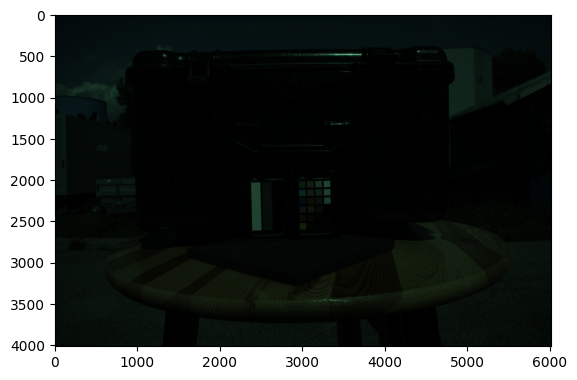

In [405]:
file_raw_0030o = ["data", "Outdoor", "SPD38", "INDIGO_2022-05-26_NikonD5600_0030.NEF"]
path_raw_0030o = os.path.join(*file_raw_0030o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "CCPPV", "Illuminant": SPD38, "Observer":2}
image_0030o = RawImage(path_raw_0030o, metadata, method="postprocess")

image_0030o.show(method="matplotlib")

RAW RGB data extraction

In [ ]:
#has_colourchecker, corners, size_rect = image_0030o.automatic_colourchecker_extraction(checker_name="CCPPV_24", opencv_descriptor="SIFT") # Fails

In [406]:
corners = {"TopLeft":[2945.16,2609.67], "TopRight":[2930.63,2006.73], "BottomRight":[3327.51,1998.19], "BottomLeft":[3343.72,2597.28]}
image_0030o.extract_colourchecker_rgb_patches(checker_name="CCPPV_24", corners=corners, size_rect=40)

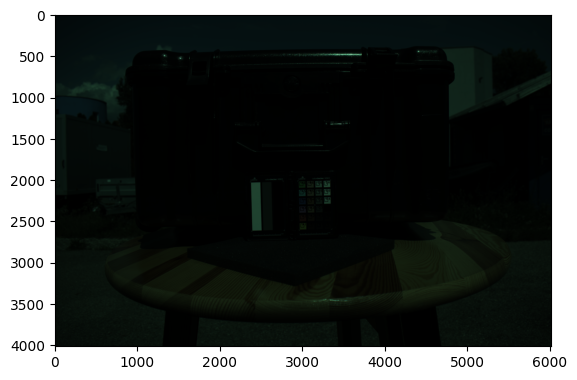

In [407]:
image_0030o.show_colourchecker(checker_name="CCPPV", show_image=True, method="matplotlib")

In [408]:
CCPPV_RGB_SPD38 = image_0030o.get_ColourCheckerRGB("CCPPV").as_pandas_dataframe()

In [409]:
data_ccppv_spd38 = pd.merge(CCPPV_XYZ_SPD38, CCPPV_RGB_SPD38, on="patch_id")
data_ccppv_spd38.insert(0, "ColourChecker", "CCPPV")
data_ccppv_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant SPD38.,34.028818,38.593487,11.623424,MeasuredIlluminant object: Illuminant SPD38.,1071.930000,2039.603750,671.832500
1,CCPPV,A2,MeasuredIlluminant object: Illuminant SPD38.,23.667289,16.776966,9.595360,MeasuredIlluminant object: Illuminant SPD38.,830.391250,598.440000,356.856250
2,CCPPV,A3,MeasuredIlluminant object: Illuminant SPD38.,24.968960,17.729251,31.355535,MeasuredIlluminant object: Illuminant SPD38.,887.608750,1074.362500,1322.392500
3,CCPPV,A4,MeasuredIlluminant object: Illuminant SPD38.,11.819863,10.082147,27.887247,MeasuredIlluminant object: Illuminant SPD38.,303.130000,813.001250,1205.065000
4,CCPPV,A5,MeasuredIlluminant object: Illuminant SPD38.,22.735507,29.708904,34.928683,MeasuredIlluminant object: Illuminant SPD38.,676.372500,2440.361250,1971.623750
5,CCPPV,A6,MeasuredIlluminant object: Illuminant SPD38.,22.182773,33.960038,13.280140,MeasuredIlluminant object: Illuminant SPD38.,514.711250,1831.511250,718.822500
6,CCPPV,B1,MeasuredIlluminant object: Illuminant SPD38.,6.093171,5.789229,3.969421,MeasuredIlluminant object: Illuminant SPD38.,155.696875,243.935000,148.781875
7,CCPPV,B2,MeasuredIlluminant object: Illuminant SPD38.,13.035147,11.825968,6.631556,MeasuredIlluminant object: Illuminant SPD38.,399.093750,495.967500,250.499375
8,CCPPV,B3,MeasuredIlluminant object: Illuminant SPD38.,23.599217,22.530102,14.851936,MeasuredIlluminant object: Illuminant SPD38.,844.892500,1272.342500,730.945000
9,CCPPV,B4,MeasuredIlluminant object: Illuminant SPD38.,20.530600,19.103096,11.182427,MeasuredIlluminant object: Illuminant SPD38.,690.207500,941.705000,493.180000


In [410]:
data_spd38.append(data_ccppv_spd38)

### WPP

White - D6

In [411]:
patch_max = find_patch_max_value(data_ccppv_spd38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D6', 'D6', 'D6']
['D6', 'D6', 'D6']


In [412]:
data_ccppv_spd38 = apply_wpp(data_ccppv_spd38, "D6")
data_ccppv_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCPPV,A1,MeasuredIlluminant object: Illuminant SPD38.,0.453007,0.493060,0.159509,MeasuredIlluminant object: Illuminant SPD38.,0.519157,0.479903,0.221830
1,CCPPV,A2,MeasuredIlluminant object: Illuminant SPD38.,0.315070,0.214338,0.131677,MeasuredIlluminant object: Illuminant SPD38.,0.402175,0.140808,0.117829
2,CCPPV,A3,MeasuredIlluminant object: Illuminant SPD38.,0.332398,0.226504,0.430293,MeasuredIlluminant object: Illuminant SPD38.,0.429887,0.252789,0.436637
3,CCPPV,A4,MeasuredIlluminant object: Illuminant SPD38.,0.157351,0.128807,0.382697,MeasuredIlluminant object: Illuminant SPD38.,0.146812,0.191293,0.397897
4,CCPPV,A5,MeasuredIlluminant object: Illuminant SPD38.,0.302666,0.379553,0.479327,MeasuredIlluminant object: Illuminant SPD38.,0.327581,0.574198,0.651005
5,CCPPV,A6,MeasuredIlluminant object: Illuminant SPD38.,0.295307,0.433864,0.182244,MeasuredIlluminant object: Illuminant SPD38.,0.249285,0.430940,0.237346
6,CCPPV,B1,MeasuredIlluminant object: Illuminant SPD38.,0.081115,0.073962,0.054472,MeasuredIlluminant object: Illuminant SPD38.,0.075407,0.057396,0.049126
7,CCPPV,B2,MeasuredIlluminant object: Illuminant SPD38.,0.173530,0.151085,0.091005,MeasuredIlluminant object: Illuminant SPD38.,0.193289,0.116697,0.082712
8,CCPPV,B3,MeasuredIlluminant object: Illuminant SPD38.,0.314164,0.287838,0.203813,MeasuredIlluminant object: Illuminant SPD38.,0.409198,0.299372,0.241349
9,CCPPV,B4,MeasuredIlluminant object: Illuminant SPD38.,0.273313,0.244056,0.153457,MeasuredIlluminant object: Illuminant SPD38.,0.334281,0.221576,0.162842


In [413]:
data_ccppv_spd38.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.346372,0.340624,0.322849,0.362013,0.340678,0.333106
std,0.289919,0.294302,0.305620,0.289456,0.296003,0.304999
min,0.038221,0.038119,0.040307,0.010763,0.010567,0.011618
25%,0.138292,0.116362,0.089225,0.128961,0.102422,0.077583
50%,0.298986,0.247744,0.193029,0.330931,0.259121,0.239347
75%,0.446202,0.442530,0.431492,0.510130,0.456498,0.442898
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [414]:
data_wpp_spd38.append(data_ccppv_spd38)

### XRCCPP

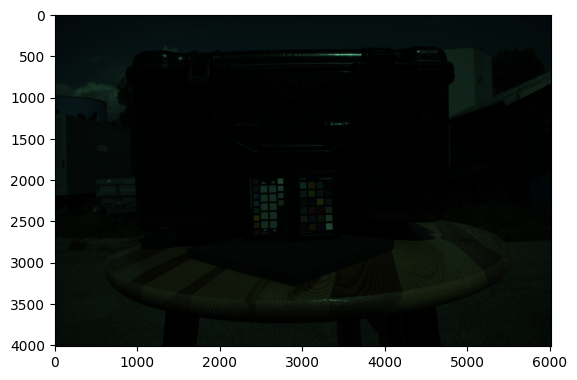

In [415]:
file_raw_0031o = ["data", "Outdoor", "SPD38", "INDIGO_2022-05-26_NikonD5600_0031.NEF"]
path_raw_0031o = os.path.join(*file_raw_0031o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "XRCCPP", "Illuminant": SPD38, "Observer":2}
image_0031o = RawImage(path_raw_0031o, metadata, method="postprocess")

image_0031o.show(method="matplotlib")

RAW RGB data extraction

In [416]:
has_colourchecker, corners, size_rect = image_0031o.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

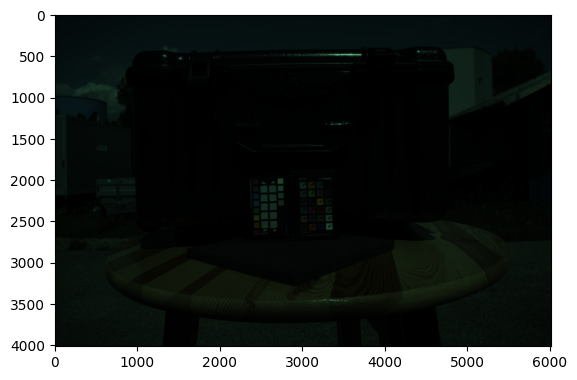

In [417]:
image_0031o.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [418]:
XRCCPP_RGB_SPD38 = image_0031o.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [419]:
data_xrccpp_spd38 = pd.merge(XRCCPP_XYZ_SPD38, XRCCPP_RGB_SPD38, on="patch_id")
data_xrccpp_spd38.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant SPD38.,11.891077,10.661176,6.390290,MeasuredIlluminant object: Illuminant SPD38.,327.857143,443.357143,262.846939
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant SPD38.,37.583495,33.737426,21.502524,MeasuredIlluminant object: Illuminant SPD38.,1095.234694,1483.464286,931.306122
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant SPD38.,16.155317,17.097936,27.811143,MeasuredIlluminant object: Illuminant SPD38.,389.056122,1092.846939,1101.500000
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant SPD38.,10.556210,12.861564,6.283393,MeasuredIlluminant object: Illuminant SPD38.,281.010204,656.448980,304.132653
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant SPD38.,22.403080,21.154695,34.993859,MeasuredIlluminant object: Illuminant SPD38.,607.632653,1338.734694,1376.857143
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant SPD38.,30.284882,41.298538,39.811491,MeasuredIlluminant object: Illuminant SPD38.,682.301020,2365.964286,1677.903061
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant SPD38.,38.245198,30.128705,5.931726,MeasuredIlluminant object: Illuminant SPD38.,1175.857143,1016.158163,305.035714
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant SPD38.,13.271713,11.802434,34.482086,MeasuredIlluminant object: Illuminant SPD38.,261.275510,825.438776,1178.551020
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant SPD38.,28.873330,19.122059,11.921118,MeasuredIlluminant object: Illuminant SPD38.,920.367347,639.801020,441.673469
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant SPD38.,8.760790,6.556860,12.706182,MeasuredIlluminant object: Illuminant SPD38.,240.642857,364.357143,434.357143


In [420]:
data_spd38.append(data_xrccpp_spd38)

### WPP

White - D1

In [421]:
patch_max = find_patch_max_value(data_xrccpp_spd38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [422]:
data_xrccpp_spd38 = apply_wpp(data_xrccpp_spd38, "D1")
data_xrccpp_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant SPD38.,0.153994,0.132413,0.086227,MeasuredIlluminant object: Illuminant SPD38.,0.157492,0.101701,0.083309
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant SPD38.,0.486722,0.419023,0.290144,MeasuredIlluminant object: Illuminant SPD38.,0.526116,0.340289,0.295175
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant SPD38.,0.209218,0.212359,0.375269,MeasuredIlluminant object: Illuminant SPD38.,0.186890,0.250686,0.349117
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant SPD38.,0.136707,0.159742,0.084785,MeasuredIlluminant object: Illuminant SPD38.,0.134988,0.150581,0.096394
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant SPD38.,0.290129,0.262744,0.472189,MeasuredIlluminant object: Illuminant SPD38.,0.291888,0.307089,0.436391
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant SPD38.,0.392202,0.512933,0.537196,MeasuredIlluminant object: Illuminant SPD38.,0.327756,0.542723,0.531806
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant SPD38.,0.495291,0.374202,0.080040,MeasuredIlluminant object: Illuminant SPD38.,0.564845,0.233094,0.096680
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant SPD38.,0.171874,0.146588,0.465284,MeasuredIlluminant object: Illuminant SPD38.,0.125509,0.189346,0.373538
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant SPD38.,0.373922,0.237498,0.160857,MeasuredIlluminant object: Illuminant SPD38.,0.442116,0.146763,0.139987
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant SPD38.,0.113456,0.081437,0.171451,MeasuredIlluminant object: Illuminant SPD38.,0.115597,0.083579,0.137668


In [423]:
data_xrccpp_spd38.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.335633,0.319868,0.286329,0.349046,0.299898,0.281721
std,0.231853,0.234386,0.238768,0.252440,0.225107,0.225549
min,0.041648,0.041565,0.045548,0.043096,0.042560,0.043897
25%,0.167404,0.151937,0.102467,0.134760,0.137758,0.126679
50%,0.277822,0.236056,0.208155,0.309822,0.241890,0.214348
75%,0.437909,0.441306,0.446331,0.468733,0.384546,0.387688
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [424]:
data_wpp_spd38.append(data_xrccpp_spd38)

### SCK100

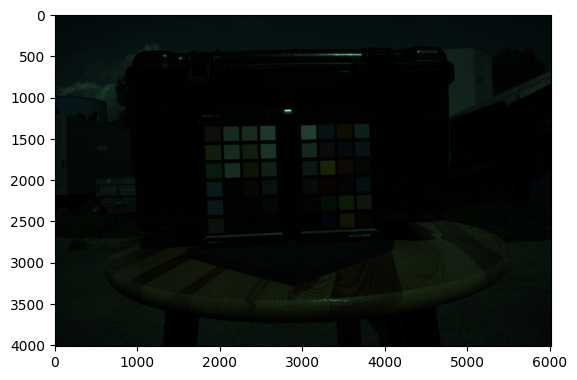

In [425]:
file_raw_0029o = ["data", "Outdoor", "SPD38", "INDIGO_2022-05-26_NikonD5600_0029.NEF"]
path_raw_0029o = os.path.join(*file_raw_0029o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "SCK100", "Illuminant": SPD38, "Observer":2}
image_0029o = RawImage(path_raw_0029o, metadata, method="postprocess")

image_0029o.show(method="matplotlib")

RAW RGB data extraction

In [426]:
has_colourchecker, corners, size_rect = image_0029o.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

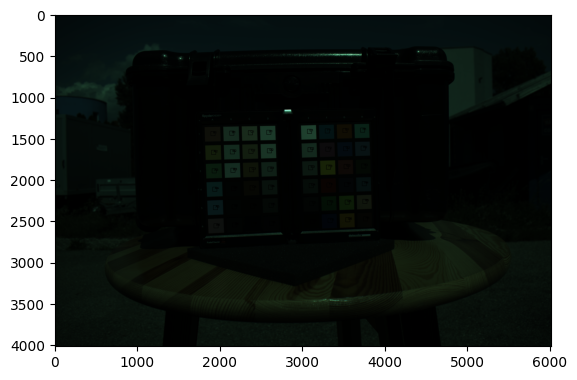

In [427]:
image_0029o.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [428]:
SCK100_RGB_SPD38 = image_0029o.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [429]:
data_sck100_spd38 = pd.merge(SCK100_XYZ_SPD38, SCK100_RGB_SPD38, on="patch_id")
data_sck100_spd38.insert(0, "ColourChecker", "SCK100")
data_sck100_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant SPD38.,36.589483,29.002199,18.884403,MeasuredIlluminant object: Illuminant SPD38.,962.998521,1011.403846,635.886095
1,SCK100,A2,MeasuredIlluminant object: Illuminant SPD38.,47.100036,48.091830,15.446829,MeasuredIlluminant object: Illuminant SPD38.,1180.715976,1841.721893,678.108728
2,SCK100,A3,MeasuredIlluminant object: Illuminant SPD38.,27.222282,35.837295,20.504365,MeasuredIlluminant object: Illuminant SPD38.,622.871672,1740.960799,894.332101
3,SCK100,A4,MeasuredIlluminant object: Illuminant SPD38.,24.772245,30.764313,44.381060,MeasuredIlluminant object: Illuminant SPD38.,477.312870,1716.603550,1556.602071
4,SCK100,A5,MeasuredIlluminant object: Illuminant SPD38.,26.699007,28.003448,48.533309,MeasuredIlluminant object: Illuminant SPD38.,540.440089,1525.369822,1582.976331
5,SCK100,A6,MeasuredIlluminant object: Illuminant SPD38.,34.604982,27.362907,30.370301,MeasuredIlluminant object: Illuminant SPD38.,907.349852,1075.562870,933.831361
6,SCK100,B1,MeasuredIlluminant object: Illuminant SPD38.,59.245651,60.108604,55.791131,MeasuredIlluminant object: Illuminant SPD38.,1349.738166,2670.075444,1944.861686
7,SCK100,B2,MeasuredIlluminant object: Illuminant SPD38.,56.271981,59.996549,54.735306,MeasuredIlluminant object: Illuminant SPD38.,1276.204142,2755.961538,1946.897559
8,SCK100,B3,MeasuredIlluminant object: Illuminant SPD38.,58.511341,60.196261,60.520247,MeasuredIlluminant object: Illuminant SPD38.,1366.260355,2822.365385,2133.233728
9,SCK100,B4,MeasuredIlluminant object: Illuminant SPD38.,6.035048,5.836987,5.285348,MeasuredIlluminant object: Illuminant SPD38.,120.292899,199.785503,144.244822


In [430]:
data_spd38.append(data_sck100_spd38)

### WPP

White - E1

In [431]:
patch_max = find_patch_max_value(data_sck100_spd38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [432]:
data_sck100_spd38 = apply_wpp(data_sck100_spd38, "E1")
data_sck100_spd38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant SPD38.,0.423715,0.323524,0.224013,MeasuredIlluminant object: Illuminant SPD38.,0.482309,0.245327,0.213099
1,SCK100,A2,MeasuredIlluminant object: Illuminant SPD38.,0.545430,0.536472,0.183235,MeasuredIlluminant object: Illuminant SPD38.,0.591351,0.446729,0.227248
2,SCK100,A3,MeasuredIlluminant object: Illuminant SPD38.,0.315241,0.399771,0.243230,MeasuredIlluminant object: Illuminant SPD38.,0.311960,0.422289,0.299709
3,SCK100,A4,MeasuredIlluminant object: Illuminant SPD38.,0.286869,0.343181,0.526463,MeasuredIlluminant object: Illuminant SPD38.,0.239058,0.416381,0.521649
4,SCK100,A5,MeasuredIlluminant object: Illuminant SPD38.,0.309181,0.312383,0.575718,MeasuredIlluminant object: Illuminant SPD38.,0.270675,0.369995,0.530488
5,SCK100,A6,MeasuredIlluminant object: Illuminant SPD38.,0.400734,0.305237,0.360263,MeasuredIlluminant object: Illuminant SPD38.,0.454438,0.260889,0.312946
6,SCK100,B1,MeasuredIlluminant object: Illuminant SPD38.,0.686079,0.670521,0.661813,MeasuredIlluminant object: Illuminant SPD38.,0.676005,0.647655,0.651763
7,SCK100,B2,MeasuredIlluminant object: Illuminant SPD38.,0.651643,0.669271,0.649288,MeasuredIlluminant object: Illuminant SPD38.,0.639176,0.668488,0.652446
8,SCK100,B3,MeasuredIlluminant object: Illuminant SPD38.,0.677576,0.671499,0.717911,MeasuredIlluminant object: Illuminant SPD38.,0.684280,0.684595,0.714891
9,SCK100,B4,MeasuredIlluminant object: Illuminant SPD38.,0.069887,0.065112,0.062697,MeasuredIlluminant object: Illuminant SPD38.,0.060248,0.048460,0.048339


In [433]:
data_sck100_spd38.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.352295,0.340599,0.304916,0.355041,0.315122,0.295666
std,0.248913,0.248738,0.250364,0.266218,0.248633,0.251656
min,0.047090,0.047131,0.048739,0.018762,0.018654,0.019412
25%,0.142515,0.137983,0.083301,0.122303,0.103702,0.077150
50%,0.312211,0.295110,0.233621,0.311820,0.266248,0.220173
75%,0.515768,0.490815,0.459350,0.550918,0.449838,0.438301
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [434]:
data_wpp_spd38.append(data_sck100_spd38)

## Merge data

In [435]:
data_pd_spd38 = pd.concat(data_spd38, ignore_index=True)

data_pd_spd38 = data_pd_spd38.drop(columns="illuminant_y")
data_pd_spd38 = data_pd_spd38.rename(columns={"illuminant_x":"illuminant"})
data_pd_spd38["illuminant"] = "SPD38" # as str to avoid error
data_pd_spd38

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,SPD38,17.019386,10.871192,14.000805,419.321995,260.684807,324.004535
1,CCDSG,B3,SPD38,39.099460,32.775758,44.825191,963.489796,1444.982993,1437.141723
2,CCDSG,B4,SPD38,15.293600,9.750916,24.760794,299.428571,320.317460,601.519274
3,CCDSG,B5,SPD38,18.983367,21.458387,53.076720,285.494898,1379.146259,1795.289116
4,CCDSG,B6,SPD38,24.444401,31.933887,50.187256,443.564626,1921.079365,1854.619048
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,SPD38,25.121599,23.837313,39.637589,540.559172,1202.349112,1258.618343
212,SCK100,H3,SPD38,10.529568,13.067079,6.374851,219.113166,530.809911,222.400888
213,SCK100,H4,SPD38,17.586503,18.875761,30.838330,333.825444,972.045858,963.610947
214,SCK100,H5,SPD38,38.344772,34.811550,22.347540,1049.292160,1381.551036,820.197485


In [436]:
data_pd_wpp_spd38 = pd.concat(data_wpp_spd38, ignore_index=True)

data_pd_wpp_spd38 = data_pd_wpp_spd38.drop(columns="illuminant_y")
data_pd_wpp_spd38 = data_pd_wpp_spd38.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_spd38["illuminant"] = "SPD38" # as str to avoid error
data_pd_wpp_spd38

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,SPD38,0.194845,0.119592,0.164366,0.195677,0.058815,0.101226
1,CCDSG,B3,SPD38,0.447627,0.360561,0.526236,0.449613,0.326016,0.448994
2,CCDSG,B4,SPD38,0.175087,0.107268,0.290685,0.139728,0.072270,0.187927
3,CCDSG,B5,SPD38,0.217329,0.236061,0.623106,0.133226,0.311162,0.560886
4,CCDSG,B6,SPD38,0.279850,0.351300,0.589185,0.206990,0.433432,0.579422
...,...,...,...,...,...,...,...,...,...
211,SCK100,H2,SPD38,0.290914,0.265909,0.470194,0.270734,0.291643,0.421789
212,SCK100,H3,SPD38,0.121935,0.145765,0.075621,0.109741,0.128754,0.074531
213,SCK100,H4,SPD38,0.203656,0.210562,0.365814,0.167194,0.235780,0.322926
214,SCK100,H5,SPD38,0.444042,0.388328,0.265094,0.525529,0.335110,0.274865


## Export data as CSV

Merge all data

In [437]:
data_LR = pd.concat([data_pd_jnd65, data_pd_jna, data_pd_jnf, data_pd_jnd50, data_pd_spd32, data_pd_spd33, data_pd_spd38], ignore_index=True)

In [438]:
data_LR["X"] = data_LR["X"]/100
data_LR["Y"] = data_LR["Y"]/100
data_LR["Z"] = data_LR["Z"]/100

In [439]:
data_LR

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JND65,0.168127,0.108024,0.166186,767.647392,549.112812,747.948980
1,CCDSG,B3,JND65,0.394346,0.329145,0.538508,1689.476474,2823.451814,3162.307256
2,CCDSG,B4,JND65,0.154988,0.098139,0.295052,496.621032,633.023526,1272.869048
3,CCDSG,B5,JND65,0.204506,0.223729,0.642551,469.173186,2477.882370,3537.914116
4,CCDSG,B6,JND65,0.255989,0.328012,0.607165,680.032313,3181.295351,3443.649093
...,...,...,...,...,...,...,...,...,...
1507,SCK100,H2,SPD38,0.251216,0.238373,0.396376,540.559172,1202.349112,1258.618343
1508,SCK100,H3,SPD38,0.105296,0.130671,0.063749,219.113166,530.809911,222.400888
1509,SCK100,H4,SPD38,0.175865,0.188758,0.308383,333.825444,972.045858,963.610947
1510,SCK100,H5,SPD38,0.383448,0.348116,0.223475,1049.292160,1381.551036,820.197485


In [440]:
path_csv = os.path.join("res", "csv", "NikonD5600_LR_Data.csv")
data_LR.to_csv(path_csv, sep=";")

Merge all data

In [441]:
data_WPP = pd.concat([data_pd_wpp_jnd65, data_pd_wpp_jna, data_pd_wpp_jnf, data_pd_wpp_jnd50, data_pd_wpp_spd32, data_pd_wpp_spd33, data_pd_wpp_spd38], ignore_index=True)

In [442]:
data_WPP

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JND65,0.192153,0.118824,0.161651,0.216193,0.069274,0.114293
1,CCDSG,B3,JND65,0.450698,0.362052,0.523813,0.475808,0.356195,0.483228
2,CCDSG,B4,JND65,0.177136,0.107950,0.287000,0.139864,0.079860,0.194506
3,CCDSG,B5,JND65,0.233731,0.246097,0.625016,0.132133,0.312600,0.540624
4,CCDSG,B6,JND65,0.292570,0.360806,0.590597,0.191518,0.401339,0.526220
...,...,...,...,...,...,...,...,...,...
1507,SCK100,H2,SPD38,0.290914,0.265909,0.470194,0.270734,0.291643,0.421789
1508,SCK100,H3,SPD38,0.121935,0.145765,0.075621,0.109741,0.128754,0.074531
1509,SCK100,H4,SPD38,0.203656,0.210562,0.365814,0.167194,0.235780,0.322926
1510,SCK100,H5,SPD38,0.444042,0.388328,0.265094,0.525529,0.335110,0.274865


In [ ]:
path_csv = os.path.join("res", "csv", "NikonD5600_WPP_Data.csv")
data_WPP.to_csv(path_csv, sep=";")